# Dataset Description

In [2]:
# This dataset was created from the RAVDESS dataset 
# (https://es.sonicurlprotectionfra.com/click?PV=2&MSGID=202209141411100289250&URLID=1&ESV=10.0.18.7423&IV=CDD893A9D96AB6D6469DFBAF03B52C7A&TT=1663164671774&ESN=SJ44mpH7HPEgdwadIHqGKE9aHAKB%2FGfCfiESv9Jnnj4%3D&KV=1536961729280&B64_ENCODED_URL=aHR0cHM6Ly96ZW5vZG8ub3JnL3JlY29yZC8xMTg4OTc2KSw&HK=3428F8A9C48043894424396B826370722E127A5AEC482B778236DC3B3D0A300B 

# extracting basic statistics (mean, std, min, max, etc.) from the original audio data and after transforming it using: zero-crossing rate, Mel-Frequency Cepstral Coefficients, spectral centroid, and the stft chromagram. 

# Features were extracted from the 2452 wav files.

# Main Features:
# •	modality (audio-only)
# •	vocal_channel (speech, song)
# •	emotion (neutral, calm, happy, sad, angry, fearful, disgust, surprised)
# •	emotional_intensity (normal, strong). NOTE: There is no strong intensity for the 'neutral' emotion
# •	statement ("Kids are talking by the door", "Dogs are sitting by the door")
# •	repetition (1st repetition, 2nd repetition)
# •	actor (01 to 24)
# •	sex (M, F)
# •	channels (number of channels; 1 for mono, 2 for stereo audio)
# •	sample_width (number of bytes per sample; 1 means 8-bit, 2 means 16-bit)
# •	frame_rate (frequency of samples used (in Hertz))
# •	frame_width (Number of bytes for each âframeâ. One frame contains a sample for each channel.)
# •	length_ms (audio file length (in milliseconds))
# •	frame_count (the number of frames from the sample)
# •	intensity (loudness in dBFS (dB relative to the maximum possible loudness))

# Features Extracted:
# Skew: Skewness is a measure of symmetry, or more precisely, the lack of symmetry. 
#           A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.

# Kur: Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution.That is, data sets with high kurtosis tend to have heavy tails, or outliers. 
# Data sets with low kurtosis tend to have light tails, or lack of outliers.
# In other words, tails represent how often outliers occur.

# •	(sum of the zero-crossing rate): zero_crossings_sum (sum of the zero-crossing rate)
# The zero-crossing rate is the rate at which a signal changes from positive to zero to negative or from negative to zero to positive.

# •	(statistics of the original audio signal): 'mean', 'std', 'min', 'max', 'kur', 'skew' 

# •	(statistics of the Mel-Frequency Cepstral Coefficients) : mfcc_ 'mean', 'std', 'min', 'max' 
# Mel Frequency Cepstral Coefficents (MFCCs or MFCC) are a feature widely used in automatic speech and speaker recognition.

# •	(statistics of the spectral centroid) : sc_ 'mean', 'std', 'min', 'max', 'kur', 'skew' 
# A sound spectrum is a representation of a sound – usually a short sample of a sound – in terms of the amount of vibration at each individual frequency. The center of gravity of the spectrum.

# •	(statistics of the stft chromagram) : stft_ 'mean', 'std', 'min', 'max', 'kur', 'skew'
#  A 12-element representation of the spectral energy where the bins represent the 12 equal-tempered pitch classes of western-type music (semitone spacing).


# Data Preparation

In [3]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, kurtosis

In [4]:
# Importing Dataset
df = pd.read_csv("ravdess_features.csv")

In [5]:
df.head()

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.0,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,0.0,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,0.0,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,0.0,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.0,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872


In [6]:
# df11 = df.drop(df.columns[[1, 7, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]], axis=1, inplace=True)
# df11.tail(100)

In [7]:
# # Skew and kurtosis before removing missing values and outliers.
# a = df.replace({"vocal_channel": vocal_channel_map})
# print("skew with outliers: {}".format(a['vocal_channel'].astype(float).skew()))
# print("kurtosis with outliers: {}".format(a['vocal_channel'].astype(float).kurt()))

In [8]:
cols = [col for col in df.columns if col!="class"]
cols

['modality',
 'vocal_channel',
 'emotion',
 'emotional_intensity',
 'statement',
 'repetition',
 'actor',
 'sex',
 'channels',
 'sample_width',
 'frame_rate',
 'frame_width',
 'length_ms',
 'frame_count',
 'intensity',
 'zero_crossings_sum',
 'mfcc_mean',
 'mfcc_std',
 'mfcc_min',
 'mfcc_max',
 'sc_mean',
 'sc_std',
 'sc_min',
 'sc_max',
 'sc_kur',
 'sc_skew',
 'stft_mean',
 'stft_std',
 'stft_min',
 'stft_max',
 'stft_kur',
 'stft_skew',
 'mean',
 'std',
 'min',
 'max',
 'kur',
 'skew']

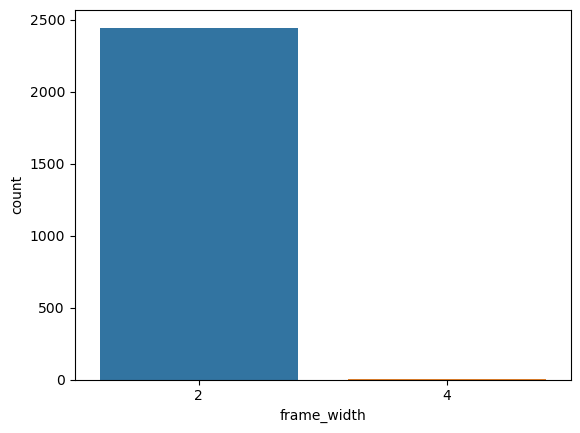

2    2446
4       6
Name: frame_width, dtype: int64

In [9]:
df["frame_width"].unique()
sns.countplot(data=df, x="frame_width", dodge=False)
plt.show()
df["frame_width"].value_counts()

In [10]:
df["repetition"].value_counts()

2nd    1226
1st    1226
Name: repetition, dtype: int64

In [11]:
# As the unique values of frame-width (2, 4). Out of which only .24% of data has value 4 and rest 99.76% data has value 2.
# So, we are dropping "frame width" column.

df.drop(columns="frame_width",axis=1, inplace=True)

1    2446
2       6
Name: channels, dtype: int64
[1 2]


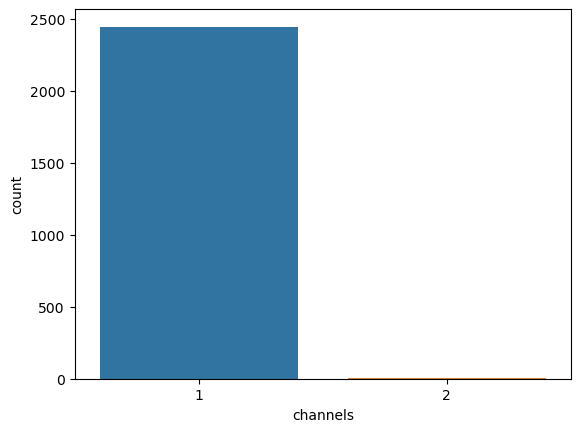

In [12]:
print(df["channels"].value_counts())
print(df["channels"].unique())
sns.countplot(data=df, x="channels", dodge=False)
plt.show()

In [13]:
# As the unique values of frame-width (2, 4). Out of which only .24% of data has value 4 and rest 99.76% data has value 2.
# So, we are dropping "frame width" column.

df.drop(columns="channels",axis=1, inplace=True)

In [14]:
df["zero_crossings_sum"]

0       16995
1       13906
2       18723
3       11617
4       15137
        ...  
2447     9871
2448     8963
2449     9765
2450     9716
2451     9427
Name: zero_crossings_sum, Length: 2452, dtype: int64

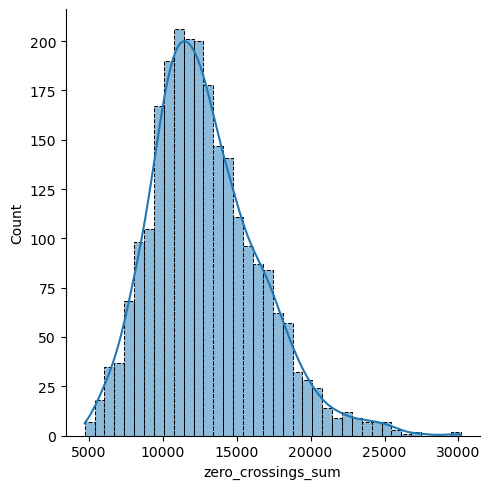

In [15]:
sns.displot(data=df,x='zero_crossings_sum',kde=True,edgecolor='black',lw=4,ls='--')

In [16]:
df["skew"]

0       0.273153
1       0.292157
2       0.302659
3      -0.081014
4       0.414872
          ...   
2447    0.759247
2448    1.073633
2449   -0.005821
2450   -0.110966
2451    1.032081
Name: skew, Length: 2452, dtype: float64

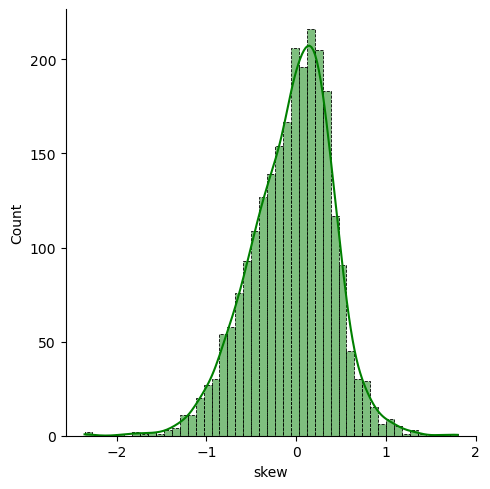

In [17]:
sns.set_palette("bright")
sns.displot(data=df,x='skew',kde=True,color = "green", edgecolor='black',lw=4,ls='--')

In [18]:
df[["intensity", "vocal_channel", "emotional_intensity", "emotion", "statement"]]

,intensity,vocal_channel,emotional_intensity,emotion,statement
0,-36.793432,speech,normal,fearful,Dogs are sitting by the door
1,NaN,speech,normal,angry,Dogs are sitting by the door
2,-32.290737,NaN,strong,happy,Dogs are sitting by the door
3,-49.019839,NaN,normal,surprised,Kids are talking by the door
4,-31.214503,song,strong,happy,Dogs are sitting by the door
...,...,...,...,...,...
2447,NaN,speech,strong,calm,Kids are talking by the door
2448,-43.342901,speech,normal,calm,Dogs are sitting by the door
2449,NaN,song,strong,sad,Dogs are sitting by the door
2450,-45.751265,speech,normal,surprised,Kids are talking by the door


In [19]:
# Getting Information about Data Set
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2452 entries, 0 to 2451
Data columns (total 36 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   modality             2452 non-null   object 
 1   vocal_channel        2256 non-null   object 
 2   emotion              2452 non-null   object 
 3   emotional_intensity  2452 non-null   object 
 4   statement            2452 non-null   object 
 5   repetition           2452 non-null   object 
 6   actor                1326 non-null   float64
 7   sex                  2452 non-null   object 
 8   sample_width         2452 non-null   int64  
 9   frame_rate           2452 non-null   int64  
 10  length_ms            2452 non-null   int64  
 11  frame_count          2452 non-null   float64
 12  intensity            1636 non-null   float64
 13  zero_crossings_sum   2452 non-null   int64  
 14  mfcc_mean            2452 non-null   float64
 15  mfcc_std             2452 non-null   f

In [20]:
# Getting total length of the Data Set
df.index

RangeIndex(start=0, stop=2452, step=1)

In [21]:
# Basic Statistical Data about the attributes
df.describe()

,actor,sample_width,frame_rate,length_ms,frame_count,intensity,zero_crossings_sum,mfcc_mean,mfcc_std,mfcc_min,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
count,1326.000000,2452.0,2452.0,2452.000000,2452.000000,1636.000000,2452.000000,2452.000000,2452.000000,2452.000000,...,2452.000000,2452.0,2452.000000,2452.000000,2.452000e+03,2452.000000,2452.000000,2452.000000,2452.000000,2452.000000
mean,12.582202,2.0,48000.0,4092.151305,193587.188010,-37.625332,12885.314029,-28.769180,136.777233,-758.909381,...,0.002272,1.0,-1.247929,0.112889,1.393649e-08,0.020504,-0.164871,0.179839,11.203002,-0.048245
std,6.916240,0.0,0.0,598.321526,36825.369056,8.451982,3665.319584,4.461886,20.451689,99.945452,...,0.004830,0.0,0.211781,0.330759,4.267587e-05,0.021024,0.175443,0.195539,6.614859,0.454925
min,1.000000,2.0,48000.0,2936.000000,-1.000000,-63.864613,4721.000000,-43.812923,83.621370,-1085.479700,...,0.000000,1.0,-1.669603,-0.993957,-9.435575e-04,0.000652,-0.998810,0.004669,1.757794,-2.356526
25%,7.000000,2.0,48000.0,3604.000000,172972.000000,-43.539869,10362.500000,-31.828597,122.623928,-826.464075,...,0.000000,1.0,-1.390612,-0.094334,-1.394488e-06,0.006791,-0.202431,0.055489,6.519988,-0.336624
50%,13.000000,2.0,48000.0,4004.000000,190591.000000,-37.072745,12383.500000,-28.681109,136.523810,-760.983065,...,0.000190,1.0,-1.292105,0.126065,-9.810701e-08,0.013880,-0.103775,0.109726,9.828686,0.004256
75%,19.000000,2.0,48000.0,4538.000000,217817.000000,-31.591309,14966.000000,-25.550238,151.385135,-692.890015,...,0.001999,1.0,-1.152519,0.335574,8.363511e-07,0.026154,-0.054352,0.224487,14.085435,0.262978
max,24.000000,2.0,48000.0,6373.000000,305906.000000,-16.353953,30153.000000,-15.491450,195.942920,-461.489320,...,0.039378,1.0,0.794669,1.465815,1.222810e-03,0.152168,-0.006134,0.999146,59.085695,1.799676


In [22]:
# Getting total columns
all_cols = list(df.columns)
all_cols

['modality',
 'vocal_channel',
 'emotion',
 'emotional_intensity',
 'statement',
 'repetition',
 'actor',
 'sex',
 'sample_width',
 'frame_rate',
 'length_ms',
 'frame_count',
 'intensity',
 'zero_crossings_sum',
 'mfcc_mean',
 'mfcc_std',
 'mfcc_min',
 'mfcc_max',
 'sc_mean',
 'sc_std',
 'sc_min',
 'sc_max',
 'sc_kur',
 'sc_skew',
 'stft_mean',
 'stft_std',
 'stft_min',
 'stft_max',
 'stft_kur',
 'stft_skew',
 'mean',
 'std',
 'min',
 'max',
 'kur',
 'skew']

In [23]:
df.dtypes[df.dtypes == "object"]

modality               object
vocal_channel          object
emotion                object
emotional_intensity    object
statement              object
repetition             object
sex                    object
dtype: object

In [24]:
# Getting,
# Numeric Columns
numeric_cols = list(df._get_numeric_data().columns)
numeric_cols

['actor',
 'sample_width',
 'frame_rate',
 'length_ms',
 'frame_count',
 'intensity',
 'zero_crossings_sum',
 'mfcc_mean',
 'mfcc_std',
 'mfcc_min',
 'mfcc_max',
 'sc_mean',
 'sc_std',
 'sc_min',
 'sc_max',
 'sc_kur',
 'sc_skew',
 'stft_mean',
 'stft_std',
 'stft_min',
 'stft_max',
 'stft_kur',
 'stft_skew',
 'mean',
 'std',
 'min',
 'max',
 'kur',
 'skew']

In [25]:
cat_cols = 1

In [26]:
# Getting,
# Categorical Columns
categorical_cols = list(set(df.columns) - set(numeric_cols))
categorical_cols

['statement',
 'sex',
 'emotional_intensity',
 'repetition',
 'modality',
 'emotion',
 'vocal_channel']

In [27]:
print("We have {} Numeric Attributes and {} Categorical Attributes". format(len(numeric_cols), len(categorical_cols)))

We have 29 Numeric Attributes and 7 Categorical Attributes


In [28]:
# Getting unique values for all categorical columns
# to convert it to numeric values for further processing
for x in categorical_cols:
    print("{}: {}".format(x, df[x].unique()))

statement: ['Dogs are sitting by the door' 'Kids are talking by the door']
sex: ['F' 'M']
emotional_intensity: ['normal' 'strong']
repetition: ['2nd' '1st']
modality: ['audio-only']
emotion: ['fearful' 'angry' 'happy' 'surprised' 'neutral' 'calm' 'sad' 'disgust']
vocal_channel: ['speech' nan 'song']


In [29]:
# Checking categorical columns if any exist, after conversion
df.dtypes[df.dtypes == "object"]

modality               object
vocal_channel          object
emotion                object
emotional_intensity    object
statement              object
repetition             object
sex                    object
dtype: object

In [30]:
df[numeric_cols]

,actor,sample_width,frame_rate,length_ms,frame_count,intensity,zero_crossings_sum,mfcc_mean,mfcc_std,mfcc_min,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,2.0,2,48000,3737,179379.0,-36.793432,16995,-33.485947,134.654860,-755.22345,...,0.000000,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,16.0,2,48000,3904,187387.0,NaN,13906,-29.502108,130.485630,-713.98560,...,0.000000,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,16.0,2,48000,4671,224224.0,-32.290737,18723,-30.532463,126.577110,-726.06036,...,0.000000,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,14.0,2,48000,3637,174575.0,-49.019839,11617,-36.059555,159.725160,-842.94635,...,0.000000,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,2.0,2,48000,4404,211411.0,-31.214503,15137,-31.405996,122.125824,-700.70276,...,0.000000,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,23.0,2,48000,4605,221021.0,NaN,9871,-30.225578,158.845500,-855.92420,...,0.000000,1.0,-1.075888,-0.310088,9.367040e-07,0.005260,-0.039856,0.052399,9.551363,0.759247
2448,23.0,2,48000,4171,200200.0,-43.342901,8963,-31.160332,157.499700,-825.37410,...,0.000000,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633
2449,23.0,2,48000,5239,251451.0,NaN,9765,-26.135280,138.133210,-768.36536,...,0.000000,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821
2450,NaN,2,48000,3737,179379.0,-45.751265,9716,-28.242815,159.943400,-868.09576,...,0.001565,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966


In [31]:
len(numeric_cols)

29

<AxesSubplot:title={'center':'skew'}>

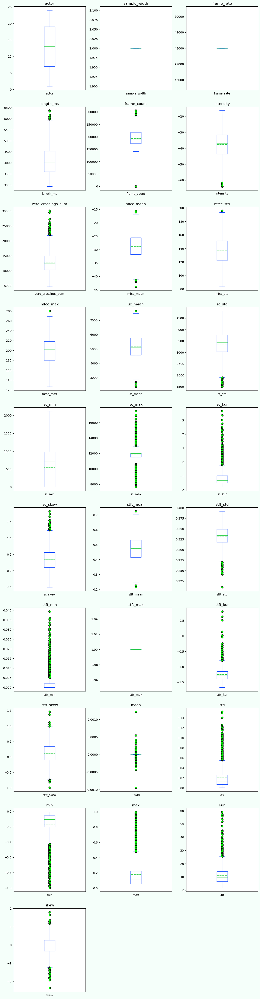

In [32]:
# Boxplot of all numerical attributes
#Istogrammi di tutti gli attributi numerici

df_no_str = df[numeric_cols]
green_diamond = dict(markerfacecolor='lime', marker='D')

fig = plt.figure(figsize=(20, 60), edgecolor = "black",facecolor='mintcream') 
fig_dims = (10, 4)

plt.subplot2grid(fig_dims, (0, 0))
df["actor"].plot.box(title = "actor",showmeans = True, meanline = True,flierprops=green_diamond)
    
plt.subplot2grid(fig_dims, (0, 1))
df['sample_width'].plot.box(title = 'sample_width',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (0, 2))
df['frame_rate'].plot.box(title = 'frame_rate',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 0))
df["length_ms"].plot.box(title = "length_ms",showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 1))
df['frame_count'].plot.box(title = 'frame_count',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 2))
df['intensity'].plot.box(title = 'intensity',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 0))
df['zero_crossings_sum'].plot.box(title = 'zero_crossings_sum',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 1))
df['mfcc_mean'].plot.box(title = 'mfcc_mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 2))
df['mfcc_std'].plot.box(title = 'mfcc_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (3, 0))
df['mfcc_max'].plot.box(title = 'mfcc_max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (3, 1))
df['sc_mean'].plot.box(title = 'sc_mean',showmeans = True, meanline = True,flierprops=green_diamond)
    
plt.subplot2grid(fig_dims, (3, 2))
df['sc_std'].plot.box(title = 'sc_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 0))
df['sc_min'].plot.box(title = 'sc_min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 1))
df['sc_max'].plot.box(title = 'sc_max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 2))
df['sc_kur'].plot.box(title = 'sc_kur',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 0))
df['sc_skew'].plot.box(title = 'sc_skew',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 1))
df['stft_mean'].plot.box(title = 'stft_mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 2))
df['stft_std'].plot.box(title = 'stft_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (6, 0))
df['stft_min'].plot.box(title = 'stft_min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (6, 1))
df['stft_max'].plot.box(title = 'stft_max',showmeans = True, meanline = True,flierprops=green_diamond)  
                          
plt.subplot2grid(fig_dims, (6, 2))
df["stft_kur"].plot.box(title = "stft_kur",showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 0))
df['stft_skew'].plot.box(title = 'stft_skew',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 1))
df['mean'].plot.box(title = 'mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 2))
df['std'].plot.box(title = 'std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 0))
df['min'].plot.box(title = 'min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 1))
df['max'].plot.box(title = 'max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 2))
df['kur'].plot.box(title = 'kur',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (9, 0))
df['skew'].plot.box(title = 'skew',showmeans = True, meanline = True,flierprops=green_diamond)  
                          
                        

## Missing Values

In [33]:
# Getting number of Missing Values
df.isnull().sum()

modality                  0
vocal_channel           196
emotion                   0
emotional_intensity       0
statement                 0
repetition                0
actor                  1126
sex                       0
sample_width              0
frame_rate                0
length_ms                 0
frame_count               0
intensity               816
zero_crossings_sum        0
mfcc_mean                 0
mfcc_std                  0
mfcc_min                  0
mfcc_max                  0
sc_mean                   0
sc_std                    0
sc_min                    0
sc_max                    0
sc_kur                    0
sc_skew                   0
stft_mean                 0
stft_std                  0
stft_min                  0
stft_max                  0
stft_kur                  0
stft_skew                 0
mean                      0
std                       0
min                       0
max                       0
kur                       0
skew                

In [34]:
# Evaluating Missing Values in Percentage
def percentage_missing(df):
    percent_nan = round(100  * df.isnull().sum() / len(df), 2)
    percent_nan = percent_nan[percent_nan > 0].sort_values()
    return percent_nan

percent_nan = percentage_missing(df)
percent_nan

vocal_channel     7.99
intensity        33.28
actor            45.92
dtype: float64

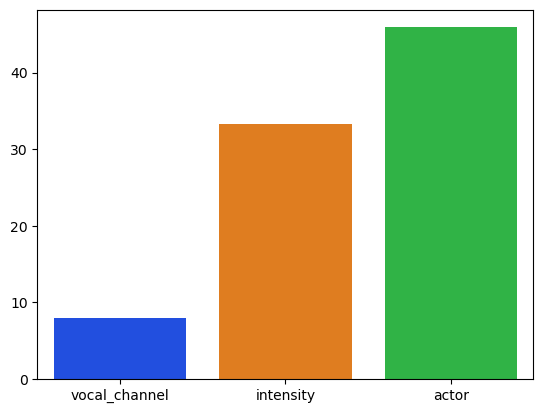

In [35]:
# Visualizing Missing Data before filling null values
sns.barplot(x = percent_nan.index, y= percent_nan)
plt.show()

In [36]:
categorical_cols

['statement',
 'sex',
 'emotional_intensity',
 'repetition',
 'modality',
 'emotion',
 'vocal_channel']

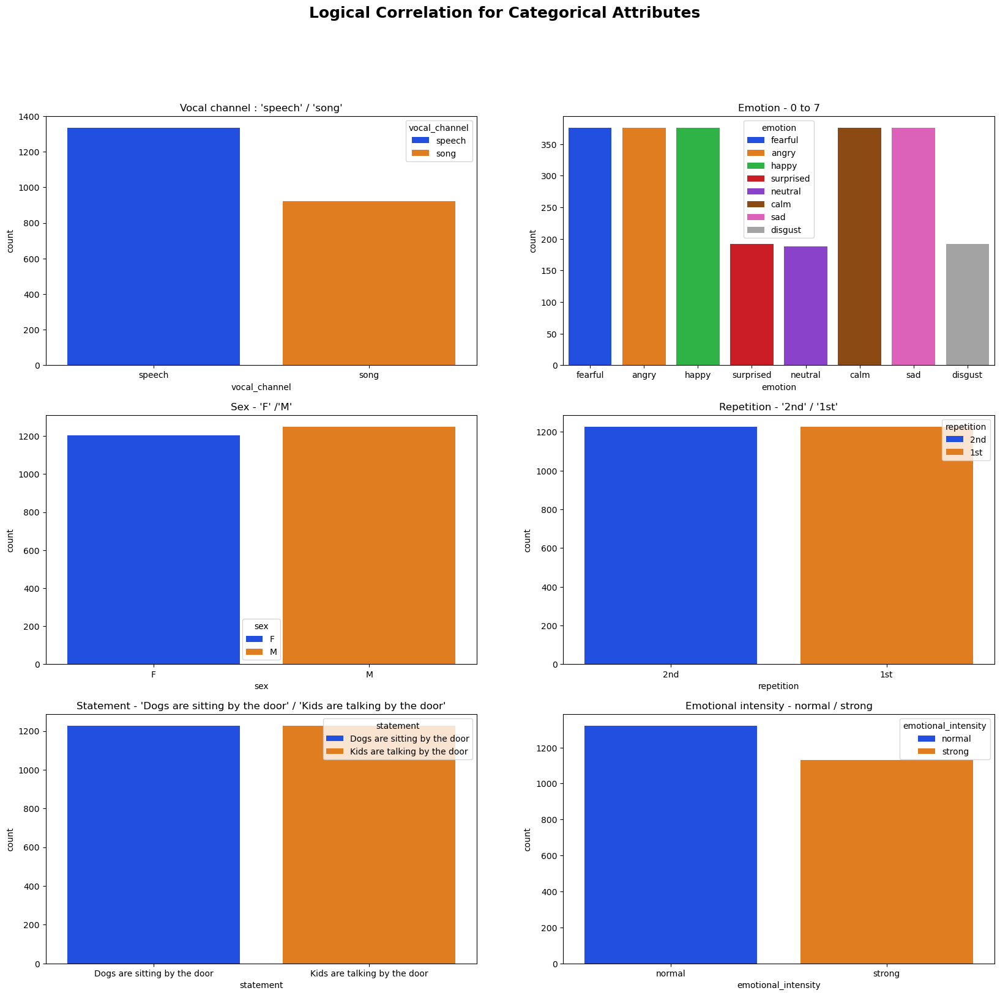

In [37]:
# axes = (ax1, ax2, ax3, ax4, ax5, ax6)
fig, [[ax1, ax2], [ax3, ax4], [ax5, ax6]] = plt.subplots(3, 2, figsize = (20,18)) #checking the distribution

sns.countplot(data=df, x="vocal_channel", ax= ax1, hue = "vocal_channel", dodge=False)
ax1.set_title("Vocal channel : 'speech' / 'song'")

sns.countplot(data=df, x="emotion", ax= ax2, hue = "emotion", dodge=False)
# plt.xticks(rotation =90
ax2.set_title("Emotion - 0 to 7")

sns.countplot(data=df, x="sex", ax= ax3, hue = "sex", dodge=False)
ax3.set_title("Sex - 'F' /'M'")

sns.countplot(data=df, x="repetition", ax= ax4, hue = "repetition", dodge=False)
ax4.set_title("Repetition - '2nd' / '1st'")

sns.countplot(data=df, x="statement", ax= ax5, hue = "statement", dodge=False)
ax5.set_title("Statement - 'Dogs are sitting by the door' / 'Kids are talking by the door'")

sns.countplot(data=df, x="emotional_intensity", ax= ax6, hue = "emotional_intensity", dodge=False)
ax6.set_title("Emotional intensity - normal / strong")

plt.suptitle("Logical Correlation for Categorical Attributes",fontsize = 18, fontweight='bold')
plt.show()

In [38]:
# Converting Categorical Attributes to Numeric Values

statement_map = {"Dogs are sitting by the door": 0, "Kids are talking by the door": 1}

emotional_intensity_map = {"normal": 0, "strong": 1}

emotion_map = {'neutral':0, 'calm':1, 'happy':2, 'sad':3, 'angry':4, 'fearful':5, 'disgust':6, 'surprised':7}

modality_map = {"audio-only": 0}

repetition_map = {"1st": 0, "2nd": 1}

vocal_channel_map = {"speech": 0, "song": 1}

sex_map = {"M": 0, "F": 1}

df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
            "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
           "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

0.0    1335
1.0     921
Name: vocal_channel, dtype: int64


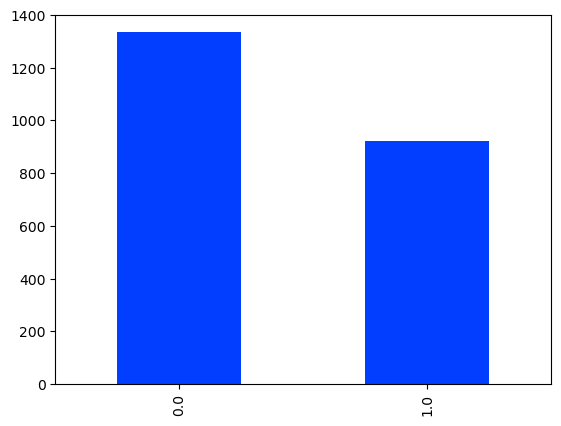

In [39]:
# Unique Value counts
# vocal_channel
print(df["vocal_channel"].value_counts())
df["vocal_channel"].value_counts().plot.bar()
plt.show()

In [40]:
df['vocal_channel'].mode()

0    0.0
Name: vocal_channel, dtype: float64

In [41]:
# df["x"].fillna(.df["x"]mode())

In [42]:
df['vocal_channel'].fillna(df['vocal_channel'].mode()[0])

0       0.0
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
2447    0.0
2448    0.0
2449    1.0
2450    0.0
2451    0.0
Name: vocal_channel, Length: 2452, dtype: float64

In [43]:
# Filling Missing Values ("vocal_channel")
# Trying with mean and median
# print(df['vocal_channel'].mean()) # We cant use becuase we have to fill with either 1 or 0, not a float value
# print(df['vocal_channel'].median()) # Both median and mode gives the same value, 0 (but we prefer the highest occurence)

# Now, filling missing value with mode
df['vocal_channel'].fillna(df['vocal_channel'].mode()[0], inplace=True)

In [44]:
# Checking vocal_channel attribute, if it has null values still
df['vocal_channel'].isnull().sum()

0

In [45]:
# Checking Percentage Nan after filling vocal channel
percent_nan = percentage_missing(df)
percent_nan

intensity    33.28
actor        45.92
dtype: float64

In [46]:
# Unique Value counts
# intensity
# df["intensity"].value_counts()
# Does"nt make sense to plot, becuase intensity is a continuous value attribute

In [47]:
# Filling Missing Values ("intensity")
df["intensity"].describe()

count    1636.000000
mean      -37.625332
std         8.451982
min       -63.864613
25%       -43.539869
50%       -37.072745
75%       -31.591309
max       -16.353953
Name: intensity, dtype: float64

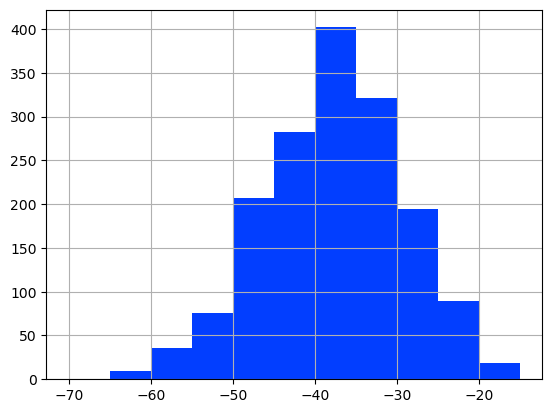

In [48]:
# Histogram before filling missing values
df['intensity'].hist(bins=np.arange(-70,-10,5))
plt.show()

In [49]:
categorical_cols

['statement',
 'sex',
 'emotional_intensity',
 'repetition',
 'modality',
 'emotion',
 'vocal_channel']

In [50]:
df.corr()["intensity"].sort_values()

mfcc_std              -0.978744
min                   -0.810253
sc_std                -0.440724
mfcc_max              -0.386237
stft_mean             -0.355795
sc_mean               -0.333510
stft_min              -0.277603
sc_max                -0.223566
kur                   -0.174999
stft_kur              -0.082772
statement             -0.061896
mean                   0.016175
repetition             0.023421
actor                  0.061923
sex                    0.084475
sc_min                 0.110529
emotion                0.206510
frame_count            0.215516
stft_std               0.254968
vocal_channel          0.290464
length_ms              0.293782
sc_kur                 0.369371
emotional_intensity    0.372473
stft_skew              0.391700
skew                   0.411307
sc_skew                0.418625
zero_crossings_sum     0.497906
mfcc_mean              0.610094
max                    0.808436
std                    0.845225
mfcc_min               0.973981
intensit

In [51]:
type(categorical_cols)

list

In [52]:
# Checking corelation with all categorical attributes
corr_inten = categorical_cols + ["intensity"]
df[corr_inten].corr()["intensity"].sort_values()

statement             -0.061896
repetition             0.023421
sex                    0.084475
emotion                0.206510
vocal_channel          0.290464
emotional_intensity    0.372473
intensity              1.000000
modality                    NaN
Name: intensity, dtype: float64

In [53]:
# We have to fill missing values of intensity using Emotion, emotional intensity and vocal channel (By Intution)
df['intensity'] = df['intensity'].groupby(
    [df['emotional_intensity'], df["vocal_channel"], df['emotion']]).apply(lambda x: x.fillna(x.mean()))
df['intensity'].groupby(
    [df['emotional_intensity'], df["vocal_channel"], df['emotion']]).mean()

emotional_intensity  vocal_channel  emotion
0                    0.0            0         -46.112212
                                    1         -48.044535
                                    2         -40.756993
                                    3         -48.324942
                                    4         -36.663681
                                    5         -40.431263
                                    6         -44.372406
                                    7         -40.995773
                     1.0            0         -37.407659
                                    1         -39.059685
                                    2         -33.632325
                                    3         -38.660568
                                    4         -31.828173
                                    5         -37.385224
1                    0.0            1         -47.596807
                                    2         -30.971452
                                    3       

In [54]:
# df["intensity"].describe() before filling missing values
# count    1636.000000
# mean      -37.625332
# std         8.451982
# min       -63.864613
# 25%       -43.539869
# 50%       -37.072745
# 75%       -31.591309
# max       -16.353953
# Name: intensity, dtype: float64

In [55]:
# df['intensity'].describe() After filling missing values
# The statistical values are intact with the previous values, 
# meaning that the values filled are with in the normal distribution
df['intensity'].describe() 

count    2452.000000
mean      -37.636534
std         7.881926
min       -63.864613
25%       -42.850759
50%       -37.407659
75%       -31.828173
max       -16.353953
Name: intensity, dtype: float64

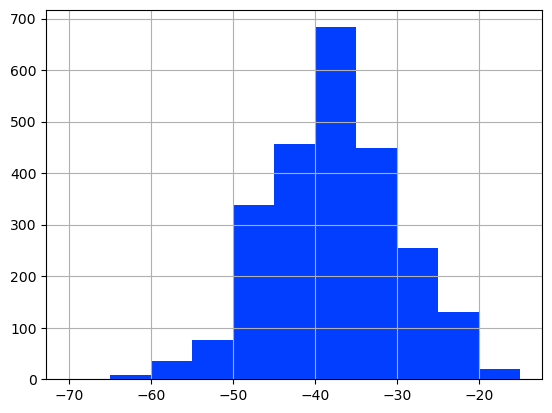

In [56]:
# Histogram after filling missing values
df['intensity'].hist(bins=np.arange(-70,-10,5))
plt.show()

In [57]:
# Checking Percentage Nan after filling intensity
percent_nan = percentage_missing(df)
percent_nan

actor    45.92
dtype: float64

1.0     51
2.0     58
3.0     51
4.0     52
5.0     58
6.0     55
7.0     51
8.0     61
9.0     51
10.0    56
11.0    55
12.0    63
13.0    60
14.0    62
15.0    44
16.0    58
17.0    55
18.0    35
19.0    60
20.0    61
21.0    55
22.0    65
23.0    51
24.0    58
Name: actor, dtype: int64


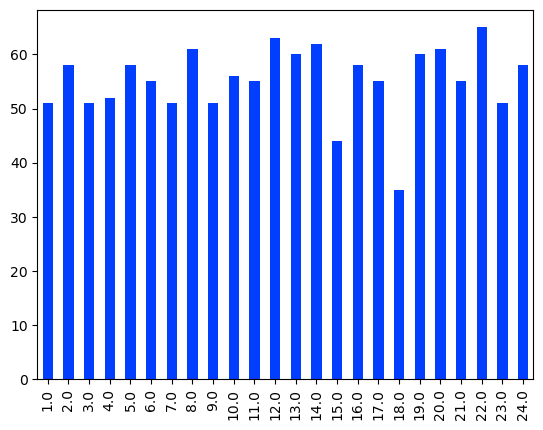

In [58]:
# Unique Value counts
# actor
print(df["actor"].value_counts().sort_index())
df["actor"].value_counts().sort_index().plot.bar()
plt.show()

In [59]:
# Checking corelation with all categorical attributes
corr_inten = categorical_cols + ["actor"]
df[corr_inten].corr()["actor"].sort_values()

emotion               -0.028649
emotional_intensity   -0.018823
vocal_channel         -0.003217
repetition            -0.002870
statement              0.005819
sex                    0.069798
actor                  1.000000
modality                    NaN
Name: actor, dtype: float64

In [60]:
# Checking correlation of "actor" with other attributes
df.corr()["actor"].sort_values()

sc_kur                -0.132716
sc_skew               -0.066964
mfcc_mean             -0.065308
stft_kur              -0.064000
zero_crossings_sum    -0.059671
sc_min                -0.046160
stft_mean             -0.039657
emotion               -0.028649
mfcc_max              -0.028036
kur                   -0.023939
emotional_intensity   -0.018823
mfcc_std              -0.012426
min                   -0.009776
vocal_channel         -0.003217
repetition            -0.002870
statement              0.005819
stft_skew              0.007862
max                    0.015928
mean                   0.020220
stft_min               0.027860
intensity              0.031179
std                    0.032818
frame_count            0.039325
length_ms              0.043038
mfcc_min               0.045965
sc_mean                0.060292
skew                   0.065606
sex                    0.069798
stft_std               0.082993
sc_max                 0.083882
sc_std                 0.119453
actor   

In [61]:
# dropping "actor" attribute 
df.drop("actor", axis = 1, inplace=True)

In [62]:
# Checking Percentage Nan after dropping actor 
percent_nan = percentage_missing(df)
percent_nan

Series([], dtype: float64)

In [63]:
# # correlation of attributes
# df.corr(method="pearson").style.background_gradient(cmap='coolwarm', vmin=-1, vmax=1)

In [64]:
# dropping unnecessary attribues
df = df.drop(labels=["sample_width", "frame_rate", "stft_max", "modality"], axis=1) #Removing non-correlation attributes

In [65]:
# correlation of attributes after dropping 4 attributes
df.corr(method="pearson").style.background_gradient(cmap='coolwarm', vmin=-1, vmax=1)

,vocal_channel,emotion,emotional_intensity,statement,repetition,sex,length_ms,frame_count,intensity,zero_crossings_sum,mfcc_mean,mfcc_std,mfcc_min,mfcc_max,sc_mean,sc_std,sc_min,sc_max,sc_kur,sc_skew,stft_mean,stft_std,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew
vocal_channel,1.000000,-0.228466,-0.010461,-0.005895,0.009264,-0.030720,0.723755,0.553301,0.289309,0.132020,0.039050,-0.263008,0.178794,-0.256818,-0.488268,-0.129643,-0.041057,-0.117746,0.222490,0.535300,-0.454655,0.383234,-0.189567,-0.122833,0.481213,0.025549,0.121557,-0.019743,0.023708,-0.492654,0.025807
emotion,-0.228466,1.000000,0.126324,0.000000,0.000000,0.005250,-0.267384,-0.188219,0.222093,0.143196,0.199870,-0.235117,0.264876,0.021849,0.140072,-0.120776,0.030830,-0.026440,0.063749,-0.126220,0.124605,-0.107156,-0.067858,0.011919,-0.130237,0.024791,0.155643,-0.205686,0.195904,0.198054,0.105992
emotional_intensity,-0.010461,0.126324,1.000000,0.000000,0.000000,0.000256,0.114027,0.092486,0.405504,0.254869,0.305904,-0.416725,0.403562,-0.213957,-0.118081,-0.256610,0.076052,-0.090582,0.233992,0.197154,-0.081052,0.031236,-0.085916,0.004877,0.107097,-0.018088,0.400001,-0.416768,0.417563,0.038873,0.123895
statement,-0.005895,0.000000,0.000000,1.000000,-0.000000,-0.000000,0.029536,0.057054,-0.035490,-0.162901,0.019976,0.022503,-0.010737,-0.002525,-0.083286,-0.075070,-0.012920,0.003062,0.075559,0.076676,-0.001038,-0.057050,-0.000847,0.079564,0.011607,-0.000582,-0.025725,0.005634,0.001904,0.168459,0.032291
repetition,0.009264,0.000000,0.000000,-0.000000,1.000000,0.000000,0.015751,0.026718,0.014864,0.016961,0.011494,-0.018511,0.013579,-0.002847,-0.010039,-0.013379,0.008414,-0.010509,0.005785,0.009429,-0.012592,0.007671,0.005653,-0.004754,0.014438,-0.001771,0.018927,-0.009472,0.008832,-0.028316,-0.005024
sex,-0.030720,0.005250,0.000256,-0.000000,0.000000,1.000000,0.071584,0.056466,0.067075,0.389077,-0.539941,-0.108791,0.126288,-0.545416,0.042652,0.100327,-0.301492,0.203118,-0.019193,-0.007658,-0.574827,0.578974,-0.422499,-0.129566,0.462716,-0.011271,0.083554,-0.052830,0.053374,-0.118022,0.122251
length_ms,0.723755,-0.267384,0.114027,0.029536,0.015751,0.071584,1.000000,0.762874,0.269017,0.329517,0.011321,-0.302735,0.205996,-0.347253,-0.546234,-0.182306,-0.077001,-0.118781,0.292127,0.621148,-0.561395,0.409380,-0.245511,-0.072309,0.602057,0.004213,0.167134,-0.070644,0.072309,-0.460723,0.064473
frame_count,0.553301,-0.188219,0.092486,0.057054,0.026718,0.056466,0.762874,1.000000,0.197886,0.232289,0.002837,-0.226994,0.151464,-0.271507,-0.421151,-0.140110,-0.063856,-0.107906,0.231393,0.483005,-0.429014,0.322356,-0.184323,-0.062620,0.458971,0.007974,0.119598,-0.045295,0.044480,-0.347097,0.034491
intensity,0.289309,0.222093,0.405504,-0.035490,0.014864,0.067075,0.269017,0.197886,1.000000,0.459669,0.580942,-0.926177,0.916929,-0.372785,-0.320986,-0.424454,0.103416,-0.193268,0.365020,0.406944,-0.324629,0.240278,-0.268880,-0.087728,0.355299,-0.005233,0.812483,-0.782665,0.784333,-0.133513,0.367261
zero_crossings_sum,0.132020,0.143196,0.254869,-0.162901,0.016961,0.389077,0.329517,0.232289,0.459669,1.000000,0.130454,-0.559115,0.500559,-0.448745,-0.072949,-0.373711,0.190178,-0.040921,0.186598,0.140215,-0.406511,0.115175,-0.195173,0.072706,0.445898,0.020279,0.470125,-0.420933,0.417493,-0.118101,0.201108


In [66]:
# Distributions

In [67]:
# Checking Skew and Kurtosis

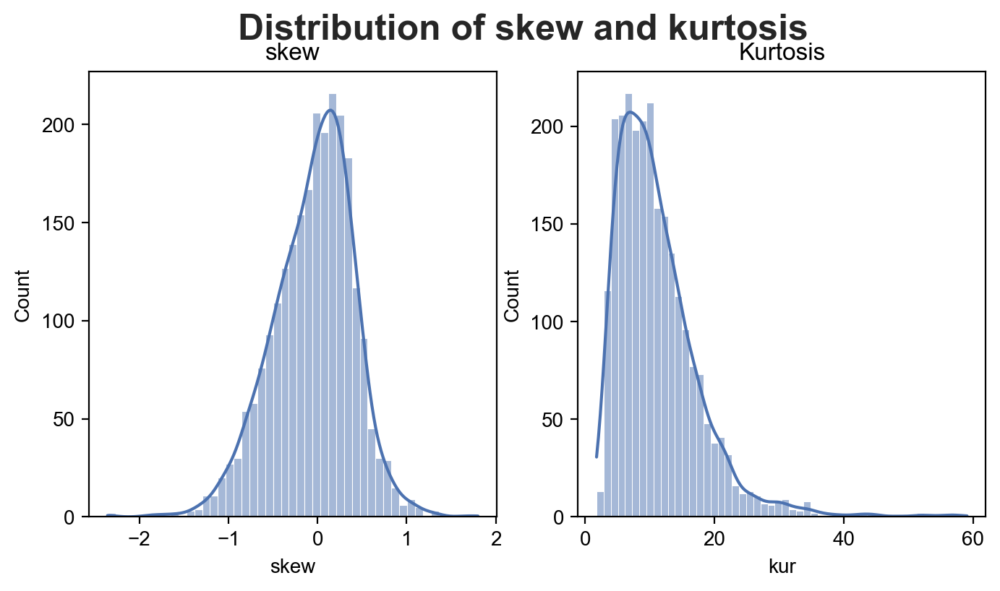

In [68]:
# Calculate the skewness
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (8,4), dpi=200)
sns.set(style='darkgrid')

sns.histplot(data=df,x='skew',kde=True, ax = ax1)
ax1.set_title("skew")

sns.histplot(data=df,x='kur',kde=True, ax = ax2)
ax2.set_title("Kurtosis")

plt.suptitle("Distribution of skew and kurtosis",fontsize = 18, fontweight='bold')
plt.show()

In [69]:
# The distribution is almost symmentric with little hinge away from 0 at the mode.(skew)so we can conclude its normally distributed.
# kurtosis for normal distribution is equal to 3, as we have higher distribution between 0 and 20, we could understand that
# the distribution is leptokurtic and it signifies that it tries to produce more outliers rather than the normal distribution.


In [70]:
categorical_cols.remove("modality")

In [71]:
plot_num_cols =numeric_cols[3:]

In [72]:
plot_num_cols.remove("stft_max")

<AxesSubplot:title={'center':'skew'}, ylabel='Frequency'>

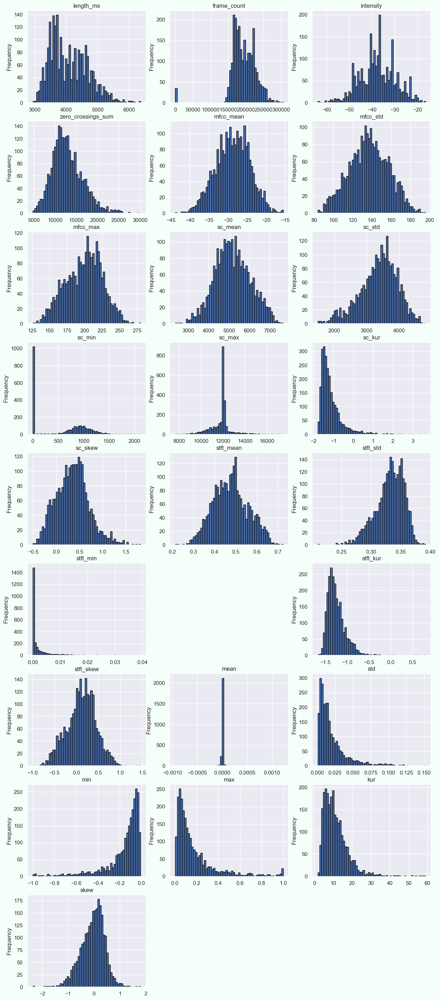

In [73]:
# Histogram of all numerical attributes

df_no_str = df[plot_num_cols]
fig = plt.figure(figsize=(20, 40), edgecolor = "black",facecolor='mintcream') 
fig_dims = (10, 4)

# plt.subplot2grid(fig_dims, (0, 0))
# df["actor"].plot.hist(title = "actor", edgecolor = "black", bins = 60 )
    
# plt.subplot2grid(fig_dims, (0, 1))
# df['sample_width'].plot.hist(title = 'sample_width', edgecolor = "black", bins = 60 )

# plt.subplot2grid(fig_dims, (0, 2))
# df['frame_rate'].plot.hist(title = 'frame_rate', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (1, 0))
df["length_ms"].plot.hist(title = "length_ms", edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (1, 1))
df['frame_count'].plot.hist(title = 'frame_count', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (1, 2))
df['intensity'].plot.hist(title = 'intensity', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (2, 0))
df['zero_crossings_sum'].plot.hist(title = 'zero_crossings_sum', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (2, 1))
df['mfcc_mean'].plot.hist(title = 'mfcc_mean', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (2, 2))
df['mfcc_std'].plot.hist(title = 'mfcc_std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (3, 0))
df['mfcc_max'].plot.hist(title = 'mfcc_max', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (3, 1))
df['sc_mean'].plot.hist(title = 'sc_mean', edgecolor = "black", bins = 60 )
    
plt.subplot2grid(fig_dims, (3, 2))
df['sc_std'].plot.hist(title = 'sc_std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (4, 0))
df['sc_min'].plot.hist(title = 'sc_min', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (4, 1))
df['sc_max'].plot.hist(title = 'sc_max', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (4, 2))
df['sc_kur'].plot.hist(title = 'sc_kur', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (5, 0))
df['sc_skew'].plot.hist(title = 'sc_skew', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (5, 1))
df['stft_mean'].plot.hist(title = 'stft_mean', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (5, 2))
df['stft_std'].plot.hist(title = 'stft_std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (6, 0))
df['stft_min'].plot.hist(title = 'stft_min', edgecolor = "black", bins = 60 )

# plt.subplot2grid(fig_dims, (6, 1))
# df['stft_max'].plot.box(title = 'stft_max', edgecolor = "black", bins = 60 )  
                          
plt.subplot2grid(fig_dims, (6, 2))
df["stft_kur"].plot.hist(title = "stft_kur", edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (7, 0))
df['stft_skew'].plot.hist(title = 'stft_skew', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (7, 1))
df['mean'].plot.hist(title = 'mean', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (7, 2))
df['std'].plot.hist(title = 'std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (8, 0))
df['min'].plot.hist(title = 'min', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (8, 1))
df['max'].plot.hist(title = 'max', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (8, 2))
df['kur'].plot.hist(title = 'kur', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (9, 0))
df['skew'].plot.hist(title = 'skew', edgecolor = "black", bins = 60 ) 
                          
                        

<AxesSubplot:title={'center':'skew'}>

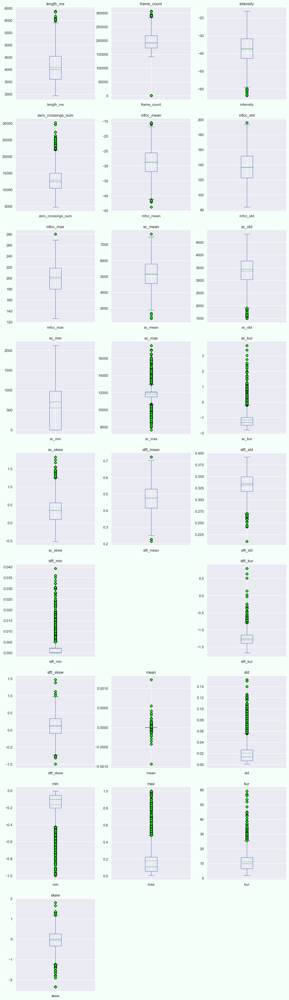

In [74]:
# Boxplot of all numerical attributes
#Istogrammi di tutti gli attributi numerici

df_no_str = df[plot_num_cols]
green_diamond = dict(markerfacecolor='lime', marker='D')

fig = plt.figure(figsize=(20, 60), edgecolor = "black",facecolor='mintcream') 
fig_dims = (10, 4)

# plt.subplot2grid(fig_dims, (0, 0))
# df["actor"].plot.box(title = "actor",showmeans = True, meanline = True,flierprops=green_diamond)
    
# plt.subplot2grid(fig_dims, (0, 1))
# df['sample_width'].plot.box(title = 'sample_width',showmeans = True, meanline = True,flierprops=green_diamond)

# plt.subplot2grid(fig_dims, (0, 2))
# df['frame_rate'].plot.box(title = 'frame_rate',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 0))
df["length_ms"].plot.box(title = "length_ms",showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 1))
df['frame_count'].plot.box(title = 'frame_count',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 2))
df['intensity'].plot.box(title = 'intensity',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 0))
df['zero_crossings_sum'].plot.box(title = 'zero_crossings_sum',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 1))
df['mfcc_mean'].plot.box(title = 'mfcc_mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 2))
df['mfcc_std'].plot.box(title = 'mfcc_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (3, 0))
df['mfcc_max'].plot.box(title = 'mfcc_max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (3, 1))
df['sc_mean'].plot.box(title = 'sc_mean',showmeans = True, meanline = True,flierprops=green_diamond)
    
plt.subplot2grid(fig_dims, (3, 2))
df['sc_std'].plot.box(title = 'sc_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 0))
df['sc_min'].plot.box(title = 'sc_min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 1))
df['sc_max'].plot.box(title = 'sc_max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 2))
df['sc_kur'].plot.box(title = 'sc_kur',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 0))
df['sc_skew'].plot.box(title = 'sc_skew',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 1))
df['stft_mean'].plot.box(title = 'stft_mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 2))
df['stft_std'].plot.box(title = 'stft_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (6, 0))
df['stft_min'].plot.box(title = 'stft_min',showmeans = True, meanline = True,flierprops=green_diamond)

# plt.subplot2grid(fig_dims, (6, 1))
# df['stft_max'].plot.box(title = 'stft_max',showmeans = True, meanline = True,flierprops=green_diamond)  
                          
plt.subplot2grid(fig_dims, (6, 2))
df["stft_kur"].plot.box(title = "stft_kur",showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 0))
df['stft_skew'].plot.box(title = 'stft_skew',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 1))
df['mean'].plot.box(title = 'mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 2))
df['std'].plot.box(title = 'std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 0))
df['min'].plot.box(title = 'min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 1))
df['max'].plot.box(title = 'max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 2))
df['kur'].plot.box(title = 'kur',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (9, 0))
df['skew'].plot.box(title = 'skew',showmeans = True, meanline = True,flierprops=green_diamond)  
                          
                        

In [75]:
# Converting Categorical Attributes to Numeric Values

statement_map = {"Dogs are sitting by the door": 0, "Kids are talking by the door": 1}

emotional_intensity_map = {"normal": 0, "strong": 1}

emotion_map = {'neutral':0, 'calm':1, 'happy':2, 'sad':3, 'angry':4, 'fearful':5, 'disgust':6, 'surprised':7}

modality_map = {"audio-only": 0}

repetition_map = {"1st": 0, "2nd": 1}

vocal_channel_map = {"speech": 0, "song": 1}

sex_map = {"M": 0, "F": 1}

df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
            "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
           "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

In [76]:
categorical_cols

['statement',
 'sex',
 'emotional_intensity',
 'repetition',
 'emotion',
 'vocal_channel']

In [77]:
df.corr()["vocal_channel"].sort_values(ascending=False).nlargest(4)[2:4]

frame_count    0.553301
sc_skew        0.535300
Name: vocal_channel, dtype: float64

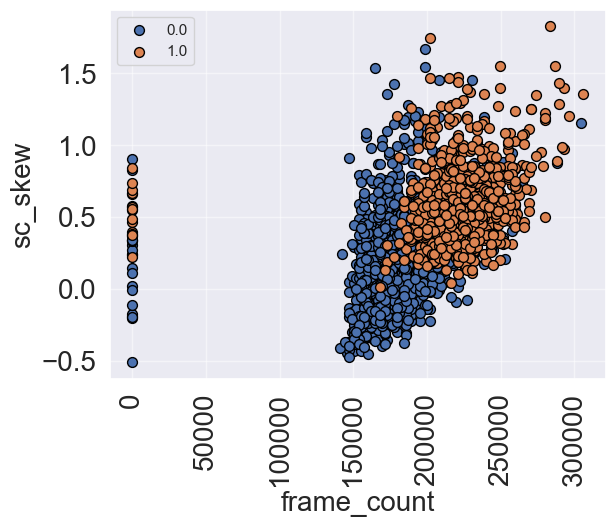

In [78]:
vals = list(df['vocal_channel'].unique())
x = 'frame_count'
y = 'sc_skew'

for val in vals:
    df_val = df[df['vocal_channel']==val]
    plt.scatter(df_val[x], df_val[y], s=50, edgecolor='black', label=val)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

plt.xlabel(x, fontsize=20)
plt.ylabel(y, fontsize=20)

plt.grid(alpha=0.5)
plt.legend(loc='best')
plt.show()

In [79]:
df.corr()['emotional_intensity'].sort_values(ascending=False).nlargest(4)[2:4]

intensity    0.405504
mfcc_min     0.403562
Name: emotional_intensity, dtype: float64

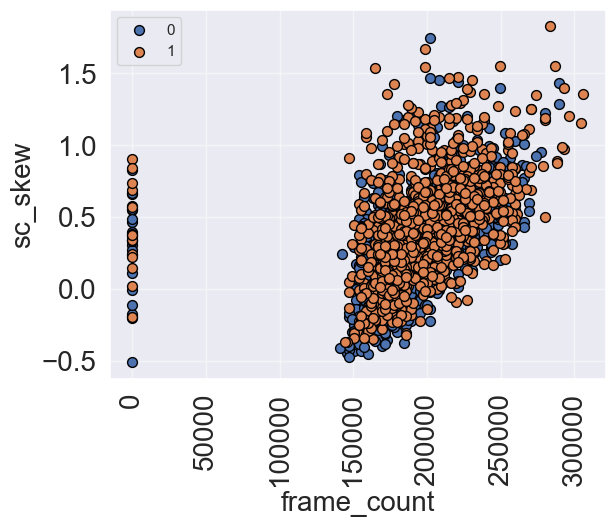

In [80]:
vals = list(df['emotional_intensity'].unique())
x = 'frame_count'
y = 'sc_skew'

for val in vals:
    df_val = df[df['emotional_intensity']==val]
    plt.scatter(df_val[x], df_val[y], s=50, edgecolor='black', label=val)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

plt.xlabel(x, fontsize=20)
plt.ylabel(y, fontsize=20)

plt.grid(alpha=0.5)
plt.legend(loc='best')
plt.show()

In [81]:
df.corr()["statement"].sort_values(ascending=False).nlargest(4)[2:4]

stft_kur    0.079564
sc_skew     0.076676
Name: statement, dtype: float64

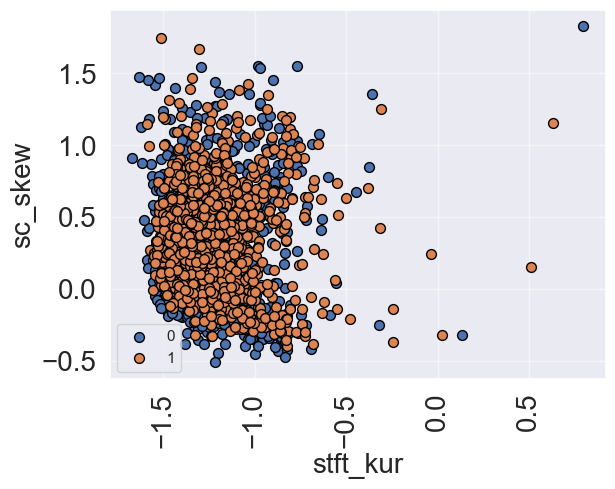

In [82]:
vals = list(df["statement"].unique())
x = 'stft_kur'
y = 'sc_skew'

for val in vals:
    df_val = df[df["statement"]==val]
    plt.scatter(df_val[x], df_val[y], s=50, edgecolor='black', label=val)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

plt.xlabel(x, fontsize=20)
plt.ylabel(y, fontsize=20)

plt.grid(alpha=0.5)
plt.legend(loc='best')
plt.show()

In [83]:
df.corr()['emotion'].sort_values(ascending=False).nlargest(4)[2:4]

intensity    0.222093
mfcc_mean    0.199870
Name: emotion, dtype: float64

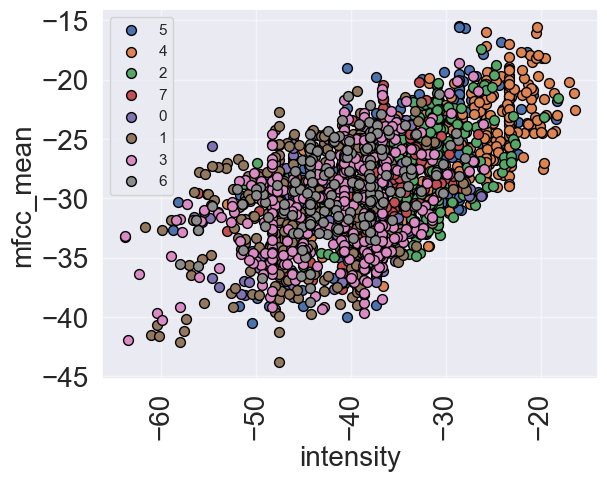

In [84]:
vals = list(df['emotion'].unique())
x = "intensity"
y = 'mfcc_mean'

for val in vals:
    df_val = df[df['emotion']==val]
    plt.scatter(df_val[x], df_val[y], s=50, edgecolor='black', label=val)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

plt.xlabel(x, fontsize=20)
plt.ylabel(y, fontsize=20)

plt.grid(alpha=0.5)
plt.legend(loc='best')
plt.show()

In [85]:
df.corr()['repetition'].sort_values(ascending=False).nlargest(4)[2:4]

std                   0.018927
zero_crossings_sum    0.016961
Name: repetition, dtype: float64

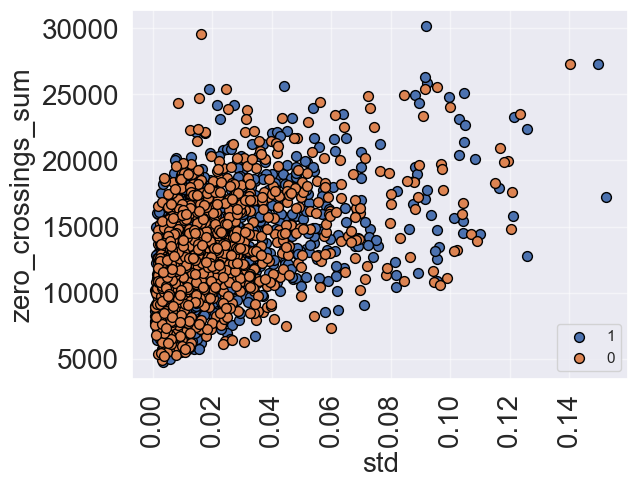

In [86]:
vals = list(df['repetition'].unique())
x = "std"
y = 'zero_crossings_sum'

for val in vals:
    df_val = df[df['repetition']==val]
    plt.scatter(df_val[x], df_val[y], s=50, edgecolor='black', label=val)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

plt.xlabel(x, fontsize=20)
plt.ylabel(y, fontsize=20)

plt.grid(alpha=0.5)
plt.legend(loc='best')
plt.show()

In [87]:
df.corr()['sex'].sort_values(ascending=False).nlargest(4)[2:4]

stft_skew             0.462716
zero_crossings_sum    0.389077
Name: sex, dtype: float64

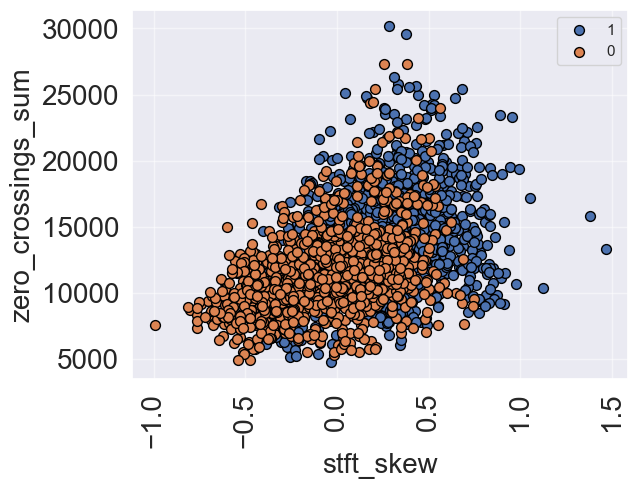

In [88]:
vals = list(df['sex'].unique())
x = "stft_skew"
y = 'zero_crossings_sum'

for val in vals:
    df_val = df[df['sex']==val]
    plt.scatter(df_val[x], df_val[y], s=50, edgecolor='black', label=val)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

plt.xlabel(x, fontsize=20)
plt.ylabel(y, fontsize=20)

plt.grid(alpha=0.5)
plt.legend(loc='best')
plt.show()

## Outliers Removal

In [89]:
# dropping unwanted frame count rows
df.drop(labels=df[df["frame_count"]<=0].index, axis=0, inplace = True)

In [90]:
df.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_kur', 'stft_skew', 'mean',
       'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [91]:
for x in df.columns:
    if(len(df[x].unique()) <=8):
        print(x)

vocal_channel
emotion
emotional_intensity
statement
repetition
sex


In [92]:
df.corr()["vocal_channel"]

vocal_channel          1.000000
emotion               -0.227154
emotional_intensity   -0.010564
statement             -0.005664
repetition             0.008864
sex                   -0.028086
length_ms              0.724771
frame_count            0.724790
intensity              0.291211
zero_crossings_sum     0.133524
mfcc_mean              0.036652
mfcc_std              -0.263475
mfcc_min               0.179433
mfcc_max              -0.256152
sc_mean               -0.486255
sc_std                -0.125154
sc_min                -0.043150
sc_max                -0.112402
sc_kur                 0.221502
sc_skew                0.535351
stft_mean             -0.455390
stft_std               0.385434
stft_min              -0.190507
stft_kur              -0.123545
stft_skew              0.481279
mean                   0.025346
std                    0.123588
min                   -0.021518
max                    0.026629
kur                   -0.493606
skew                   0.029126
Name: vo

In [93]:
df.corr()["skew"].nlargest(3).sort_values()

intensity    0.36957
mfcc_min     0.39479
skew         1.00000
Name: skew, dtype: float64

In [94]:
df.corr()["kur"].nlargest(3).sort_values()

stft_min     0.302289
stft_mean    0.405344
kur          1.000000
Name: kur, dtype: float64

In [95]:
# df.corr()['vocal_channel'].nlargest(3).sort_values()

In [96]:
df.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_kur', 'stft_skew', 'mean',
       'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [97]:
df.corr()["kur"].nsmallest(3).sort_values()

vocal_channel   -0.493606
frame_count     -0.459839
length_ms       -0.459834
Name: kur, dtype: float64

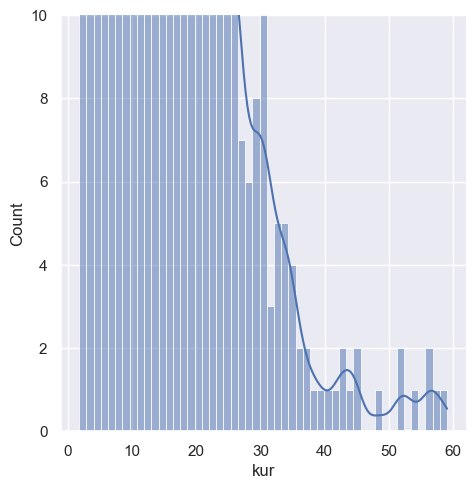

In [98]:
sns.displot(df["kur"], kde=True)
plt.ylim(0, 10)
plt.show()

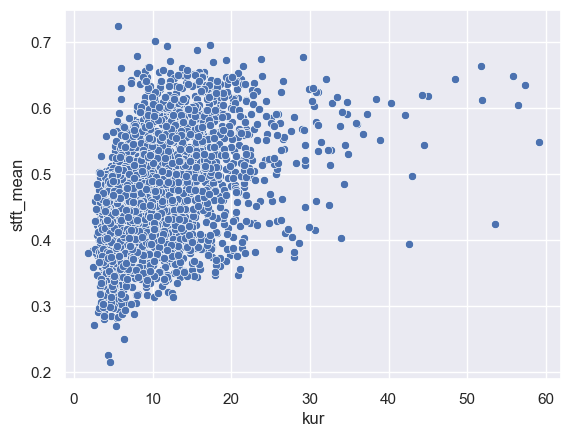

In [99]:
sns.scatterplot(x='kur',y='stft_mean',data=df)
plt.show()

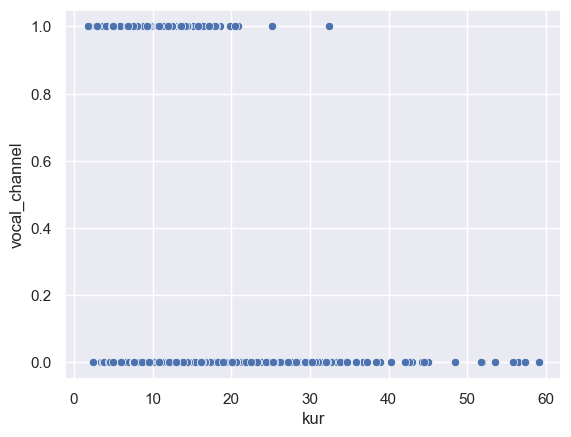

In [100]:
sns.scatterplot(x='kur',y='vocal_channel',data=df)
plt.show()

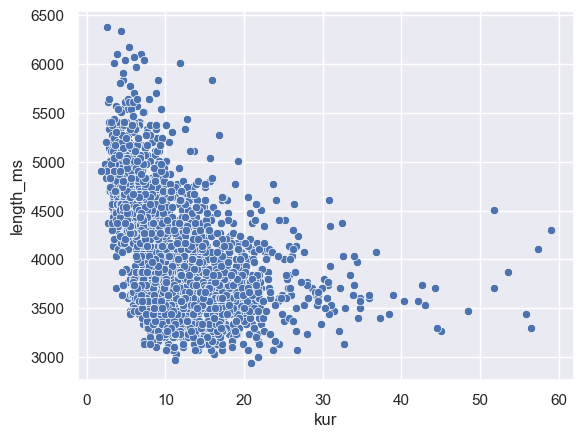

In [101]:
sns.scatterplot(x='kur',y='length_ms',data=df)
plt.show()

In [102]:
# sns.catplot(x='vocal_channel',y='kur',data=df,kind='box')
# plt.show()

In [103]:
# sns.boxplot(x="vocal_channel", y="kur", hue="vocal_channel", data=df)
# plt.legend(loc="best")
# plt.show()

In [104]:
df.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_kur', 'stft_skew', 'mean',
       'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [105]:
main_att = ['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'zero_crossings_sum']
# high_corr = ["length_ms", frame_count", "intensity", "stft_kur", "std", "stft_skew", "sc_std", "skew", "kur"]
# high_corr = ['sc_kur', 'stft_kur', "kur", "std", "intensity", "skew"]

# plot_att = main_att + high_corr

In [106]:
# df.corr()["vocal_channel"].nlargest().sort_values

In [107]:
# df["frame_count"].groupby(df["vocal_channel"]).describe(percentiles=[0.10, .25, .75, .90])[["min","10%", "25%", "75%", "90%"]]

In [108]:
# Function to get percentiles and Imin, Imax, IQR of the selected attribute
def box_describe(x, y, df=df):
    Q1 = df[y].groupby(df[x]).describe()[["25%"]]
    Q3 = df[y].groupby(df[x]).describe()[["75%"]]
    IQR = pd.DataFrame([(Q3.iloc[0][0] - Q1.iloc[0][0]), (Q3.iloc[1][0] - Q1.iloc[1][0])], columns=["IQR"])
    Imin =pd.DataFrame([(Q1.iloc[0][0] - 1.5 * IQR.iloc[0][0]), (Q1.iloc[1][0] - 1.5 * IQR.iloc[1][0])], columns=["Imin"])
    Imax =pd.DataFrame([(Q3.iloc[0][0] + 1.5 * IQR.iloc[0][0]), (Q3.iloc[1][0] + 1.5 * IQR.iloc[1][0])], columns=["Imax"])
    temp_df = pd.DataFrame(df["frame_count"].groupby(df["vocal_channel"]).
                        describe(percentiles=[0.10, .25, .75, .90])[["min", "10%", "25%", "75%", "90%", "max"]])
    temp_df = temp_df.reset_index(drop=True)
    return pd.concat([Imin, temp_df, Imax], axis=1)


# Gives the outlier based on 1 Categorical and its highly correlated 1 Continuous attribute
def outliers(x, y, df=df):
    Imin = box_describe(x, y, df)["Imin"]
    Imax = box_describe(x, y, df)["Imax"]
    return df[(
        (
            (df[x] == df[x].unique()[0]) & (df[y] < Imin.iloc[0])) | 
        ((df[x] == df[x].unique()[1]) & (df[y] < Imin.iloc[1]))
    ) |
        (
            ((df[x] == df[x].unique()[0]) & (df[y] > Imax.iloc[0])) | 
            ((df[x] == df[x].unique()[1]) & (df[y] > Imax.iloc[1]))
        )
][[x, y]]

###  Getting Outliers for "vocal_channel" and "length_ms"

In [109]:
new_df = df.copy() 

In [110]:
# vocal_channel_map = {"speech": 1, "song": 0}

In [111]:
# box_describe
box_describe(x="vocal_channel", y="length_ms", df=df)

,Imin,min,10%,25%,75%,90%,max,Imax
0,2854.5,140941.0,158559.0,168168.0,188989.0,205005.0,304304.0,4586.5
1,3619.5,168168.0,200200.0,209809.0,233833.0,249850.0,305906.0,5623.5


In [112]:
# Outliers detected for "vocal_channel" and "length_ms""
outliers(x="vocal_channel", y="length_ms", df=df)

,vocal_channel,length_ms
2,0.0,4671
42,1.0,5639
43,0.0,5072
48,0.0,5072
61,1.0,6373
...,...,...
2263,0.0,4638
2275,0.0,5372
2323,1.0,5806
2446,0.0,5005


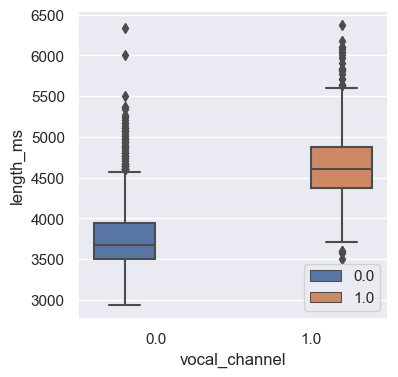

In [113]:
plt.figure(figsize=(4,4), dpi = 100 )
sns.boxplot(x="vocal_channel", y="length_ms", hue="vocal_channel", data=df)
plt.legend(loc="best")
plt.show()

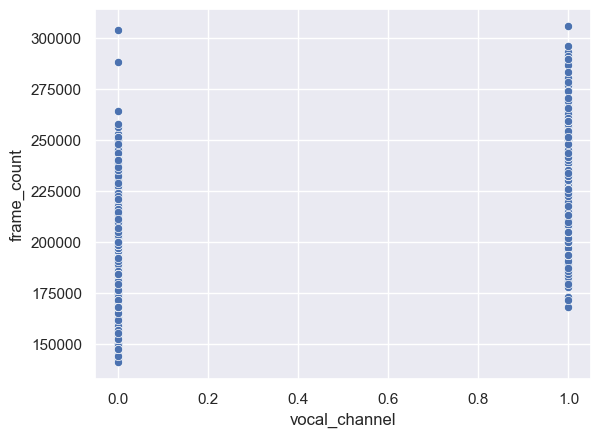

In [114]:
sns.scatterplot(y='frame_count',x='vocal_channel',data=df)
plt.show()

In [115]:
# Getting number of outliers
len(outliers(x="vocal_channel", y= "length_ms", df=df))

96

In [116]:
# Getting index of outliers
ix1 = set(outliers(x="vocal_channel", y="length_ms", df=df).index)
print(ix1)

{2, 1543, 1044, 1562, 1062, 42, 43, 1581, 48, 2098, 564, 1591, 569, 61, 2114, 71, 1100, 1617, 595, 87, 1631, 616, 1640, 2158, 1148, 129, 1680, 153, 2204, 2210, 1699, 679, 2216, 175, 1719, 1723, 700, 2236, 2241, 1730, 712, 2249, 205, 2253, 719, 2262, 2263, 739, 2275, 742, 744, 238, 1777, 250, 1791, 1279, 262, 1799, 1802, 1292, 2323, 1320, 813, 815, 1330, 1335, 1338, 843, 846, 1881, 1378, 359, 1385, 1389, 1397, 1914, 383, 1920, 1922, 2446, 2447, 403, 1428, 1435, 1438, 932, 428, 435, 436, 1461, 959, 1471, 2024, 2031, 1524, 1527}


In [117]:
# Dropping method for rows
# new_df.drop(ix1, axis=0)

##  Getting Outliers for "emotion" and "mfcc_min"

In [118]:
x = "emotion"
y = "mfcc_min"

In [119]:
# Outliers detected for "mfcc_min" and "emotion"

# Function to get percentiles and Imin, Imax, IQR of the selected attribute
Q1 = df[y].groupby(df[x]).describe()[["25%"]]
Q3 = df[y].groupby(df[x]).describe()[["75%"]]

IQR = pd.DataFrame([(Q3.iloc[0][0] - Q1.iloc[0][0]), (Q3.iloc[1][0] - Q1.iloc[1][0]),
                   (Q3.iloc[2][0] - Q1.iloc[2][0]), (Q3.iloc[3][0] - Q1.iloc[3][0]),
                   (Q3.iloc[4][0] - Q1.iloc[4][0]), (Q3.iloc[5][0] - Q1.iloc[5][0]), 
                   (Q3.iloc[6][0] - Q1.iloc[6][0]), (Q3.iloc[7][0] - Q1.iloc[7][0])], 
                   columns=["IQR"])

Imin =pd.DataFrame([(Q1.iloc[0][0] - (1.5 * IQR.iloc[0][0])), (Q1.iloc[1][0] - (1.5 * IQR.iloc[1][0])),
                   (Q1.iloc[2][0] - (1.5 * IQR.iloc[2][0])), (Q1.iloc[3][0] - (1.5 * IQR.iloc[3][0])),
                   (Q1.iloc[4][0] - (1.5 * IQR.iloc[4][0])), (Q1.iloc[5][0] - (1.5 * IQR.iloc[5][0])),
                   (Q1.iloc[6][0] - (1.5 * IQR.iloc[6][0])), (Q1.iloc[7][0] - (1.5 * IQR.iloc[7][0]))], 
                   columns=["Imin"])

Imax =pd.DataFrame([(Q3.iloc[0][0] + (1.5 * IQR.iloc[0][0])), (Q3.iloc[1][0] + (1.5 * IQR.iloc[1][0])),
                   (Q3.iloc[2][0] + (1.5 * IQR.iloc[2][0])), (Q3.iloc[3][0] + (1.5 * IQR.iloc[3][0])),
                   (Q3.iloc[4][0] + (1.5 * IQR.iloc[4][0])), (Q3.iloc[5][0] + (1.5 * IQR.iloc[5][0])),
                   (Q3.iloc[6][0] + (1.5 * IQR.iloc[6][0])), (Q3.iloc[7][0] + (1.5 * IQR.iloc[7][0]))], 
                   columns=["Imax"])

temp_df = pd.DataFrame(df["mfcc_min"].groupby(df["emotion"]).
                        describe(percentiles=[0.10, .25, .75, .90])[["min", "10%", "25%", "75%", "90%", "max"]])

# Imin = Imin.reset_index(drop=True)

# Imax = Imax.reset_index(drop=True)

temp_df = temp_df.reset_index(drop=True)

b_describe = pd.concat([pd.concat([Imin, temp_df], axis=1), Imax], axis=1)

# Gives the outlier based on 1 Categorical and its highly correlated 1 Continuous attribute
outlier = df[
    (
    ((df["emotion"] == 'neutral') & (df["mfcc_min"] < Imin.iloc[0][0])) | 
    ((df["emotion"] == 'calm') & (df["mfcc_min"] < Imin.iloc[1][0])) |
    ((df["emotion"] == 'happy') & (df["mfcc_min"] < Imin.iloc[2][0])) |
    ((df["emotion"] == 'sad') & (df["mfcc_min"] < Imin.iloc[3][0])) |
    ((df["emotion"] == 'angry') & (df["mfcc_min"] < Imin.iloc[4][0])) |
    ((df["emotion"] == 'fearful') & (df["mfcc_min"] < Imin.iloc[5][0])) |
    ((df["emotion"] == 'disgust') & (df["mfcc_min"] < Imin.iloc[6][0])) |
    ((df["emotion"] == 'surprised') & (df["mfcc_min"] < Imin.iloc[7][0]))
    ) | (
    ((df["emotion"] == 'neutral') & (df["mfcc_min"] > Imax.iloc[0][0])) | 
    ((df["emotion"] == 'calm') & (df["mfcc_min"] > Imax.iloc[1][0])) |
    ((df["emotion"] == 'happy') & (df["mfcc_min"] > Imax.iloc[2][0])) |
    ((df["emotion"] == 'sad') & (df["mfcc_min"] > Imax.iloc[3][0])) |
    ((df["emotion"] == 'angry') & (df["mfcc_min"] > Imax.iloc[4][0])) |
    ((df["emotion"] == 'fearful') & (df["mfcc_min"] > Imax.iloc[5][0])) |
    ((df["emotion"] == 'disgust') & (df["mfcc_min"] > Imax.iloc[6][0])) |
    ((df["emotion"] == 'surprised') & (df["mfcc_min"] > Imax.iloc[7][0]))
    )
][["emotion", "mfcc_min"]]

In [120]:
# box_describe
b_describe

,Imin,min,10%,25%,75%,90%,max,Imax
0,-1014.263725,-974.01575,-908.557370,-873.497695,-779.653675,-734.094210,-637.58340,-638.887645
1,-1061.597070,-1068.11570,-950.122359,-897.477150,-788.063870,-746.735198,-598.60516,-623.943950
2,-936.389200,-921.68500,-831.378352,-777.094360,-670.897800,-625.858448,-518.86780,-511.602960
3,-1005.129975,-1085.47970,-908.003708,-850.275015,-747.038375,-688.563244,-568.46140,-592.183415
4,-901.742692,-929.43850,-758.557819,-721.014900,-600.529705,-555.930296,-482.95944,-419.801913
5,-948.346101,-1047.57230,-839.554415,-773.987388,-657.748245,-596.209030,-461.48932,-483.389531
6,-969.152085,-977.51874,-893.467884,-829.842600,-736.969610,-700.279957,-611.02216,-597.660125
7,-918.999569,-961.25854,-849.874536,-801.204625,-722.674663,-688.699020,-602.52080,-604.879719


In [121]:
# emotion_map = {'neutral':5, 'calm':1, 'happy':4, 'sad':6, 'angry':0, 'fearful':3, 'disgust':2, 'surprised':7}

In [122]:
# Outliers detected for "emotion" and "mfcc_min"
outlier

,emotion,mfcc_min


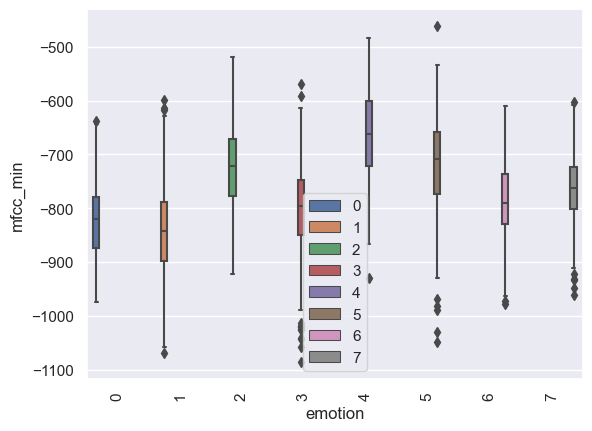

In [123]:
sns.boxplot(x="emotion", y="mfcc_min", hue="emotion", data=df)
plt.xticks(rotation =90)
plt.legend(loc="best")
plt.show()

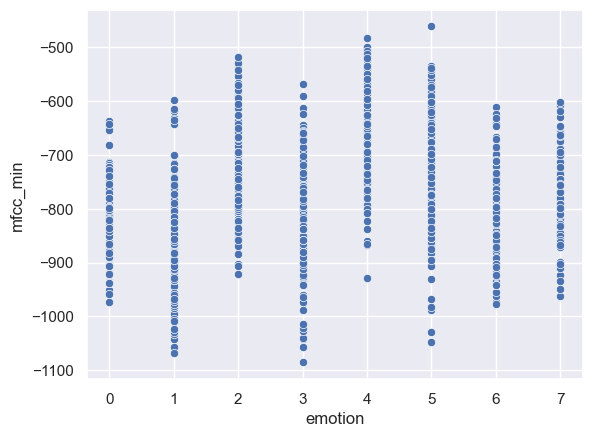

In [124]:
sns.scatterplot(x="emotion", y="mfcc_min", data=df)
plt.show()

In [125]:
# Getting number of outliers
len(outlier)

0

In [126]:
# Getting index of outliers
ix2= set(outlier.index)
print(ix2)

set()


### Getting Outliers for "emotional_intensity" and "max"

In [127]:
# box_describe
box_describe(x="emotional_intensity", y="max", df=df)

,Imin,min,10%,25%,75%,90%,max,Imax
0,-0.086910,140941.0,158559.0,168168.0,188989.0,205005.0,304304.0,0.267002
1,-0.326263,168168.0,200200.0,209809.0,233833.0,249850.0,305906.0,0.771637


In [128]:
# emotional_intensity_map = {"normal": 0, "strong": 1}

In [129]:
# Outliers detected for "vocal_channel" and "frame_count"
outliers(x="emotional_intensity", y="max", df=df)

,emotional_intensity,max
101,1,0.998810
113,1,0.776031
114,1,0.913086
131,0,0.854980
161,1,0.817688
...,...,...
2397,0,0.351898
2405,1,0.832733
2414,0,0.458282
2417,1,0.944336


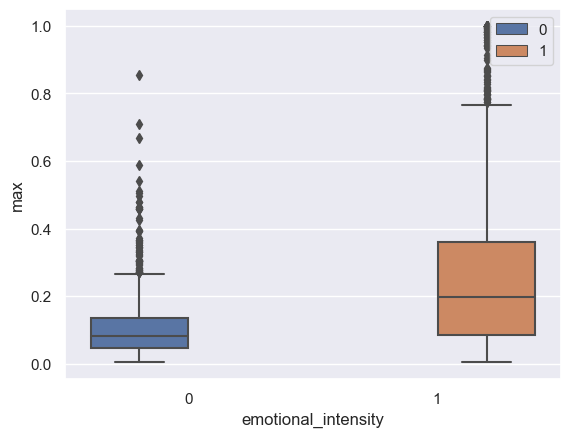

In [130]:
sns.boxplot(x="emotional_intensity", y="max", hue="emotional_intensity", data=df)
plt.legend(loc="best")
plt.show()

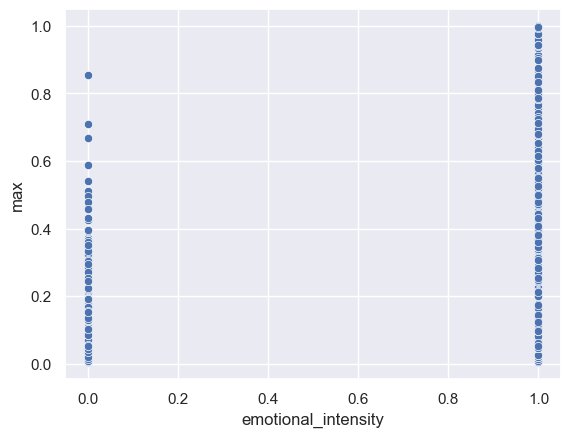

In [131]:
sns.scatterplot(x="emotional_intensity", y="max", data=df)
plt.show()

In [132]:
# Getting number of outliers
len(outliers(x="emotional_intensity", y="max", df=df))

133

In [133]:
# Getting index of outliers
ix3 = set(outliers(x="emotional_intensity", y="max", df=df).index)
print(ix3)

{1029, 2054, 1545, 527, 531, 1557, 1558, 1052, 1564, 542, 543, 547, 1070, 561, 1076, 1095, 591, 2132, 598, 2137, 1632, 2146, 101, 1126, 113, 114, 625, 1652, 2161, 630, 642, 131, 2182, 1159, 652, 1169, 1686, 2201, 1178, 161, 1186, 1187, 167, 1192, 684, 174, 2222, 2226, 1208, 704, 1729, 1732, 1746, 1747, 728, 1240, 2270, 742, 2281, 2284, 2287, 249, 762, 251, 2301, 768, 1282, 1800, 269, 270, 1300, 1814, 1304, 793, 1823, 801, 803, 292, 1315, 2345, 1834, 2347, 2355, 823, 1337, 1850, 321, 833, 323, 1347, 2373, 843, 1871, 1873, 339, 1363, 853, 348, 2397, 867, 1379, 357, 2405, 1386, 2414, 2417, 1908, 2423, 377, 386, 388, 1422, 399, 1424, 1426, 1944, 921, 1946, 1435, 422, 1455, 953, 443, 1475, 1479, 1491, 2016, 1507, 497, 499, 2035, 1529, 1018}


### Getting Outliers for "statement" and "kur"

In [134]:
# statement_map = {"Dogs are sitting by the door": 0, "Kids are talking by the door": 1}

In [135]:
# box_describe
box_describe(x="statement", y="kur", df=df)

,Imin,min,10%,25%,75%,90%,max,Imax
0,-4.221539,140941.0,158559.0,168168.0,188989.0,205005.0,304304.0,23.009518
1,-4.943362,168168.0,200200.0,209809.0,233833.0,249850.0,305906.0,27.538071


In [136]:
# Outliers detected for "vocal_channel" and "frame_count"
outliers(x="statement", y="kur", df=df)

,statement,kur
40,1,28.025827
89,1,32.533053
90,1,32.791878
91,1,33.469627
101,0,28.017790
...,...,...
2289,1,29.900649
2346,0,25.475260
2375,1,29.341086
2439,1,30.325793


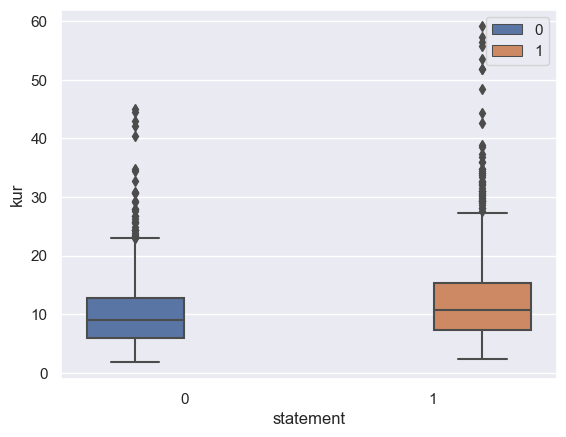

In [137]:
sns.boxplot(x="statement", y="kur", hue="statement", data=df)
plt.legend(loc="best")
plt.show()

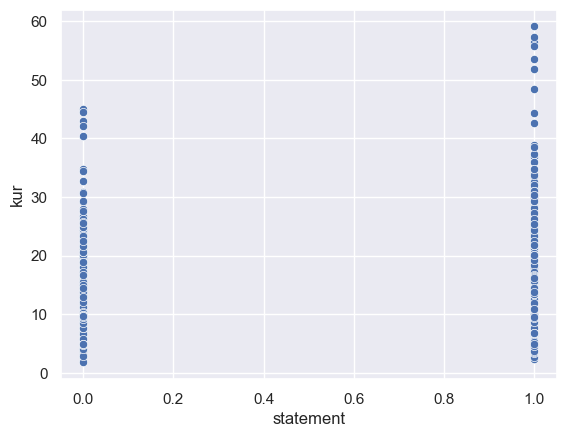

In [138]:
sns.scatterplot(x="statement", y="kur", data=df)
plt.show()

In [139]:
# Getting number of outliers
len(outliers(x="statement", y="kur", df=df))

78

In [140]:
# Getting index of outliers
ix4 = set(outliers(x="vocal_channel", y="frame_count", df=df).index)
print(ix4)

{2, 1543, 1044, 1562, 1062, 42, 43, 1581, 48, 2098, 564, 1591, 569, 61, 2114, 71, 1100, 1617, 595, 87, 1631, 616, 1640, 2158, 1148, 129, 1680, 153, 2204, 2210, 1699, 679, 2216, 175, 1719, 1723, 700, 2236, 2241, 1730, 712, 2249, 205, 2253, 719, 2262, 2263, 739, 2275, 742, 744, 238, 1777, 250, 1791, 1279, 262, 1799, 1802, 1292, 2323, 1320, 813, 815, 1330, 1335, 1338, 843, 846, 1881, 1378, 359, 1385, 1389, 1397, 1914, 383, 1920, 1922, 2446, 2447, 403, 1428, 1435, 1438, 932, 428, 435, 436, 1461, 959, 1471, 2024, 2031, 1524, 1527}


### Getting Outliers for "repetition" and "frame_count"

In [141]:
# box_describe
box_describe(x="repetition", y="frame_count", df=df)

,Imin,min,10%,25%,75%,90%,max,Imax
0,108108.5,140941.0,158559.0,168168.0,188989.0,205005.0,304304.0,281080.5
1,105705.5,168168.0,200200.0,209809.0,233833.0,249850.0,305906.0,285085.5


In [142]:
# repetition_map = {"1st": 1, "2nd": 0}

In [143]:
# df[df["frame_count"]== -1.0]

In [144]:
# Outliers detected for "vocal_channel" and "frame_count"
outliers(x="repetition", y="frame_count", df=df)

,repetition,frame_count
61,0,305906.0
435,0,293093.0
739,1,288288.0
959,1,293093.0
1292,1,296296.0
1438,1,304304.0
1617,1,291492.0
1777,1,289889.0
1791,1,286687.0
1922,0,288288.0


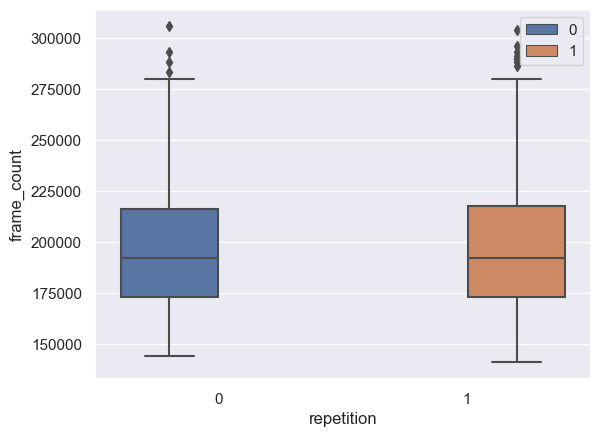

In [145]:
sns.boxplot(x="repetition", y="frame_count", hue="repetition", data=df)
plt.legend(loc="best")
plt.show()

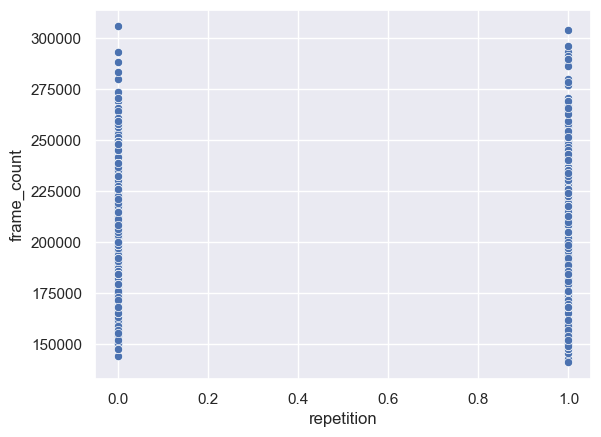

In [146]:
sns.scatterplot(x="repetition", y="frame_count",data=df)
plt.show()

In [147]:
# Getting number of outliers
len(outliers(x="repetition", y="frame_count", df=df))

11

In [148]:
# Getting index of outliers
ix5 = set(outliers(x="repetition", y="frame_count", df=df).index)
print(ix5)

{1922, 739, 1292, 2158, 1617, 1777, 435, 1791, 61, 1438, 959}


### Getting Outliers for "sex" and "stft_std"

In [149]:
# box_describe
box_describe(x="sex", y="stft_std", df=df)

,Imin,min,10%,25%,75%,90%,max,Imax
0,0.254286,140941.0,158559.0,168168.0,188989.0,205005.0,304304.0,0.382674
1,0.300703,168168.0,200200.0,209809.0,233833.0,249850.0,305906.0,0.390239


In [150]:
# sex_map = {"M": 1, "F": 0}

In [151]:
# Outliers detected for "vocal_channel" and "frame_count"
outliers(x="sex", y="stft_std", df=df)

,sex,stft_std
73,0,0.298425
84,0,0.300165
85,0,0.286014
89,0,0.286984
91,0,0.293228
...,...,...
2422,0,0.281628
2424,0,0.295457
2438,0,0.284046
2439,0,0.292172


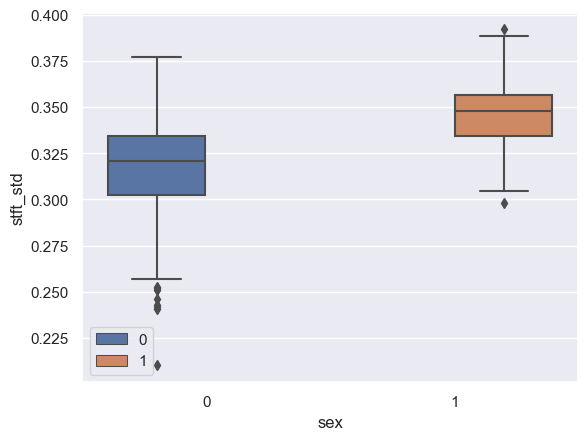

In [152]:
sns.boxplot(x="sex", y="stft_std", hue="sex", data=df)
plt.legend(loc="best")
plt.show()

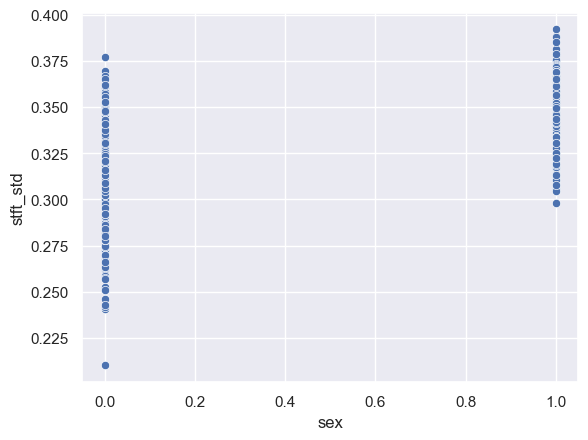

In [153]:
sns.scatterplot(x="sex", y="stft_std",data=df)
plt.show()

In [154]:
# Getting number of outliers
len(outliers(x="sex", y="stft_std", df=df))

# sex attribute has just 10 outliers, so doesnt matter

288

In [155]:
# Getting index of outliers
ix6 = set(outliers(x="sex", y="stft_std", df=df).index)
print(ix6)

{512, 1025, 1026, 515, 516, 1539, 1540, 1031, 1528, 1541, 1545, 1035, 1020, 1036, 1546, 1039, 1040, 1041, 1042, 1547, 1548, 1551, 1046, 535, 536, 1047, 1049, 1556, 1563, 1564, 1565, 2074, 2075, 1059, 1060, 1061, 1571, 1572, 1064, 1065, 1066, 1579, 2085, 2086, 1582, 1583, 2090, 2098, 2099, 2101, 1078, 2102, 1083, 1085, 2109, 1087, 2113, 1090, 2117, 2118, 2119, 2120, 73, 2124, 2126, 84, 85, 1108, 2136, 89, 91, 2141, 2143, 97, 1123, 1125, 1126, 2151, 104, 105, 2154, 107, 1131, 2156, 2159, 112, 1138, 1139, 116, 2162, 2166, 119, 120, 2167, 2168, 123, 124, 125, 126, 2169, 2173, 1552, 130, 2175, 132, 135, 136, 2188, 142, 2191, 144, 145, 2192, 2195, 148, 149, 150, 2197, 153, 163, 2211, 2068, 2212, 2214, 168, 169, 171, 2219, 175, 2224, 2231, 2232, 186, 187, 191, 708, 199, 712, 715, 717, 1229, 207, 209, 210, 1233, 1234, 215, 216, 1239, 1244, 1245, 1246, 223, 736, 226, 1763, 741, 1253, 743, 748, 749, 751, 1775, 753, 1266, 756, 1782, 761, 1786, 1787, 766, 1793, 770, 771, 1797, 1799, 1288, 777, 778

### Removing the outliers finally

In [156]:
# Checking common index among all outliers found
set.intersection(ix1, ix2, ix3, ix4, ix5, ix6)

set()

In [157]:
# Ouliers Common between 'vocal_channel','statement','repetition' found by correlation
out1 = set.intersection(ix1, ix4, ix5)

In [158]:
# Ouliers Common between 'emotion','emotional_intensity' found by correlation
out2 = set.intersection(ix2, ix3)

In [159]:
# Ouliers Common between 'emotion','emotional_intensity' found by correlation
out3 = (set.intersection(ix4, ix3))

In [160]:
# Ouliers Common between 'repetition','vocal_channel' found by correlation
out4 = set.intersection(ix5, ix1)

In [161]:
total_outliers_ix = [out1, out2, out3, out4]

In [162]:
total_outliers_ix

[{61, 435, 739, 959, 1292, 1438, 1617, 1777, 1791, 1922, 2158},
 set(),
 {742, 843, 1435},
 {61, 435, 739, 959, 1292, 1438, 1617, 1777, 1791, 1922, 2158}]

In [163]:
new_df = df.copy()

In [164]:
remove_ix = []
for x in (total_outliers_ix):
    for y in x:
        remove_ix.append(y)


In [165]:
# Finally got the most common outliers
final_out_ix = set(sorted(remove_ix))

In [166]:
# Dropping 77 Outliers found most common
new_df.drop(labels = final_out_ix, axis=0)

,vocal_channel,emotion,emotional_intensity,statement,repetition,sex,length_ms,frame_count,intensity,zero_crossings_sum,...,stft_std,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,0.0,5,0,0,1,1,3737,179379.0,-36.793432,16995,...,0.335533,0.000000,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,0.0,4,0,0,0,1,3904,187387.0,-36.663681,13906,...,0.352380,0.000000,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,0.0,2,1,0,1,1,4671,224224.0,-32.290737,18723,...,0.352270,0.000000,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,0.0,7,0,1,0,1,3637,174575.0,-49.019839,11617,...,0.360552,0.000000,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,1.0,2,1,0,1,1,4404,211411.0,-31.214503,15137,...,0.350655,0.000000,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,0.0,1,1,1,0,0,4605,221021.0,-47.596807,9871,...,0.304496,0.000000,-1.075888,-0.310088,9.367040e-07,0.005260,-0.039856,0.052399,9.551363,0.759247
2448,0.0,1,0,0,0,0,4171,200200.0,-43.342901,8963,...,0.306333,0.000000,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633
2449,1.0,3,1,0,1,0,5239,251451.0,-36.772456,9765,...,0.347843,0.000000,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821
2450,0.0,7,0,1,0,0,3737,179379.0,-45.751265,9716,...,0.308684,0.001565,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966


<AxesSubplot:title={'center':'skew'}, ylabel='Frequency'>

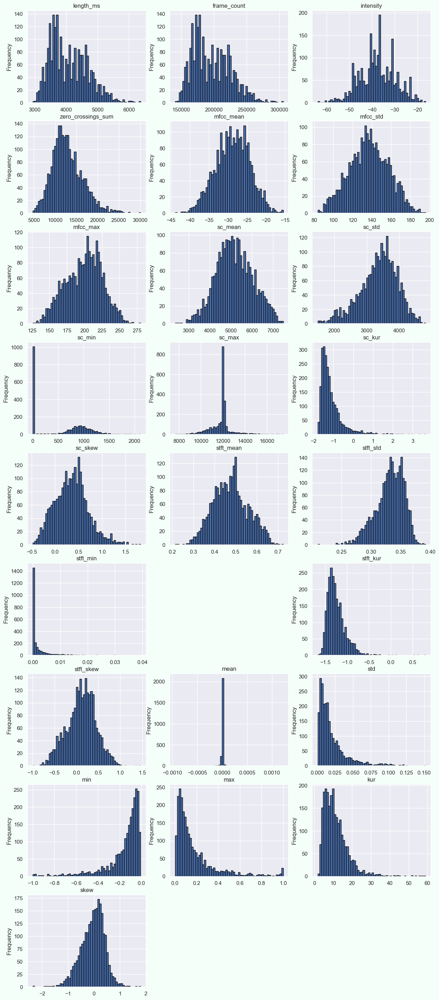

In [167]:
# Histogram of all numerical attributes

df_no_str = df[plot_num_cols]
fig = plt.figure(figsize=(20, 40), edgecolor = "black",facecolor='mintcream') 
fig_dims = (10, 4)

# plt.subplot2grid(fig_dims, (0, 0))
# df["actor"].plot.hist(title = "actor", edgecolor = "black", bins = 60 )
    
# plt.subplot2grid(fig_dims, (0, 1))
# df['sample_width'].plot.hist(title = 'sample_width', edgecolor = "black", bins = 60 )

# plt.subplot2grid(fig_dims, (0, 2))
# df['frame_rate'].plot.hist(title = 'frame_rate', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (1, 0))
df["length_ms"].plot.hist(title = "length_ms", edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (1, 1))
df['frame_count'].plot.hist(title = 'frame_count', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (1, 2))
df['intensity'].plot.hist(title = 'intensity', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (2, 0))
df['zero_crossings_sum'].plot.hist(title = 'zero_crossings_sum', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (2, 1))
df['mfcc_mean'].plot.hist(title = 'mfcc_mean', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (2, 2))
df['mfcc_std'].plot.hist(title = 'mfcc_std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (3, 0))
df['mfcc_max'].plot.hist(title = 'mfcc_max', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (3, 1))
df['sc_mean'].plot.hist(title = 'sc_mean', edgecolor = "black", bins = 60 )
    
plt.subplot2grid(fig_dims, (3, 2))
df['sc_std'].plot.hist(title = 'sc_std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (4, 0))
df['sc_min'].plot.hist(title = 'sc_min', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (4, 1))
df['sc_max'].plot.hist(title = 'sc_max', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (4, 2))
df['sc_kur'].plot.hist(title = 'sc_kur', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (5, 0))
df['sc_skew'].plot.hist(title = 'sc_skew', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (5, 1))
df['stft_mean'].plot.hist(title = 'stft_mean', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (5, 2))
df['stft_std'].plot.hist(title = 'stft_std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (6, 0))
df['stft_min'].plot.hist(title = 'stft_min', edgecolor = "black", bins = 60 )

# plt.subplot2grid(fig_dims, (6, 1))
# df['stft_max'].plot.box(title = 'stft_max', edgecolor = "black", bins = 60 )  
                          
plt.subplot2grid(fig_dims, (6, 2))
df["stft_kur"].plot.hist(title = "stft_kur", edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (7, 0))
df['stft_skew'].plot.hist(title = 'stft_skew', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (7, 1))
df['mean'].plot.hist(title = 'mean', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (7, 2))
df['std'].plot.hist(title = 'std', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (8, 0))
df['min'].plot.hist(title = 'min', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (8, 1))
df['max'].plot.hist(title = 'max', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (8, 2))
df['kur'].plot.hist(title = 'kur', edgecolor = "black", bins = 60 )

plt.subplot2grid(fig_dims, (9, 0))
df['skew'].plot.hist(title = 'skew', edgecolor = "black", bins = 60 ) 
                          
                        

<AxesSubplot:title={'center':'skew'}>

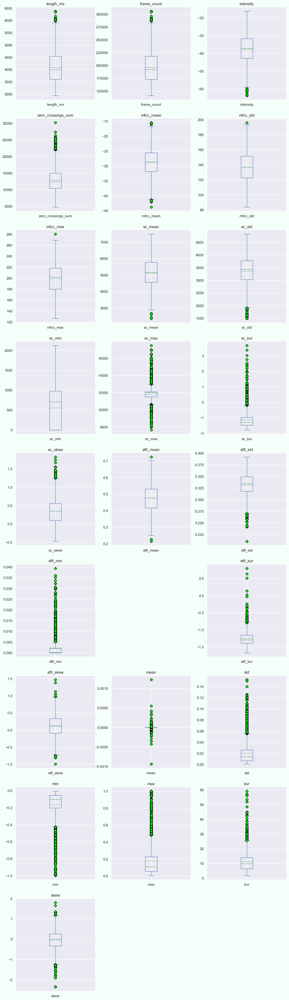

In [168]:
# Boxplot of all numerical attributes
#Istogrammi di tutti gli attributi numerici

df_no_str = df[plot_num_cols]
green_diamond = dict(markerfacecolor='lime', marker='D')

fig = plt.figure(figsize=(20, 60), edgecolor = "black",facecolor='mintcream') 
fig_dims = (10, 4)

# plt.subplot2grid(fig_dims, (0, 0))
# df["actor"].plot.box(title = "actor",showmeans = True, meanline = True,flierprops=green_diamond)
    
# plt.subplot2grid(fig_dims, (0, 1))
# df['sample_width'].plot.box(title = 'sample_width',showmeans = True, meanline = True,flierprops=green_diamond)

# plt.subplot2grid(fig_dims, (0, 2))
# df['frame_rate'].plot.box(title = 'frame_rate',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 0))
df["length_ms"].plot.box(title = "length_ms",showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 1))
df['frame_count'].plot.box(title = 'frame_count',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (1, 2))
df['intensity'].plot.box(title = 'intensity',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 0))
df['zero_crossings_sum'].plot.box(title = 'zero_crossings_sum',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 1))
df['mfcc_mean'].plot.box(title = 'mfcc_mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (2, 2))
df['mfcc_std'].plot.box(title = 'mfcc_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (3, 0))
df['mfcc_max'].plot.box(title = 'mfcc_max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (3, 1))
df['sc_mean'].plot.box(title = 'sc_mean',showmeans = True, meanline = True,flierprops=green_diamond)
    
plt.subplot2grid(fig_dims, (3, 2))
df['sc_std'].plot.box(title = 'sc_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 0))
df['sc_min'].plot.box(title = 'sc_min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 1))
df['sc_max'].plot.box(title = 'sc_max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (4, 2))
df['sc_kur'].plot.box(title = 'sc_kur',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 0))
df['sc_skew'].plot.box(title = 'sc_skew',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 1))
df['stft_mean'].plot.box(title = 'stft_mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (5, 2))
df['stft_std'].plot.box(title = 'stft_std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (6, 0))
df['stft_min'].plot.box(title = 'stft_min',showmeans = True, meanline = True,flierprops=green_diamond)

# plt.subplot2grid(fig_dims, (6, 1))
# df['stft_max'].plot.box(title = 'stft_max',showmeans = True, meanline = True,flierprops=green_diamond)  
                          
plt.subplot2grid(fig_dims, (6, 2))
df["stft_kur"].plot.box(title = "stft_kur",showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 0))
df['stft_skew'].plot.box(title = 'stft_skew',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 1))
df['mean'].plot.box(title = 'mean',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (7, 2))
df['std'].plot.box(title = 'std',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 0))
df['min'].plot.box(title = 'min',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 1))
df['max'].plot.box(title = 'max',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (8, 2))
df['kur'].plot.box(title = 'kur',showmeans = True, meanline = True,flierprops=green_diamond)

plt.subplot2grid(fig_dims, (9, 0))
df['skew'].plot.box(title = 'skew',showmeans = True, meanline = True,flierprops=green_diamond)  
                          
                        

In [169]:
# Converting Categorical Attributes to Numeric Values

statement_map = {"Dogs are sitting by the door": 0, "Kids are talking by the door": 1}

emotional_intensity_map = {"normal": 0, "strong": 1}

emotion_map = {'neutral':0, 'calm':1, 'happy':2, 'sad':3, 'angry':4, 'fearful':5, 'disgust':6, 'surprised':7}

modality_map = {"audio-only": 0}

repetition_map = {"1st": 0, "2nd": 1}

vocal_channel_map = {"speech": 0, "song": 1}

sex_map = {"M": 0, "F": 1}

df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
            "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
           "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

new_df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
            "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
           "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

In [170]:
# Distribution on the basis of skewness value:

# Skewness = 0: Then normally distributed.
# Skewness > 0: Then more weight in the left tail of the distribution.
# Skewness < 0: Then more weight in the right tail of the distribution.
# Kurtosis:
# It is also a statistical term and an important characteristic of frequency distribution. 
# It determines whether a distribution is heavy-tailed in respect of the normal distribution. 
# It provides information about the shape of a frequency distribution.

# kurtosis for normal distribution is equal to 3.
# For a distribution having kurtosis < 3: It is called playkurtic.
# For a distribution having kurtosis > 3, It is called leptokurtic and it signifies that it 
# tries to produce more outliers rather than the normal distribution.

### Skew and kurtosis before removing missing values and outliers.

In [171]:
# print("skew with outliers: {}".format(a['vocal_channel'].astype(float).skew()))
# print("kurtosis with outliers: {}".format(a['vocal_channel'].astype(float).kurt()))
# # skew with outliers: 0.514017883137549
# # kurtosis with outliers: -1.7372032502537131

### Skew and kurtosis after removing missing values and outliers.

In [172]:
# Skew and kurtosis before removing missing values and outliers.
# print("skew after removing outliers: {}".format(new_df['vocal_channel'].astype(float).skew()))
# print("kurtosis after removing outliers: {}".format(new_df['vocal_channel'].astype(float).kurt()))

# skew with outliers: 0.37361026688784127
# kurtosis with outliers: -1.862066923949672

In [173]:
# between -2 and +2
# The values for asymmetry and kurtosis between -2 and +2 are considered acceptable in order 
# to prove normal univariate distribution (George & Mallery, 2010

In [174]:

print(new_df['vocal_channel'].astype(float).skew())
print(new_df['vocal_channel'].astype(float).kurt())

0.5155785610112696
-1.73561560635451


In [175]:
# Distribution on the basis of skewness value:

# Skewness = 0: Then normally distributed.
# Skewness > 0: Then more weight in the left tail of the distribution.
# Skewness < 0: Then more weight in the right tail of the distribution.
    
# kurtosis for normal distribution is equal to 3.
# For a distribution having kurtosis < 3: It is called playkurtic.
# For a distribution having kurtosis > 3, It is called leptokurtic and 
# it signifies that it tries to produce more outliers rather than the normal 
# distribution.

# Clustering

In [178]:
df.nunique()

vocal_channel             2
emotion                   8
emotional_intensity       2
statement                 2
repetition                2
sex                       2
length_ms                95
frame_count             157
intensity              1007
zero_crossings_sum     2147
mfcc_mean              2416
mfcc_std               2414
mfcc_min               2416
mfcc_max               2414
sc_mean                2416
sc_std                 2416
sc_min                 1410
sc_max                 2389
sc_kur                 2416
sc_skew                2416
stft_mean              2416
stft_std               2416
stft_min               1410
stft_kur               2416
stft_skew              2416
mean                   2415
std                    2416
min                    2120
max                    2138
kur                    2416
skew                   2416
dtype: int64

<AxesSubplot:xlabel='length_ms', ylabel='Count'>

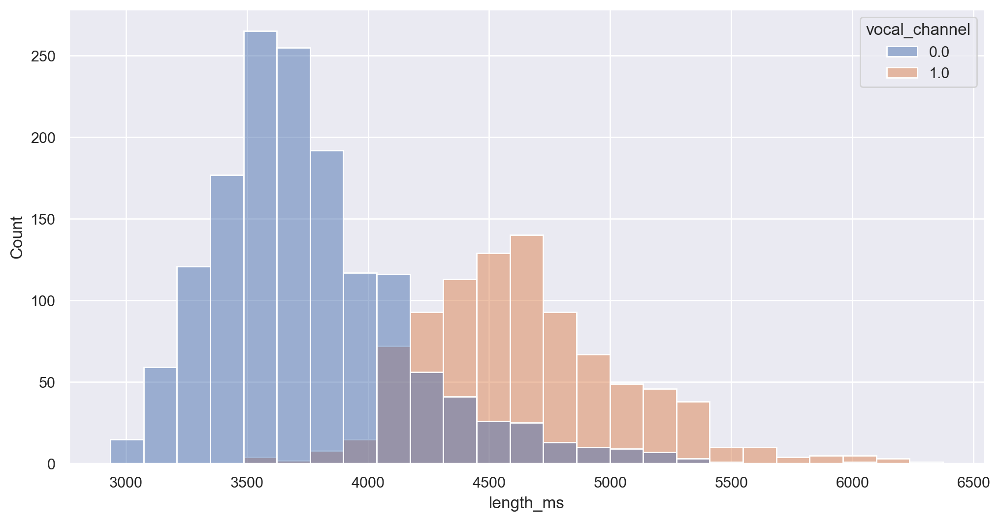

In [179]:
plt.figure(figsize=(12,6),dpi=200)
sns.histplot(data=df,x='length_ms', hue="vocal_channel")

In [180]:
# sns.pairplot(df)

In [181]:
df.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_kur', 'stft_skew', 'mean',
       'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [182]:
df.corr()["repetition"].sort_values(ascending=[False])

repetition             1.000000
zero_crossings_sum     0.017656
std                    0.016288
length_ms              0.014955
frame_count            0.014944
stft_skew              0.014093
mfcc_mean              0.012175
intensity              0.011747
mfcc_min               0.011332
sc_min                 0.010440
sc_skew                0.009546
vocal_channel          0.008864
stft_std               0.006011
stft_min               0.005676
max                    0.005113
sc_kur                 0.004651
statement              0.003706
mfcc_max               0.000170
sex                   -0.000362
emotional_intensity   -0.001855
mean                  -0.002451
emotion               -0.004352
sc_max                -0.006180
min                   -0.006195
stft_kur              -0.006360
skew                  -0.006770
sc_mean               -0.010418
stft_mean             -0.011636
sc_std                -0.013788
mfcc_std              -0.016747
kur                   -0.028980
Name: re

In [185]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
#import dataset
from sklearn.datasets import load_iris

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram

In [186]:
clus_cols = ["vocal_channel", "length_ms", "emotion", "mfcc_min", "emotional_intensity", "max", 
             "statement", "kur", "repetition", "frame_count", "sex", "stft_std"]

## Scaling

### StandardScaler

In [187]:
cols = [col for col in df.columns if col != 'class']
X = df[clus_cols].values

scaler = StandardScaler() 
X_scal = scaler.fit_transform(X)

In [188]:
X[0]

array([ 0.00000000e+00,  3.73700000e+03,  5.00000000e+00, -7.55223450e+02,
        0.00000000e+00,  1.38946530e-01,  0.00000000e+00,  9.40606124e+00,
        1.00000000e+00,  1.79379000e+05,  1.00000000e+00,  3.35533140e-01])

In [189]:
X_scal 

array([[-0.77502403, -0.59251838,  0.8284038 , ..., -0.59239373,
         1.01795176,  0.17372013],
       [-0.77502403, -0.31336599,  0.33389849, ..., -0.31352996,
         1.01795176,  0.88207525],
       [-0.77502403,  0.96872909, -0.65511212, ...,  0.96925039,
         1.01795176,  0.87741911],
       ...,
       [ 1.29028257,  1.91818151, -0.16060681, ...,  1.91738027,
        -0.98236483,  0.69131112],
       [-0.77502403, -0.59251838,  1.81741442, ..., -0.59239373,
        -0.98236483, -0.95515893],
       [-0.77502403, -0.42536126, -1.64412273, ..., -0.4250685 ,
        -0.98236483, -0.44627686]])

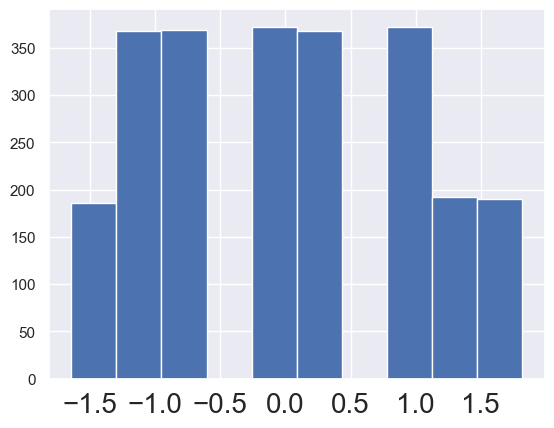

In [190]:
plt.hist(X_scal[:,2], edgecolor='white')

plt.xticks(fontsize=20)
plt.show()

### MinMaxScaler

In [192]:
scaler = MinMaxScaler()
scaler.fit(X)
X_minmax = scaler.transform(X)

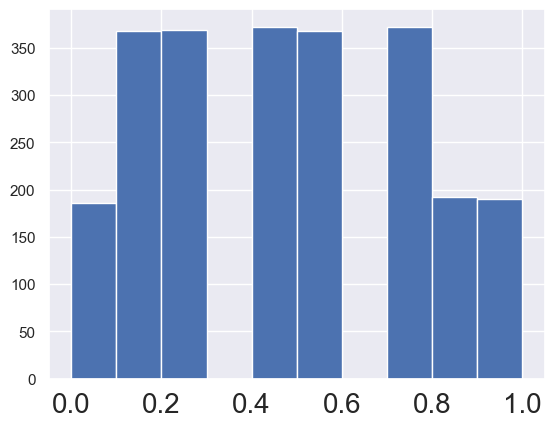

In [193]:
plt.hist(X_minmax[:,2], edgecolor='white')

plt.xticks(fontsize=20)
plt.show()

### RobustScaler

In [194]:
scaler = RobustScaler()
scaler.fit(X)
X_robust = scaler.transform(X)

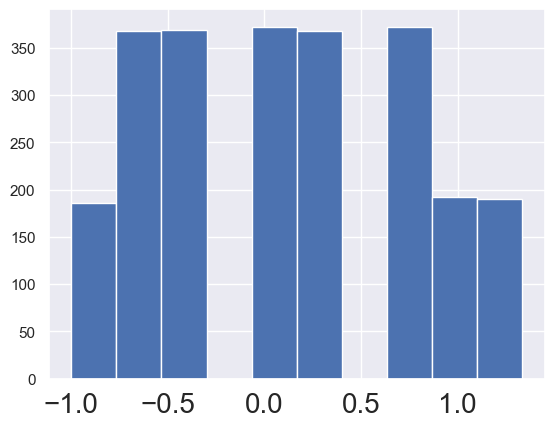

In [195]:
plt.hist(X_robust[:,2], edgecolor='white')

plt.xticks(fontsize=20)
plt.show()

## KMeans Clustering

In [196]:
kmeans = KMeans( n_clusters=3, n_init=10, max_iter=300 )
kmeans.fit(X_scal)

KMeans(n_clusters=3)

In [197]:
type(X)

numpy.ndarray

In [198]:
X[: 9]

array([[ 0.00000000e+00,  3.73700000e+03,  5.00000000e+00,
        -7.55223450e+02,  0.00000000e+00,  1.38946530e-01,
         0.00000000e+00,  9.40606124e+00,  1.00000000e+00,
         1.79379000e+05,  1.00000000e+00,  3.35533140e-01],
       [ 0.00000000e+00,  3.90400000e+03,  4.00000000e+00,
        -7.13985600e+02,  0.00000000e+00,  2.63061520e-01,
         0.00000000e+00,  1.95641875e+01,  0.00000000e+00,
         1.87387000e+05,  1.00000000e+00,  3.52380420e-01],
       [ 0.00000000e+00,  4.67100000e+03,  2.00000000e+00,
        -7.26060360e+02,  1.00000000e+00,  1.66351320e-01,
         0.00000000e+00,  4.88124056e+00,  1.00000000e+00,
         2.24224000e+05,  1.00000000e+00,  3.52269680e-01],
       [ 0.00000000e+00,  3.63700000e+03,  7.00000000e+00,
        -8.42946350e+02,  0.00000000e+00,  2.40783700e-02,
         1.00000000e+00,  1.30402594e+01,  0.00000000e+00,
         1.74575000e+05,  1.00000000e+00,  3.60552070e-01],
       [ 1.00000000e+00,  4.40400000e+03,  2.0000000

In [199]:
labels = kmeans.labels_

In [200]:
# The lowest SSE value
kmeans.inertia_

19429.555455911555

In [201]:
# The number of iterations required to converge
kmeans.n_iter_

12

In [202]:
kmeans.labels_[:5]

array([1, 1, 2, 1, 2], dtype=int32)

In [203]:
# sns.scatterplot(df["length_ms"], df["stft_mean"], s=40, edgecolor='black', c= kmeans.labels_)

In [204]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans1 = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans1.fit(X_robust)
    sse.append(kmeans1.inertia_)

In [205]:
centers = kmeans.cluster_centers_

In [206]:
centers

array([[-0.24694213, -0.12601243,  0.47766011,  1.15908333,  1.02963238,
         1.25871169,  0.02006405,  0.25001028, -0.01865805, -0.12598565,
         0.17718822,  0.0884528 ],
       [-0.76702672, -0.76443292,  0.08161941, -0.67183462, -0.39492619,
        -0.51340403, -0.0013658 ,  0.45163588,  0.00194413, -0.76445589,
        -0.06450417, -0.49817012],
       [ 1.14802283,  1.05979373, -0.43918422,  0.03956776, -0.22135465,
        -0.23170728, -0.01235634, -0.74944125,  0.01063403,  1.05980411,
        -0.04248668,  0.57085263]])

In [207]:
# centers = scaler.inverse_transform(centers)

In [208]:
# (1,3), (3,1), (3,7), *(3,9), (5,1), (1, 5), (5,9) clear cluster formation visible
# 0:"crimson", 1 :"tab:orange",  

In [209]:
label_map = {0: "#008fd5", 1: "#fc4f30", 2: "darkgreen"}
label_color = [label_map[l] for l in labels]

In [210]:
centers[:,1]

array([-0.12601243, -0.76443292,  1.05979373])

In [211]:
X_robust[:,1]

array([-0.28586724, -0.10706638,  0.71413276, ...,  1.32226981,
       -0.28586724, -0.17880086])

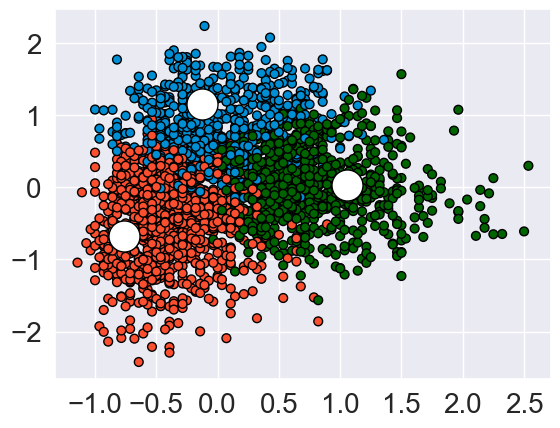

In [212]:
# plt.scatter( df["length_ms"], df["mfcc_std"], s=40, edgecolor='black', c= kmeans.labels_ )
plt.scatter( X_robust[:,1], X_robust[:,3], s=40, edgecolor='black', c= label_color)
plt.scatter( centers[:,1], centers[:,3], edgecolor='black', c='white',marker='o', s=500 )
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

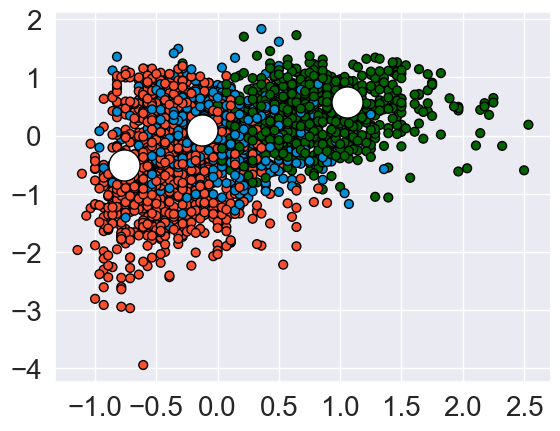

In [213]:


# plt.scatter( df["length_ms"], df["mfcc_std"], s=40, edgecolor='black', c= kmeans.labels_ )
plt.scatter( X_robust[:,1], X_robust[:,11], s=40, edgecolor='black', c= label_color)
plt.scatter( centers[:,1], centers[:,11], edgecolor='black', c='white',marker='o', s=500 )
# plt.ylim(-2, )
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.show()

In [214]:
centers[:,7]

array([ 0.25001028,  0.45163588, -0.74944125])

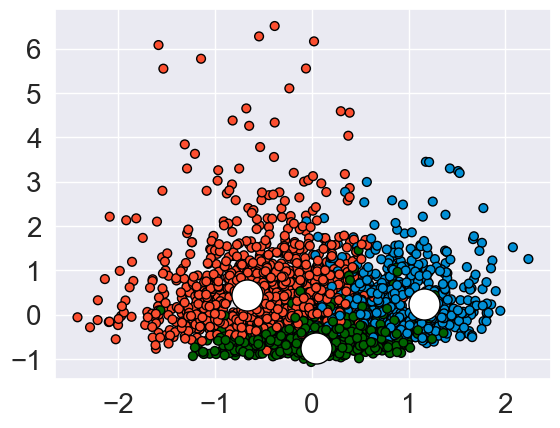

In [215]:
# plt.scatter( df["length_ms"], df["mfcc_std"], s=40, edgecolor='black', c= kmeans.labels_ )
plt.scatter( X_robust[:,3], X_robust[:,7], s=40, edgecolor='black', c= label_color)
plt.scatter( centers[:,3], centers[:,7], edgecolor='black', c='white',marker='o', s=500 )
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.show()

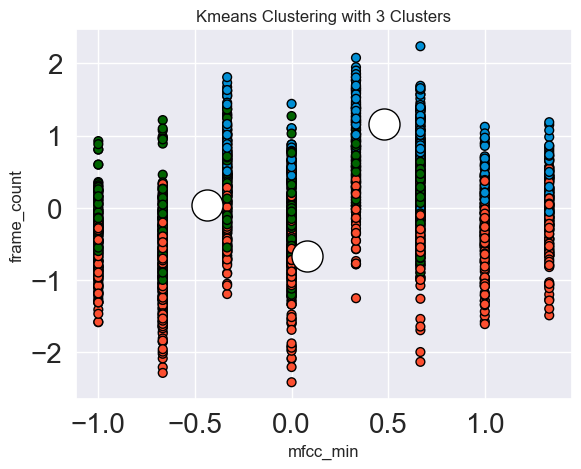

In [216]:
# This combination shows the best cluster formation (3,9)

# plt.scatter( df["length_ms"], df["mfcc_std"], s=40, edgecolor='black', c= kmeans.labels_ )
plt.scatter( X_robust[:,2], X_robust[:,3], s=40, edgecolor='black', c= label_color)
plt.scatter( centers[:,2], centers[:,3], edgecolor='black', c='white',marker='o', s=500 )
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel("mfcc_min")
plt.ylabel("frame_count")
plt.title("Kmeans Clustering with 3 Clusters")

plt.show()

In [222]:
# *(1,3), (1, 11), (3, 7), (3,9) clear cluster formation visible

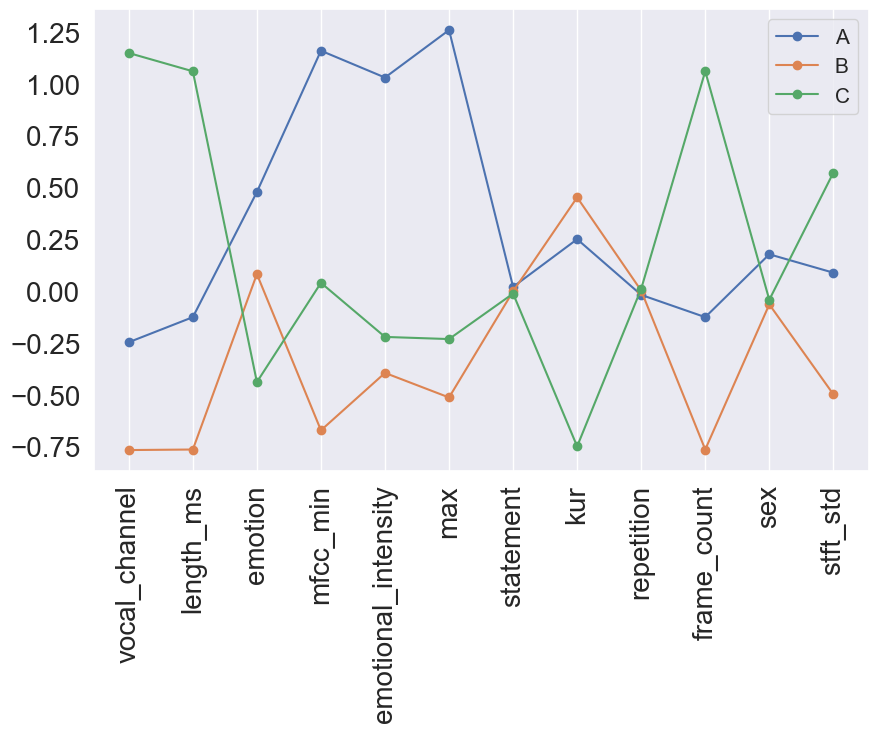

In [223]:
# Used to interpret well seperated clusters(centrids are seperate to each other)
plt.figure(figsize=(10, 6))

clust_name = ['A', 'B', "C"]
for i in range(len(centers)):
    plt.plot(centers[i], marker='o', label=clust_name[i])
    
plt.xticks(range(0,len(clus_cols)), clus_cols, fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(rotation = 90)

plt.legend(fontsize=15, loc='best')
plt.grid(axis='y')

In [224]:
# the min value for a, b and c at vocal_channel is 0.4, 0.8
# respectively, meaning that clusters are not well seperated.

In [225]:
a = list((np.unique(kmeans.labels_, return_counts=True)) )[1][0]
b = list((np.unique(kmeans.labels_, return_counts=True)) )[1][1]
c = list((np.unique(kmeans.labels_, return_counts=True)) )[1][2]

In [226]:
print(a, b, c)

571 1033 813


In [227]:
# clus_cols = ["vocal_channel", "length_ms", "emotion", "mfcc_min", , "emotional_intensity", "max", 
#              "statement", "kur", "repetition", "frame_count", "sex", "stft_std"]

[]

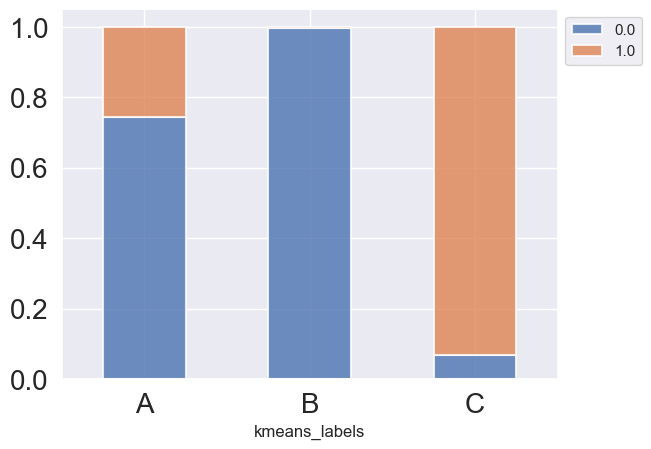

In [228]:
df['kmeans_labels'] = kmeans.labels_

bar_pl = df['vocal_channel'].groupby(df['kmeans_labels']).value_counts(normalize=True).unstack(1)
bar_pl.plot(kind='bar', stacked=True, alpha=0.8, edgecolor='white', linewidth=1.5)

plt.xticks(range(0, len(clust_name)), clust_name, fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1,1))

plt.plot()

In [229]:
# Showing the number of clusters:
#     Cluster 0: 1220, 1: 1232
print((np.unique(kmeans.labels_, return_counts=True)))
print(df["vocal_channel"].value_counts())

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))
0.0    1510
1.0     907
Name: vocal_channel, dtype: int64


In [230]:
(df["vocal_channel"].value_counts()[0] - a) + ((df["vocal_channel"].value_counts()[1] - b))

813

In [231]:
578/len(df) *100

23.91394290442698

In [232]:
(((df["vocal_channel"].value_counts()[0] - a)) / len(df)) * 100,  (((df["vocal_channel"].value_counts()[0] - b)) / len(df)) * 100

(38.849813818783616, 19.73520893669839)

In [233]:
y = df['vocal_channel']
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 429 out of 2417 samples were correctly labeled.
Accuracy score: 0.18


[]

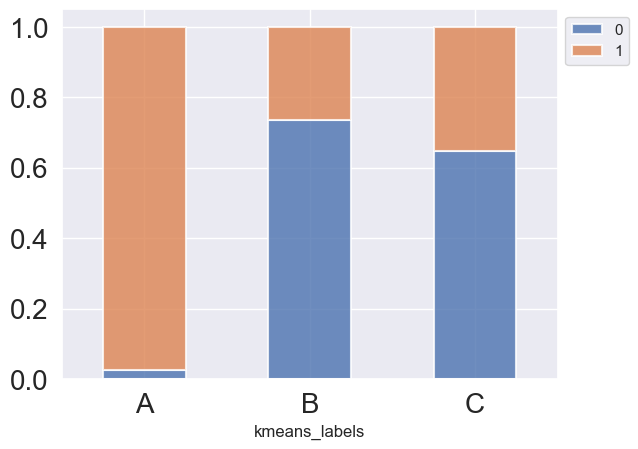

In [234]:
df['kmeans_labels'] = kmeans.labels_

bar_p2 = df["emotional_intensity"].groupby(df['kmeans_labels']).value_counts(normalize=True).unstack(1)
bar_p2.plot(kind='bar', stacked=True, alpha=0.8, edgecolor='white', linewidth=1.5)

plt.xticks(range(0, len(clust_name)), clust_name, fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1,1))

plt.plot()

In [235]:
 # Showing the number of clusters:
#     Cluster 0: 1220, 1: 1232
print((np.unique(kmeans.labels_, return_counts=True)))
print(df["emotional_intensity"].value_counts())

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))
0    1300
1    1117
Name: emotional_intensity, dtype: int64


In [236]:
list((np.unique(kmeans.labels_, return_counts=True)) )[1][0]

571

In [237]:
(((df["emotional_intensity"].value_counts()[0] - a)) / len(df)) * 100,  (((df["emotional_intensity"].value_counts()[0] - b)) / len(df)) * 100

(30.16135705419942, 11.046752172114191)

In [238]:
y = df["emotional_intensity"]
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 288 out of 2417 samples were correctly labeled.
Accuracy score: 0.12


[]

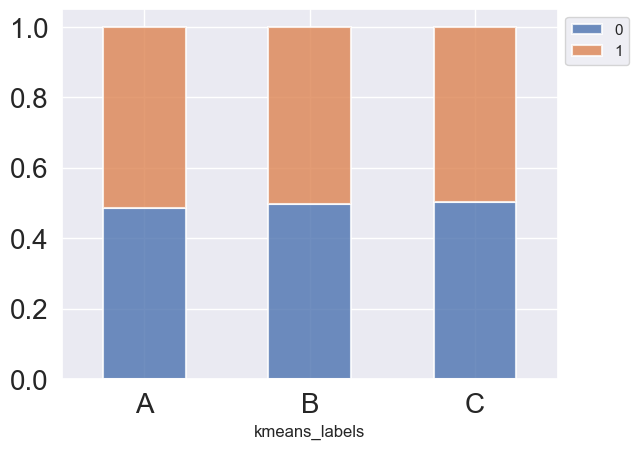

In [239]:
df['kmeans_labels'] = kmeans.labels_

bar_p3 = df["statement"].groupby(df['kmeans_labels']).value_counts(normalize=True).unstack(1)
bar_p3.plot(kind='bar', stacked=True, alpha=0.8, edgecolor='white', linewidth=1.5)

plt.xticks(range(0, len(clust_name)), clust_name, fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1,1))

plt.plot()

In [240]:
# Showing the number of clusters:
#     Cluster 0: 1220, 1: 1232
print((np.unique(kmeans.labels_, return_counts=True)))
print(df["statement"].value_counts())

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))
1    1216
0    1201
Name: statement, dtype: int64


In [241]:
((len(df) - 32)/ len(df) ) * 100

98.67604468349194

In [242]:
(((df["statement"].value_counts()[0] - a)) / len(df)) * 100,  (((df["statement"].value_counts()[0] - b)) / len(df)) * 100

(26.065370293752586, 6.950765411667356)

In [243]:
y = df["statement"]
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 797 out of 2417 samples were correctly labeled.
Accuracy score: 0.33


[]

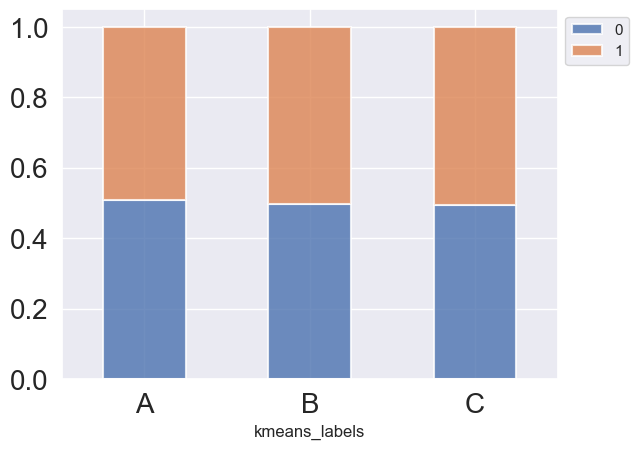

In [244]:
df['kmeans_labels'] = kmeans.labels_

bar_p4 = df["repetition"].groupby(df['kmeans_labels']).value_counts(normalize=True).unstack(1)
bar_p4.plot(kind='bar', stacked=True, alpha=0.8, edgecolor='white', linewidth=1.5)

plt.xticks(range(0, len(clust_name)), clust_name, fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1,1))

plt.plot()

In [245]:
# Showing the number of clusters:
#     Cluster 0: 1220, 1: 1232
print((np.unique(kmeans.labels_, return_counts=True)))
print(df["repetition"].value_counts())

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))
1    1212
0    1205
Name: repetition, dtype: int64


In [246]:
(((df["repetition"].value_counts()[0] - a)) / len(df)) * 100,  (((df["repetition"].value_counts()[0] - b)) / len(df)) * 100

(26.230864708316094, 7.1162598262308645)

In [247]:
y = df['repetition']
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 809 out of 2417 samples were correctly labeled.
Accuracy score: 0.33


In [248]:
y = df['repetition']
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 809 out of 2417 samples were correctly labeled.
Accuracy score: 0.33


[]

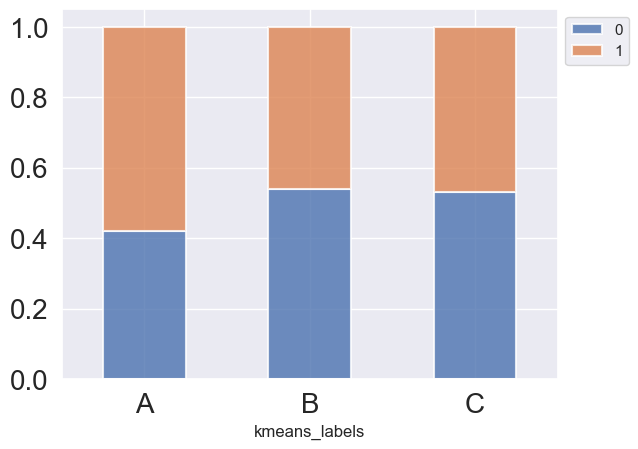

In [249]:
df['kmeans_labels'] = kmeans.labels_

bar_p5 = df["sex"].groupby(df['kmeans_labels']).value_counts(normalize=True).unstack(1)
bar_p5.plot(kind='bar', stacked=True, alpha=0.8, edgecolor='white', linewidth=1.5)

plt.xticks(range(0, len(clust_name)), clust_name, fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1,1))

plt.plot()

In [250]:
# Showing the number of clusters:
#     Cluster 0: 1220, 1: 1232
print(np.unique(kmeans.labels_, return_counts=True))
print(df["sex"].value_counts())

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))
0    1230
1    1187
Name: sex, dtype: int64


In [251]:
(((df["sex"].value_counts()[0] - a)) / len(df)) * 100,  (((df["sex"].value_counts()[0] - b)) / len(df)) * 100

(27.265204799338022, 8.150599917252793)

In [252]:
y = df["sex"]
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 714 out of 2417 samples were correctly labeled.
Accuracy score: 0.30


[]

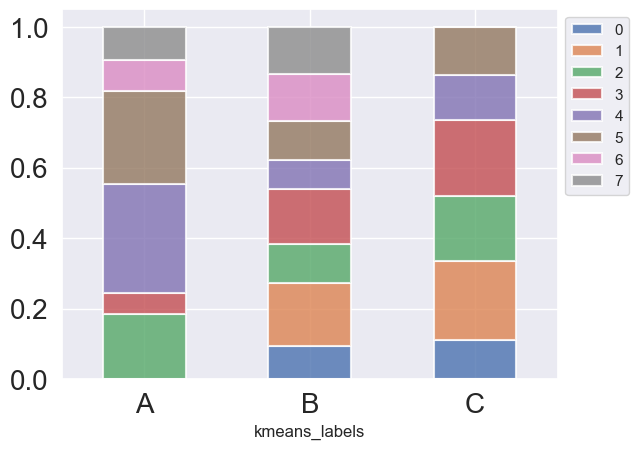

In [253]:
df['kmeans_labels'] = kmeans.labels_

bar_p6 = df["emotion"].groupby(df['kmeans_labels']).value_counts(normalize=True).unstack(1)
bar_p6.plot(kind='bar', stacked=True, alpha=0.8, edgecolor='white', linewidth=1.5)

plt.xticks(range(0, len(clust_name)), clust_name, fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1,1))

plt.plot()

In [254]:
# Showing the number of clusters:
#     Cluster 0: 1220, 1: 12329
print(np.unique(kmeans.labels_, return_counts=True))
print(df["emotion"].value_counts())

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))
5    372
3    372
2    369
4    368
1    368
6    192
7    190
0    186
Name: emotion, dtype: int64


In [255]:
(((df["emotion"].value_counts()[0] - a)) / len(df)) * 100,  (((df["emotion"].value_counts()[0] - b)) / len(df)) * 100

(-15.928837401737692, -35.04344228382293)

In [256]:
y = df["emotion"]
# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 336 out of 2417 samples were correctly labeled.
Accuracy score: 0.14


In [259]:
# # By our analysis, we found that the clusters found by kmeans clustering were 
# very close with repetition and statement with an error of 0.65%, which is very good

In [260]:
# the clusters are well seperate at index 1, 3, 5 and 7 whoch could be easily obseved in the parallel coordinates plot above which was also visualized in scatterplots

In [261]:
# Showing the number of clusters:
#     Cluster 0: 1220, 1: 1232
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2], dtype=int32), array([ 571, 1033,  813]))

In [262]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(X_robust, kmeans.labels_))

SSE 19429.555455911555
Silhouette 0.22507161005449622


In [263]:
In [17]: # A list holds the silhouette coefficients for each k
silhouette_coefficients = []

sse_list1 = []
    # Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans1 = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans1.fit(X_robust)
    score = silhouette_score(X_robust, kmeans1.labels_)
    silhouette_coefficients.append(score)
    sse_list1.append( kmeans1.inertia_ )


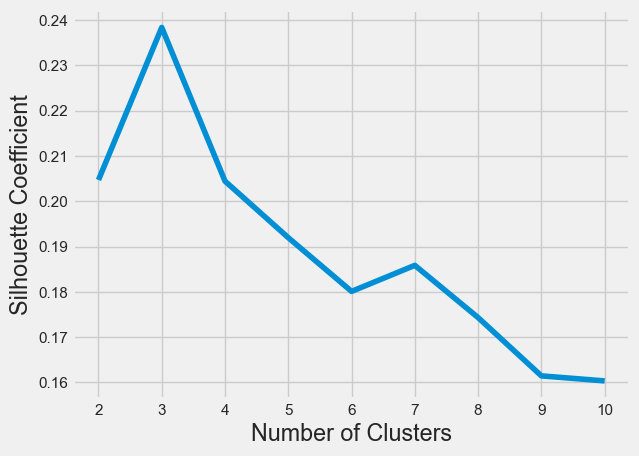

In [264]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

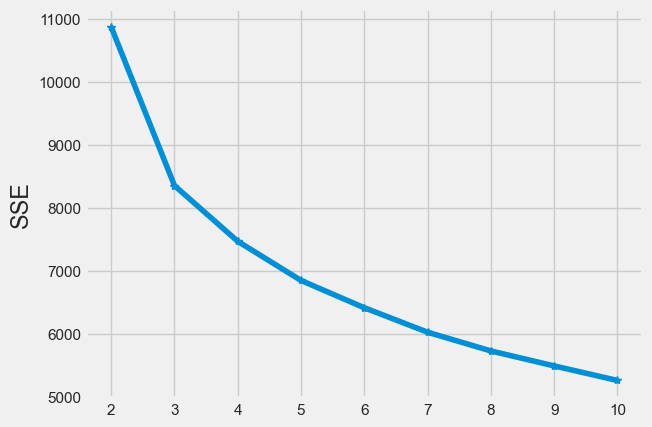

In [265]:
plt.plot(range(2, len(sse_list1)+2), sse_list1, marker='*')
plt.ylabel('SSE')
plt.show()

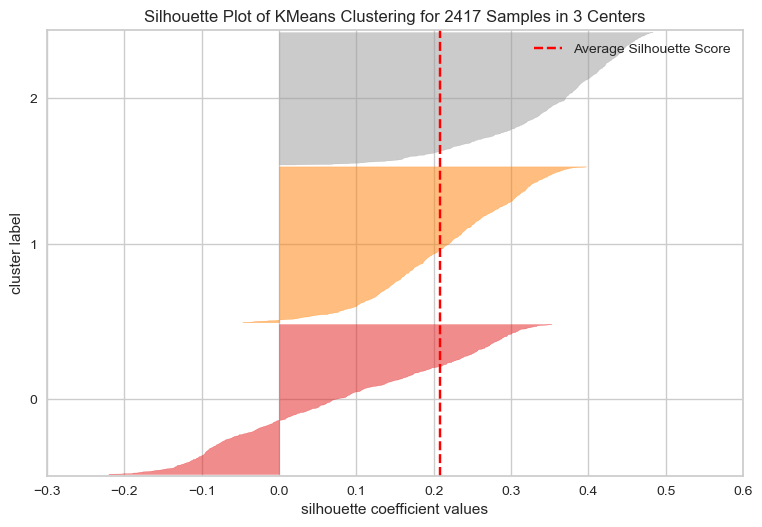

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 2417 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [266]:
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
sil_visualizer = SilhouetteVisualizer(kmeans)
sil_visualizer.fit(X_robust)    
sil_visualizer.show()

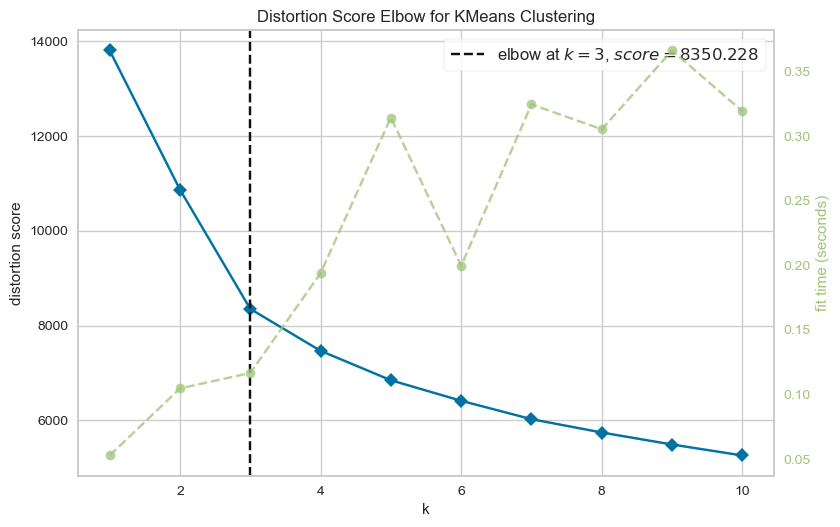

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [267]:
elb_visualizer = KElbowVisualizer(kmeans, k=(1,11))
elb_visualizer.fit(X_robust)    
elb_visualizer.show() 

In [268]:
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")

In [269]:
kl.elbow

3

In [271]:
from sklearn.datasets import make_moons
from sklearn.metrics import adjusted_rand_score

## DBSCAN Clustering

In [273]:
# DBSCAN Clustering
dbscan = DBSCAN( eps=1.25, min_samples=3)
dbscan.fit(X_robust)

DBSCAN(eps=1.25, min_samples=3)

In [274]:
true_labels = df["repetition"]

In [275]:
ari_kmeans = adjusted_rand_score(true_labels, kmeans.labels_)
ari_dbscan = adjusted_rand_score(true_labels, dbscan.labels_)

In [276]:
ari_kmeans

-0.0005428946201476233

In [277]:
ari_dbscan

0.00012674763831305963

In [278]:
dlabels = dbscan.labels_

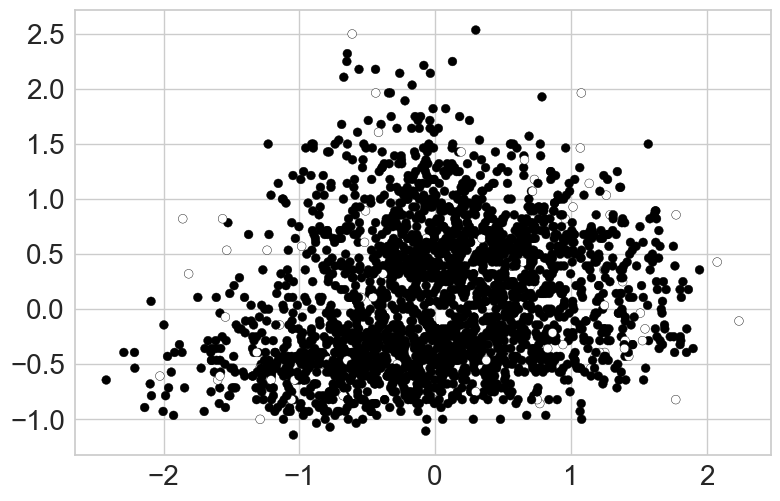

In [279]:
plt.scatter( X_robust[:,3], X_robust[:,9], s=40, edgecolor='black', c= dbscan.labels_ )

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

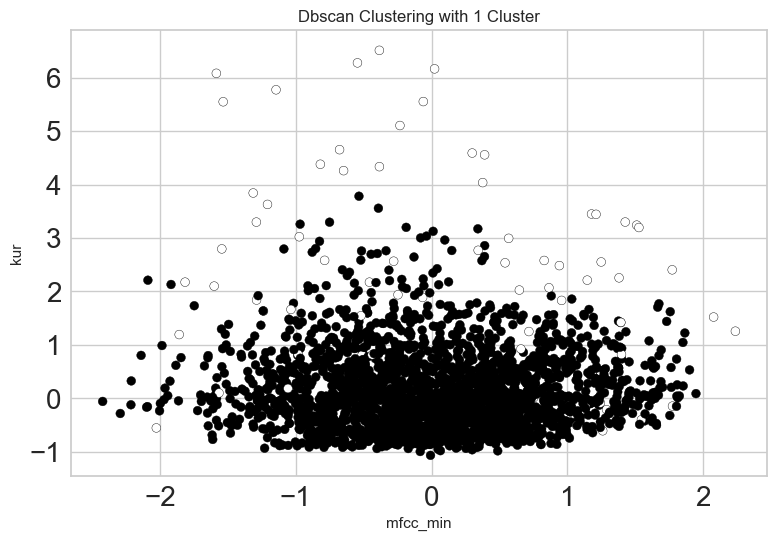

In [280]:
plt.scatter( X_robust[:,3], X_robust[:,7 ], s=40, edgecolor='black', c= dbscan.labels_ )

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel("mfcc_min")
plt.ylabel("kur")
plt.title("Dbscan Clustering with 1 Cluster")
plt.show()

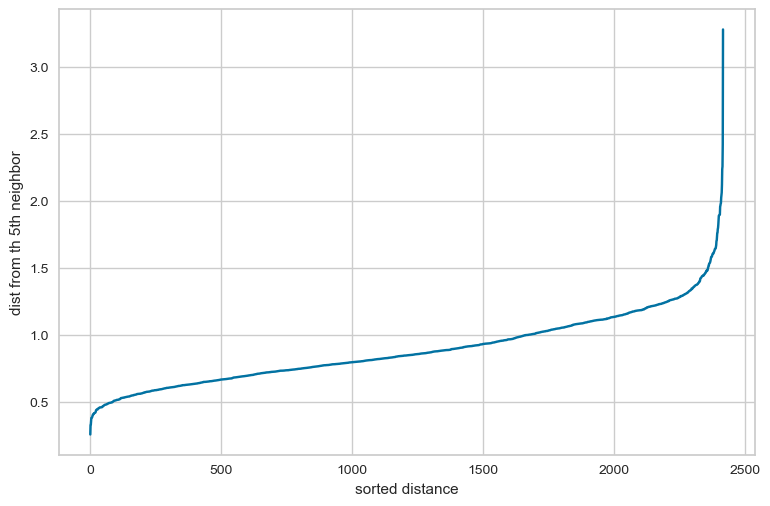

In [281]:
dist1 = pdist(X_robust, 'euclidean')
dist1 = squareform(dist1)

k=3
kth_distances = []
for d in dist1:
    index_kth_distance = np.argsort(d)[k]
    kth_distances.append(d[index_kth_distance])
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from th 5th neighbor')
plt.xlabel('sorted distance')
         
plt.show()

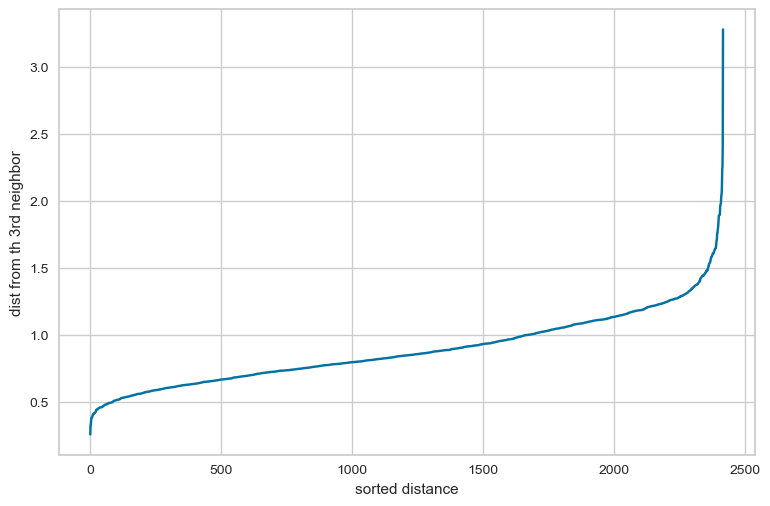

In [282]:
dist2 = pdist(X_robust, 'euclidean')
dist2 = squareform(dist2)

k=3
kth_distances = []
for d in dist2:
    index_kth_distance = np.argsort(d)[k]
    kth_distances.append(d[index_kth_distance])
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from th 3rd neighbor')
plt.xlabel('sorted distance')
         
plt.show()

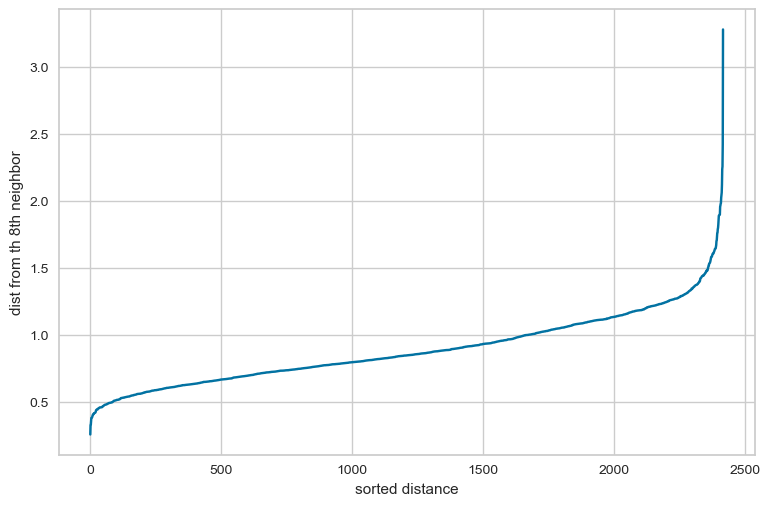

In [283]:
dist3 = pdist(X_robust, 'euclidean')
dist3 = squareform(dist3)

k=3
kth_distances = []
for d in dist3:
    index_kth_distance = np.argsort(d)[k]
    kth_distances.append(d[index_kth_distance])
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from th 8th neighbor')
plt.xlabel('sorted distance')
         
plt.show()

In [284]:
dlabels

array([0, 0, 0, ..., 0, 0, 0])

In [285]:
# print('SSE', dbscan.inertia_)
print('Silhouette', silhouette_score(X_robust, dbscan.labels_))

Silhouette 0.3010077022604819


In [286]:
y = df["statement"]
# check how many of the samples were correctly labeled
correct_labels = sum(y == dlabels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 1173 out of 2417 samples were correctly labeled.
Accuracy score: 0.49


In [287]:
clust_name

['A', 'B', 'C']

## Heirarichal Clustering (Agglomerative Approach)

### 1) Complete Linkage

Text(0.5, 1.0, 'dendogram using complete')

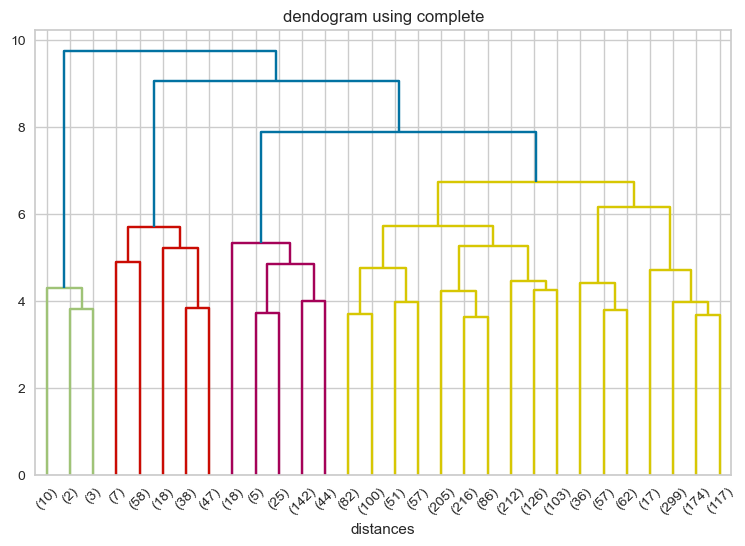

In [288]:
data_dist = pdist(X_robust, metric='euclidean')
data_link = linkage(data_dist, method='complete')

res = dendrogram(data_link, truncate_mode='lastp')
plt.xlabel("distances")
plt.title("dendogram using complete")

In [289]:
hier10 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
hier10.fit(X_robust)

hist10, bins10 = np.histogram(hier10.labels_, bins=range(0, len(set(hier10.labels_)) + 1))
print('labels', dict(zip(bins10, hist10)))
print('silhouette', silhouette_score(X_robust, hier10.labels_))

labels {0: 2234, 1: 15, 2: 168}
silhouette 0.3316340087583796


### 2) Single Linkage

Text(0.5, 1.0, 'dendogram using single')

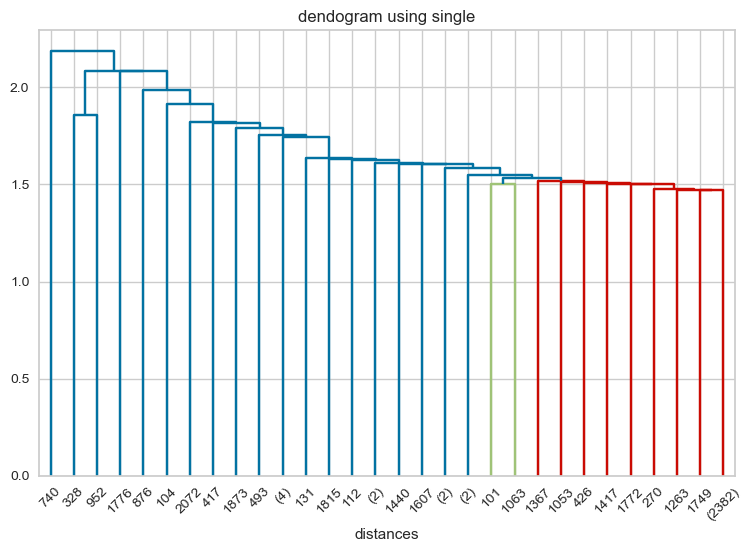

In [290]:
data_dist = pdist(X_robust, metric='euclidean')
data_link = linkage(data_dist, method='single')

res = dendrogram(data_link, truncate_mode='lastp')
plt.xlabel("distances")
plt.title("dendogram using single")

In [291]:
hier11 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='single')
hier11.fit(X_robust)

hist11, bins11 = np.histogram(hier11.labels_, bins=range(0, len(set(hier11.labels_)) + 1))
print('labels', dict(zip(bins11, hist11)))
print('silhouette', silhouette_score(X_robust, hier11.labels_))

labels {0: 2414, 1: 1, 2: 2}
silhouette 0.3535557732337175


### 3) Average Linkage

Text(0.5, 1.0, 'dendogram using average')

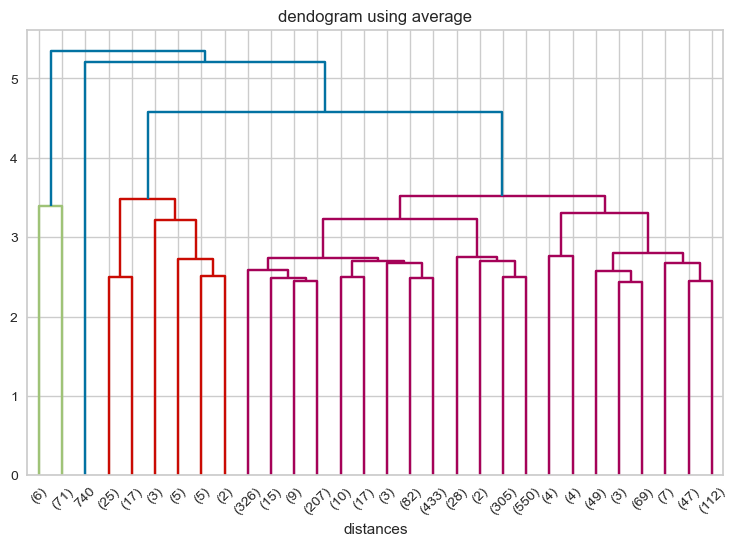

In [292]:
data_dist = pdist(X_robust, metric='euclidean')
data_link = linkage(data_dist, method='average')

res = dendrogram(data_link, truncate_mode='lastp')
plt.xlabel("distances")
plt.title("dendogram using average")

In [293]:
hier12 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='average')
hier12.fit(X_robust)

hist12, bins12 = np.histogram(hier12.labels_, bins=range(0, len(set(hier12.labels_)) + 1))
print('labels', dict(zip(bins12, hist12)))
print('silhouette', silhouette_score(X_robust, hier12.labels_))

labels {0: 2339, 1: 77, 2: 1}
silhouette 0.32842667898157857


In [294]:
len(df)

2417

### 4) Ward Linkage

Text(0.5, 1.0, 'dendogram using ward')

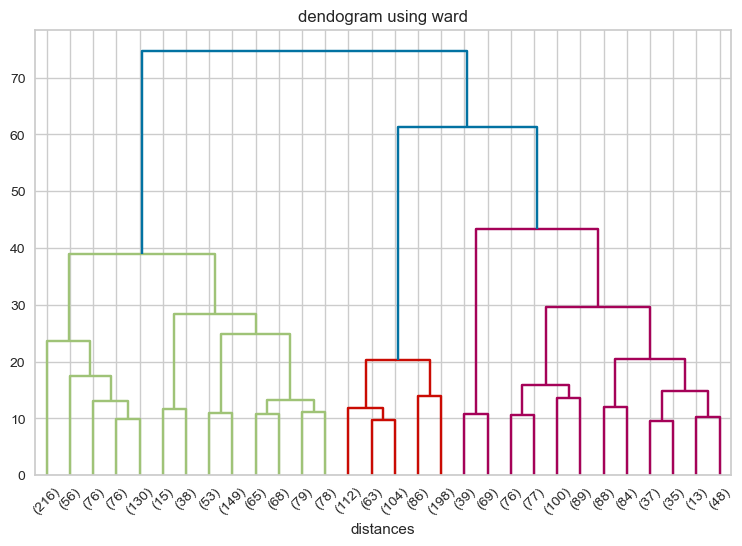

In [295]:
data_dist = pdist(X_robust, metric='euclidean')
data_link = linkage(data_dist, method='ward')

res = dendrogram(data_link, truncate_mode='lastp')
plt.xlabel("distances")
plt.title("dendogram using ward")

In [296]:
hier13 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
hier13.fit(X_robust)

hist13, bins13 = np.histogram(hier13.labels_, bins=range(0, len(set(hier13.labels_)) + 1))
print('labels', dict(zip(bins13, hist13)))
print('silhouette', silhouette_score(X_robust, hier13.labels_))

labels {0: 755, 1: 1099, 2: 563}
silhouette 0.18732693703351677


In [297]:
hier = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
hier.fit(X_robust)

hist, bins = np.histogram(hier.labels_, bins=range(0, len(set(hier.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_robust, hier.labels_))

labels {0: 2234, 1: 15, 2: 168}
silhouette 0.3316340087583796


In [298]:
hier.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [299]:
# Inorder to use categorical attributes also for clustering, 
# we use dist instead of scaled x_robust, by changing distance metric affinity
hier1 = AgglomerativeClustering(n_clusters=3, affinity='precomputed', linkage='single')
hier1.fit(dist2)

hist, bins = np.histogram(hier1.labels_, bins=range(0, len(set(hier1.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(dist2, hier1.labels_))

labels {0: 2414, 1: 1, 2: 2}
silhouette 0.49762167559826176


In [300]:
hier.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [301]:
# dist is the distance matrix

In [302]:
# print('SSE', dbscan.inertia_)
print('Silhouette', silhouette_score(X_robust, hier.labels_))

Silhouette 0.3316340087583796


/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


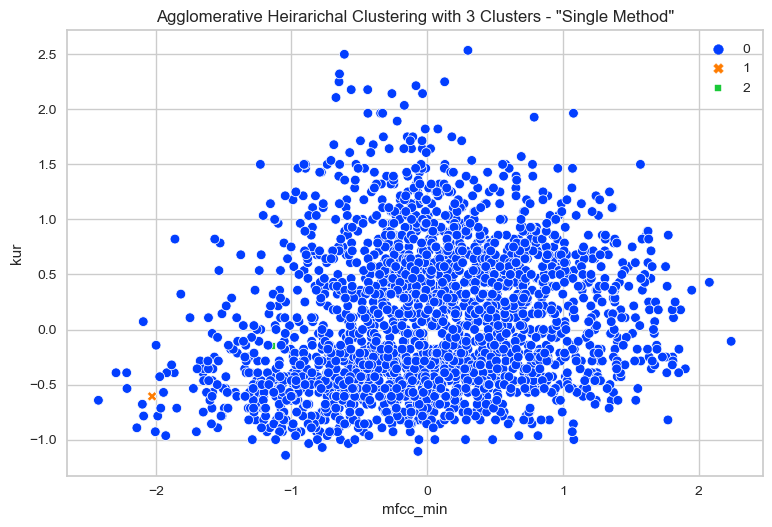

In [303]:
sns.scatterplot(X_robust[:,3], X_robust[:,9],
                hue=hier11.labels_, style=hier11.labels_, palette="bright")
plt.xlabel("mfcc_min")
plt.ylabel("kur")
plt.title("Agglomerative Heirarichal Clustering with 3 Clusters - \"Single Method\"")
plt.show()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


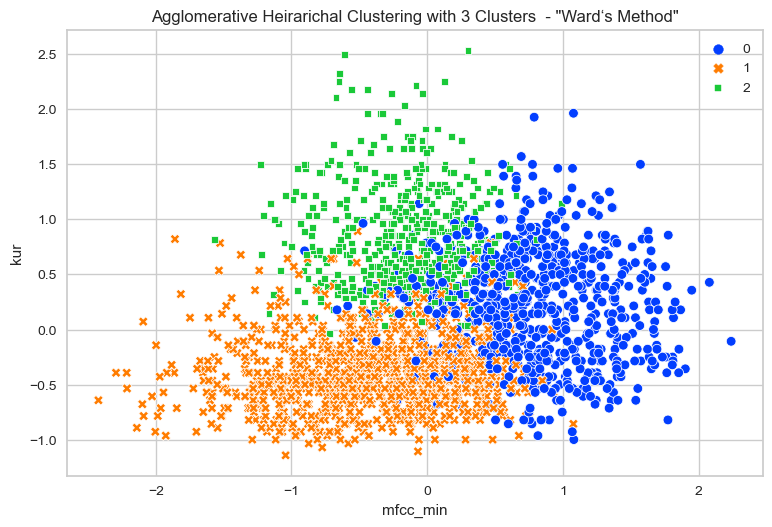

In [304]:
sns.scatterplot(X_robust[:,3], X_robust[:,9],
                hue=hier13.labels_, style=hier13.labels_, palette="bright")
plt.xlabel("mfcc_min")
plt.ylabel("kur")
plt.title("Agglomerative Heirarichal Clustering with 3 Clusters  - \"Ward‘s Method\"")
plt.show()

In [305]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [306]:
hist4, bins4 = np.histogram(dbscan.labels_, bins=range(-1, len(set(dbscan.labels_)) + 1))

print('labels', dict(zip(bins4, hist4)))
print('silhouette', silhouette_score(X_robust, dbscan.labels_))

labels {-1: 79, 0: 2338, 1: 0}
silhouette 0.3010077022604819


In [307]:
y = df["statement"]
# check how many of the samples were correctly labeled
correct_labels = sum(y == hier13.labels_)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 929 out of 2417 samples were correctly labeled.
Accuracy score: 0.38


# Regression


In [308]:
# # Preprocessing
# # Converting categorical cols back to names

# # Converting Categorical Attributes to Numeric Values

# statement_map = {0: "Dogs are sitting by the door", 1 : "Kids are talking by the door"}

# emotional_intensity_map = {0 : "normal", 1: "strong"}

# emotion_map = {0 : 'neutral', 1 : 'calm', 2: 'happy', 3 : 'sad', 4 : 'angry', 5 :'fearful', 6 : 'disgust', 7 : 'surprised'}

# repetition_map = {0 : "1st", 1 : "2nd"}

# vocal_channel_map = {0 : "speech", 1 : "song"}

# sex_map = {0 : "M", 1 : "F"}

# df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
#             "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
#            "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

## Linear Regression

<AxesSubplot:xlabel='std', ylabel='max'>

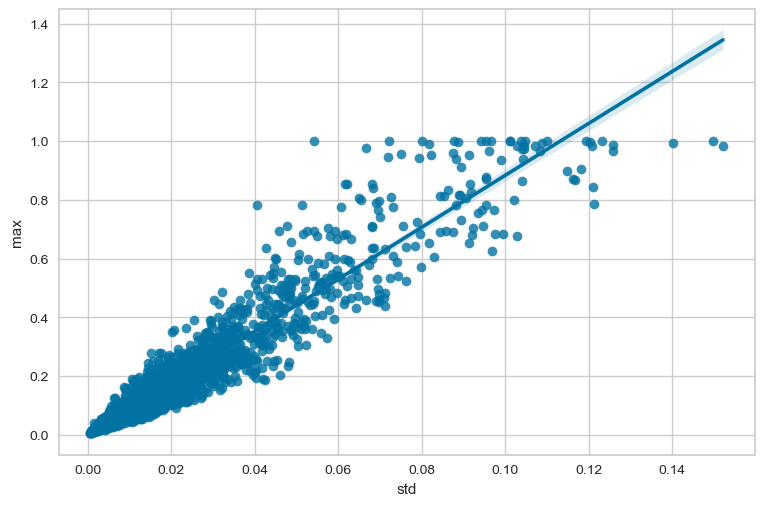

In [309]:
sns.regplot(x='std',y='max',data=df)

<AxesSubplot:xlabel='frame_count', ylabel='sc_skew'>

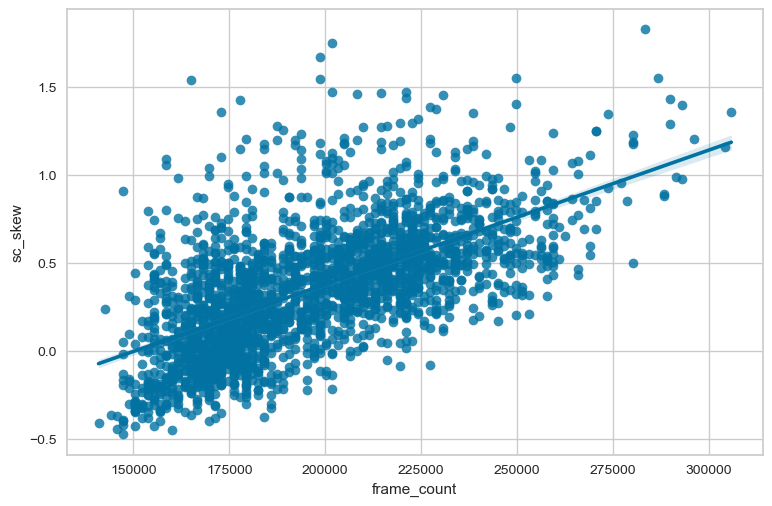

In [310]:
sns.regplot(x='frame_count',y='sc_skew',data=df)

<AxesSubplot:xlabel='intensity', ylabel='mfcc_min'>

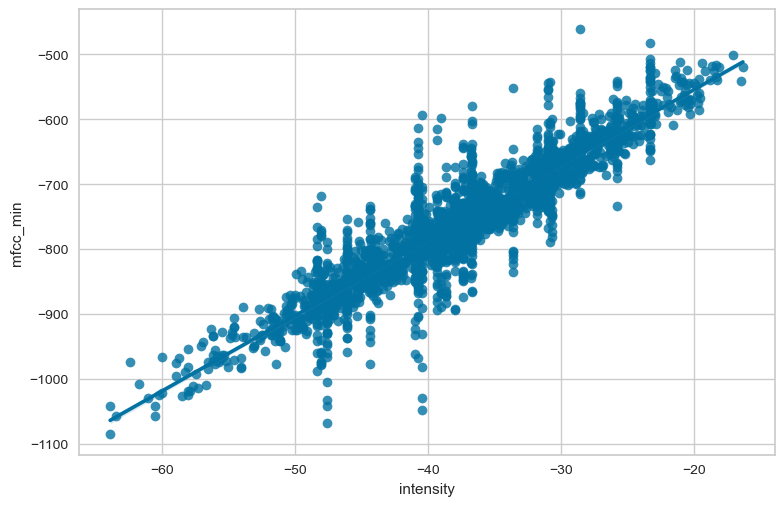

In [311]:
# This relation is best to be tested with Linear Regression
sns.regplot(x='intensity',y='mfcc_min',data=df)

In [312]:
X = df["intensity"]
y = df["mfcc_min"]
np.polyfit(X, y, deg = 1) #mentioning the degree of polynomial, in linear reg, 
# we use only x to the power 1 (we use polyfit yo get Beta coefficients)

array([  11.62335374, -321.42136254])

In [313]:
potential_intensity = np.linspace(-10, -70, 100)

In [314]:
potential_intensity

array([-10.        , -10.60606061, -11.21212121, -11.81818182,
       -12.42424242, -13.03030303, -13.63636364, -14.24242424,
       -14.84848485, -15.45454545, -16.06060606, -16.66666667,
       -17.27272727, -17.87878788, -18.48484848, -19.09090909,
       -19.6969697 , -20.3030303 , -20.90909091, -21.51515152,
       -22.12121212, -22.72727273, -23.33333333, -23.93939394,
       -24.54545455, -25.15151515, -25.75757576, -26.36363636,
       -26.96969697, -27.57575758, -28.18181818, -28.78787879,
       -29.39393939, -30.        , -30.60606061, -31.21212121,
       -31.81818182, -32.42424242, -33.03030303, -33.63636364,
       -34.24242424, -34.84848485, -35.45454545, -36.06060606,
       -36.66666667, -37.27272727, -37.87878788, -38.48484848,
       -39.09090909, -39.6969697 , -40.3030303 , -40.90909091,
       -41.51515152, -42.12121212, -42.72727273, -43.33333333,
       -43.93939394, -44.54545455, -45.15151515, -45.75757576,
       -46.36363636, -46.96969697, -47.57575758, -48.18

In [315]:
predicted_sales = 11.62335374 * potential_intensity + -321.42136254

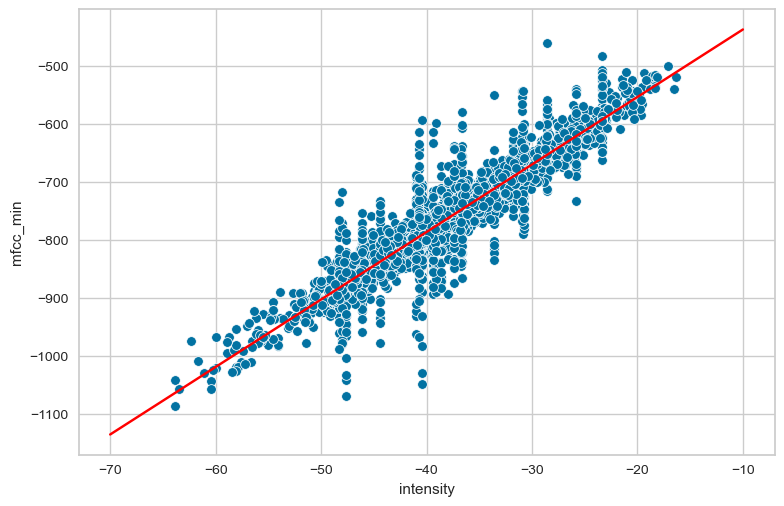

In [316]:
# This relation is best to be tested with Linear Regression
sns.scatterplot(x='intensity',y='mfcc_min',data=df)
plt.plot(potential_intensity, predicted_sales, color="red")

In [317]:
pot = -38

In [318]:
pred_sales = 11.62335374 * pot + -321.42136254

In [319]:
pred_sales

-763.10880466

In [320]:
# to get higher degree polynomials, we increase degree(to higher order)
np.polyfit(X, y, deg = 3)

array([ 3.72860737e-04,  7.47598725e-02,  1.56224040e+01, -2.58942587e+02])

In [321]:
potential_intensity = np.linspace(-10, -70, 100)

In [322]:
pred_sales_pol = 3.72860737e-04*potential_intensity**3 +  7.47598725e-02*potential_intensity**2 +  1.56224040e+01*potential_intensity**1 + -2.58942587e+02

<AxesSubplot:xlabel='intensity', ylabel='mfcc_min'>

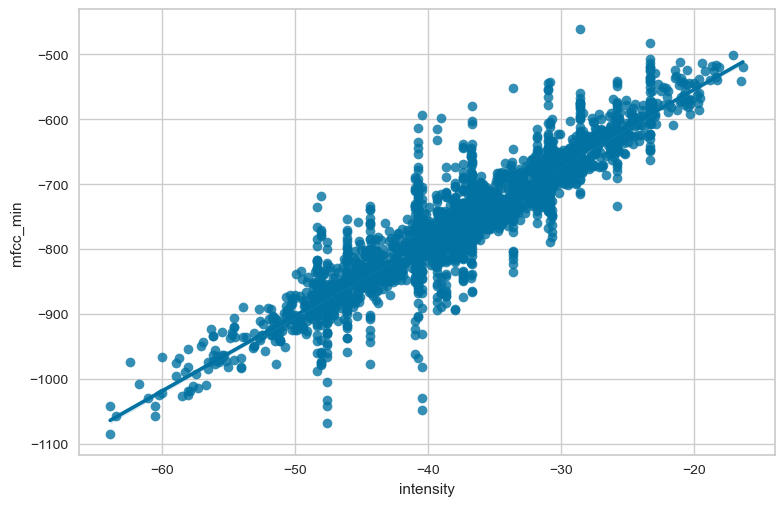

In [323]:
sns.regplot(x='intensity',y='mfcc_min',data=df)

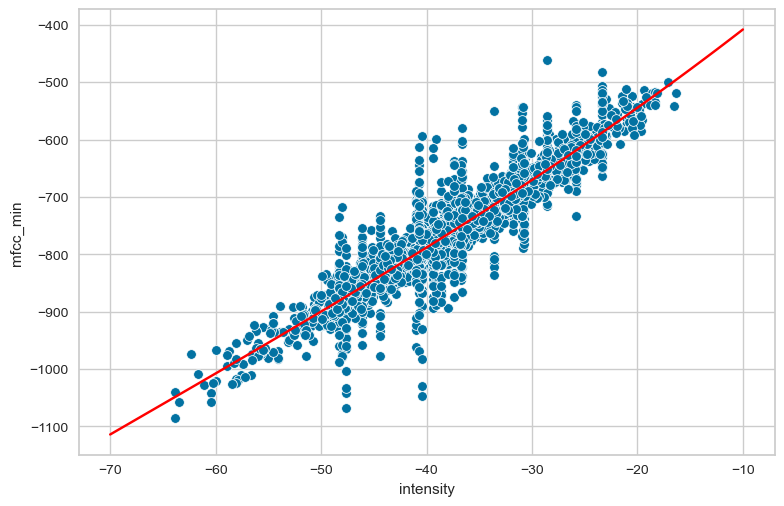

In [324]:
# This relation is best to be tested with Polynomial Regression
sns.scatterplot(x='intensity',y='mfcc_min',data=df)
plt.plot(potential_intensity, pred_sales_pol, color="red")

In [325]:
df.corr()["mfcc_min"].nlargest(3)

mfcc_min     1.000000
intensity    0.916340
std          0.842117
Name: mfcc_min, dtype: float64

In [326]:
df.corr()["intensity"].nlargest(3)

intensity    1.000000
mfcc_min     0.916340
std          0.811531
Name: intensity, dtype: float64

In [327]:
numeric_cols

['actor',
 'sample_width',
 'frame_rate',
 'length_ms',
 'frame_count',
 'intensity',
 'zero_crossings_sum',
 'mfcc_mean',
 'mfcc_std',
 'mfcc_min',
 'mfcc_max',
 'sc_mean',
 'sc_std',
 'sc_min',
 'sc_max',
 'sc_kur',
 'sc_skew',
 'stft_mean',
 'stft_std',
 'stft_min',
 'stft_max',
 'stft_kur',
 'stft_skew',
 'mean',
 'std',
 'min',
 'max',
 'kur',
 'skew']

In [328]:
clus_cols

['vocal_channel',
 'length_ms',
 'emotion',
 'mfcc_min',
 'emotional_intensity',
 'max',
 'statement',
 'kur',
 'repetition',
 'frame_count',
 'sex',
 'stft_std']

In [329]:
reg_cols = ['length_ms', 'mfcc_min', 'max', 'kur', 'frame_count', 'stft_std']

<Figure size 2000x800 with 0 Axes>

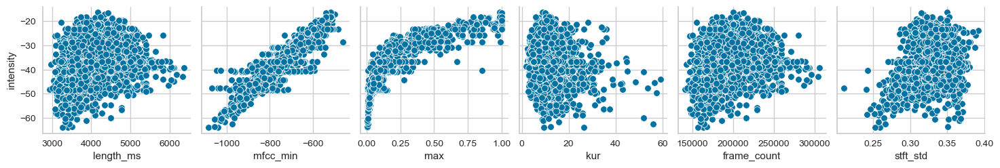

In [330]:
plt.figure(figsize=(20,8))
sns.pairplot(df, x_vars=reg_cols, y_vars=["intensity"])

In [331]:
X = df.drop("intensity", axis=1)

In [332]:
y = df["intensity"]

In [333]:
from sklearn.model_selection import train_test_split
# random_state: 
# https://stackoverflow.com/questions/28064634/random-state-pseudo-random-number-in-scikit-learn
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [334]:
# Creating a Model (Estimator)
from sklearn.linear_model import LinearRegression


In [335]:
model = LinearRegression()

In [336]:
model.fit(X_train,y_train)

LinearRegression()

In [337]:
test_predictions = model.predict(X_test)

In [338]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

In [339]:
df["intensity"].mean()

-37.650696400410624

<AxesSubplot:xlabel='intensity', ylabel='Count'>

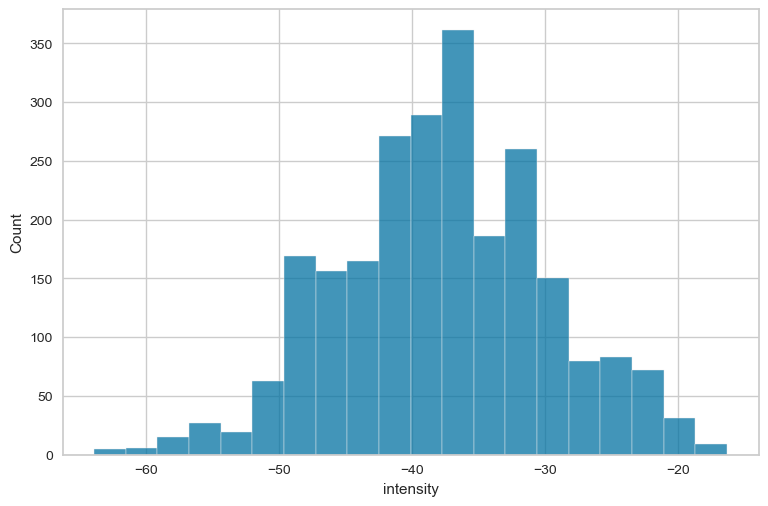

In [340]:
sns.histplot(data =df, x = "intensity", bins=20)

In [341]:
mean_absolute_error(y_test, test_predictions)

1.944972603969688

In [342]:
mean_squared_error(y_test, test_predictions)

7.497798972045127

In [343]:
np.sqrt(mean_squared_error(y_test, test_predictions))


2.738210907151808

In [344]:
test_residuals = y_test -  test_predictions

In [345]:
# positive values in test residuals are under estimated
# negative values in test residuals are over estimated

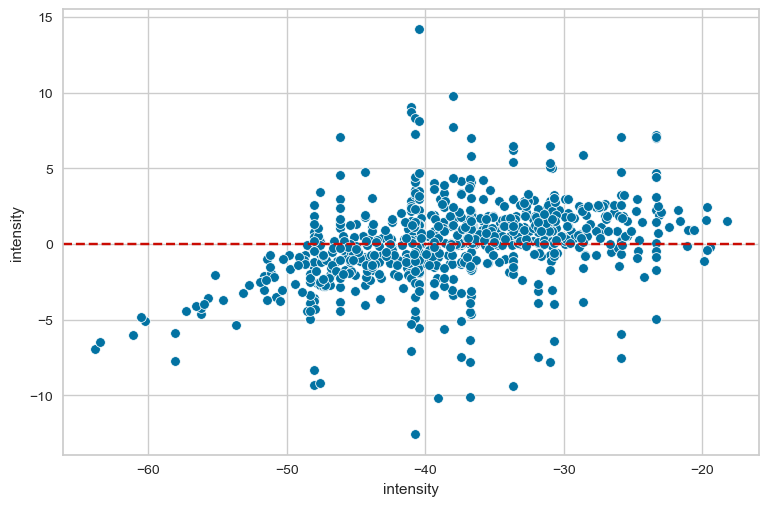

In [346]:
# Residual Plot
sns.scatterplot(x=y_test, y=test_residuals)
plt.axhline(y=0, color="r", ls="--")

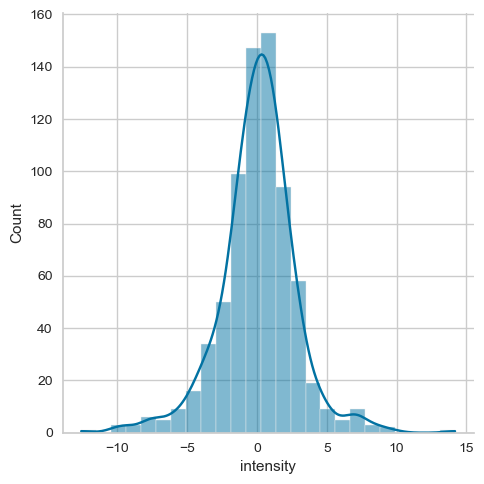

In [347]:
sns.displot(test_residuals, bins=25, kde=True)

In [348]:
# We will use normal probability plot to check whether the distribution is normal
import scipy as sp

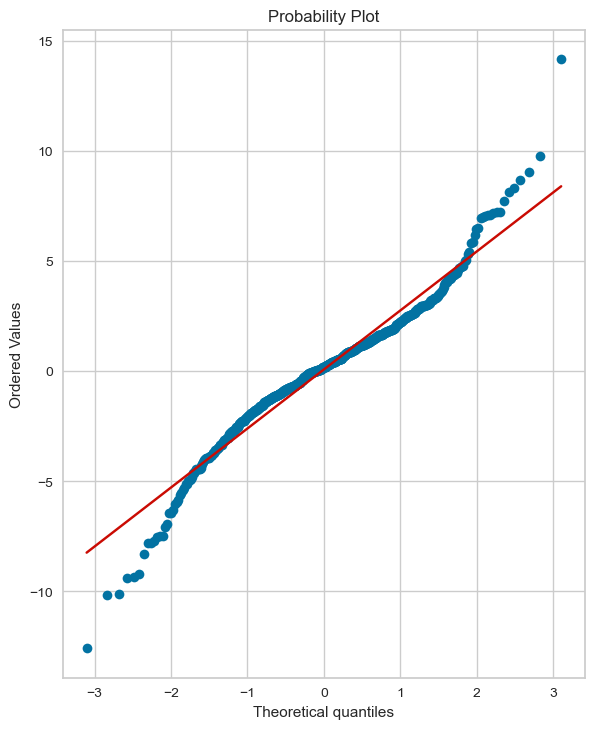

In [349]:
# Create a figure and axis to plot on
fig, ax = plt.subplots(figsize=(6,8),dpi=100)
# probplot returns the raw values if needed
# we just want to see the plot, so we assign these values to _
_ = sp.stats.probplot(test_residuals,plot=ax)

In [350]:
final_model = LinearRegression()

In [351]:
final_model.fit(X, y)

LinearRegression()

In [352]:
final_model.coef_

array([ 1.74908090e+00,  8.94293629e-02,  6.55925119e-01, -8.50605372e-02,
       -4.80450143e-02, -7.00130278e-01,  2.99662836e-01, -6.25559494e-03,
       -1.16745198e-04,  3.98591315e-03, -2.75384678e-01,  1.04321814e-02,
        1.44442572e-02,  8.43440836e-05,  7.37386335e-05,  1.05545833e-04,
        6.30780357e-05, -5.23974912e-01, -1.23442747e+00,  8.25051720e+00,
        3.94570758e+01,  9.01631680e+00,  1.89652665e+00,  2.20640087e+00,
       -5.97449840e+02, -2.99503189e+00,  1.40993780e+00,  7.00497837e+00,
       -6.73070250e-02,  3.21372442e-01, -1.33636546e-02])

In [353]:
X.head()

,vocal_channel,emotion,emotional_intensity,statement,repetition,sex,length_ms,frame_count,zero_crossings_sum,mfcc_mean,...,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew,kmeans_labels
0,0.0,5,0,0,1,1,3737,179379.0,16995,-33.485947,...,0.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153,1
1,0.0,4,0,0,0,1,3904,187387.0,13906,-29.502108,...,0.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157,1
2,0.0,2,1,0,1,1,4671,224224.0,18723,-30.532463,...,0.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659,2
3,0.0,7,0,1,0,1,3637,174575.0,11617,-36.059555,...,0.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014,1
4,1.0,2,1,0,1,1,4404,211411.0,15137,-31.405996,...,0.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872,2


In [354]:

y_hat = final_model.predict(X)

In [355]:
reg_cols

['length_ms', 'mfcc_min', 'max', 'kur', 'frame_count', 'stft_std']

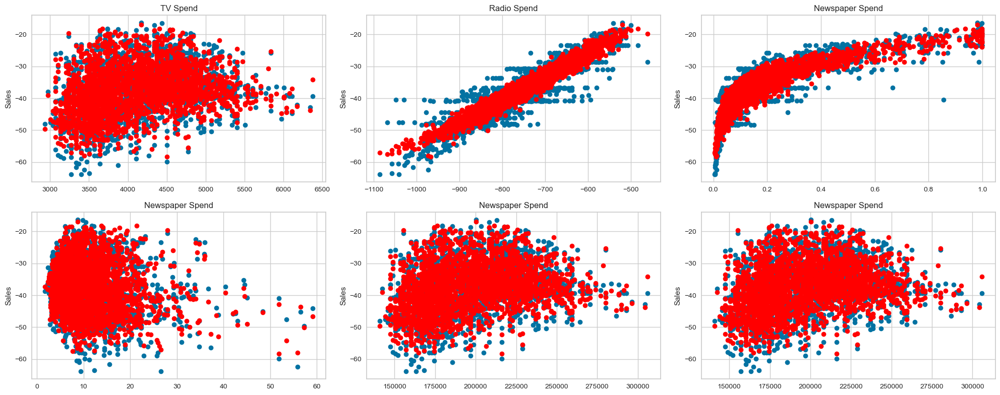

In [356]:
fig,axes = plt.subplots(nrows=2,ncols=3,figsize=(20,8))

axes[0][0].plot(df['length_ms'],df['intensity'],'o')
axes[0][0].plot(df['length_ms'],y_hat,'o',color='red')
axes[0][0].set_ylabel("Sales")
axes[0][0].set_title("TV Spend")

axes[0][1].plot(df['mfcc_min'],df['intensity'],'o')
axes[0][1].plot(df['mfcc_min'],y_hat,'o',color='red')
axes[0][1].set_title("Radio Spend")
axes[0][1].set_ylabel("Sales")

axes[0][2].plot(df['max'],df['intensity'],'o')
axes[0][2].plot(df['max'],y_hat,'o',color='red')
axes[0][2].set_title("Newspaper Spend");
axes[0][2].set_ylabel("Sales")

axes[1][0].plot(df['kur'],df['intensity'],'o')
axes[1][0].plot(df['kur'],y_hat,'o',color='red')
axes[1][0].set_title("Newspaper Spend");
axes[1][0].set_ylabel("Sales")

axes[1][1].plot(df['frame_count'],df['intensity'],'o')
axes[1][1].plot(df['frame_count'],y_hat,'o',color='red')
axes[1][1].set_title("Newspaper Spend");
axes[1][1].set_ylabel("Sales")
                
axes[1][2].plot(df['frame_count'],df['intensity'],'o')
axes[1][2].plot(df['frame_count'],y_hat,'o',color='red')
axes[1][2].set_title("Newspaper Spend");
axes[1][2].set_ylabel("Sales")

plt.tight_layout();

In [357]:
residuals = y_hat - y

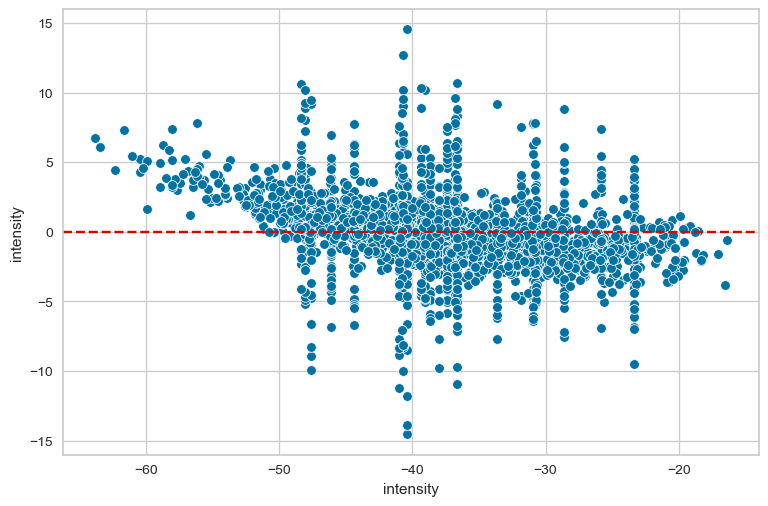

In [358]:
sns.scatterplot(x=y,y=residuals)
plt.axhline(y=0, color='r', linestyle='--')

In [359]:
final_model.coef_

array([ 1.74908090e+00,  8.94293629e-02,  6.55925119e-01, -8.50605372e-02,
       -4.80450143e-02, -7.00130278e-01,  2.99662836e-01, -6.25559494e-03,
       -1.16745198e-04,  3.98591315e-03, -2.75384678e-01,  1.04321814e-02,
        1.44442572e-02,  8.43440836e-05,  7.37386335e-05,  1.05545833e-04,
        6.30780357e-05, -5.23974912e-01, -1.23442747e+00,  8.25051720e+00,
        3.94570758e+01,  9.01631680e+00,  1.89652665e+00,  2.20640087e+00,
       -5.97449840e+02, -2.99503189e+00,  1.40993780e+00,  7.00497837e+00,
       -6.73070250e-02,  3.21372442e-01, -1.33636546e-02])

In [360]:
coeff_df = pd.DataFrame(final_model.coef_,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
vocal_channel,1.749081
emotion,0.089429
emotional_intensity,0.655925
statement,-0.085061
repetition,-0.048045
sex,-0.700130
length_ms,0.299663
frame_count,-0.006256
zero_crossings_sum,-0.000117
mfcc_mean,0.003986


In [361]:
y_pred = final_model.predict(X_test)

In [362]:
# Interpreting the coefficients:
# Holding all other features fixed, a 1 unit (A thousand m length) increase in length_ms 
# is associated with an increase in intensity of 0.0285 "intensity units", in this case 
# 1000s of units .
# This basically means that for every 1000 increase in length_ms, we could expect 25 
# more units increased in intensity.

# Likewise for all

In [363]:
X.head()

,vocal_channel,emotion,emotional_intensity,statement,repetition,sex,length_ms,frame_count,zero_crossings_sum,mfcc_mean,...,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew,kmeans_labels
0,0.0,5,0,0,1,1,3737,179379.0,16995,-33.485947,...,0.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153,1
1,0.0,4,0,0,0,1,3904,187387.0,13906,-29.502108,...,0.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157,1
2,0.0,2,1,0,1,1,4671,224224.0,18723,-30.532463,...,0.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659,2
3,0.0,7,0,1,0,1,3637,174575.0,11617,-36.059555,...,0.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014,1
4,1.0,2,1,0,1,1,4404,211411.0,15137,-31.405996,...,0.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872,2


In [364]:
# # Prediction on New Data
# new_data =[[4641, -716.0603, 0.126351, 2.881241, 224214.0, 0.392270]]
# final_model.predict(new_data)

In [365]:
# Model Persistence (Saving and Loading a Model)
from joblib import dump, load
dump(final_model, 'intensity_model.joblib') 

['intensity_model.joblib']

In [366]:
# loaded_model = load('intensity_model.joblib')
# loaded_model.predict(new_data)

## Ridge Regression

In [367]:
## CREATE X and y
X = df[reg_cols]
y = df["intensity"]

# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [368]:
# Create Model
from sklearn.linear_model import Ridge
# Poor Alpha Choice on purpose!
model = Ridge(alpha=100)
model.fit(X_train,y_train)

Ridge(alpha=100)

In [369]:
y_pred = model.predict(X_test)

In [370]:
# Evaluation
from sklearn.metrics import mean_absolute_error,mean_squared_error
MAE = mean_absolute_error(y_test,y_pred)
MSE = mean_squared_error(y_test,y_pred)
RMSE = np.sqrt(MSE)

In [371]:
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.2529595038460966, MSE: 9.067961557597341, RMSE: 3.011305623412765


In [372]:
# Adjust Parameters and Re-evaluate
model = Ridge(alpha=1)
model.fit(X_train,y_train)

Ridge(alpha=1)

In [373]:
y_pred = model.predict(X_test)

In [374]:
# Another Evaluation
MAE = mean_absolute_error(y_test,y_pred)
MSE = mean_squared_error(y_test,y_pred)
RMSE = np.sqrt(MSE)

In [375]:
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.156584413013602, MSE: 8.748186580393247, RMSE: 2.9577333518073003


### CV Train | Validation | Test Split Procedure

In [376]:
## CREATE X and y
X = df[reg_cols]
y = df["intensity"]

######################################################################
#### SPLIT TWICE! Here we create TRAIN | VALIDATION | TEST  #########
####################################################################
from sklearn.model_selection import train_test_split

# 70% of data is training data, set aside other 30%
X_train, X_OTHER, y_train, y_OTHER = train_test_split(X, y, test_size=0.3, random_state=101)

# Remaining 30% is split into evaluation and test sets
# Each is 15% of the original data size
X_eval, X_test, y_eval, y_test = train_test_split(X_OTHER, y_OTHER, test_size=0.5, random_state=101)

In [377]:
# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_eval = scaler.transform(X_eval)
X_test = scaler.transform(X_test)

In [378]:
# Create Model
from sklearn.linear_model import Ridge
# Poor Alpha Choice on purpose!
model = Ridge(alpha=100)
model.fit(X_train,y_train)

Ridge(alpha=100)

In [379]:
y_eval_pred = model.predict(X_eval)

In [380]:
# Evaluation
from sklearn.metrics import mean_absolute_error,mean_squared_error
MAE = mean_absolute_error(y_eval,y_eval_pred)
MSE = mean_squared_error(y_eval,y_eval_pred)
RMSE = np.sqrt(MSE)

In [381]:
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.2569140231006437, MSE: 8.817541016586887, RMSE: 2.9694344607326975


In [382]:
# Adjust Parameters and Re-evaluate
model = Ridge(alpha=1)
model.fit(X_train,y_train)

Ridge(alpha=1)

In [383]:
y_eval_pred = model.predict(X_eval)

In [384]:
# Another Evaluation
from sklearn.metrics import mean_absolute_error,mean_squared_error
MAE = mean_absolute_error(y_eval,y_eval_pred)
MSE = mean_squared_error(y_eval,y_eval_pred)
RMSE = np.sqrt(MSE)
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.16050723590808, MSE: 8.486159834902283, RMSE: 2.9131014117092255


In [385]:
# Final Evaluation (Can no longer edit parameters after this!)
y_final_test_pred = model.predict(X_test)
MAE = mean_absolute_error(y_test,y_final_test_pred)
MSE = mean_squared_error(y_test,y_final_test_pred)
RMSE = np.sqrt(MSE)
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.152661590119124, MSE: 9.01021332588421, RMSE: 3.0017017383284785


### CV cross_validate

In [386]:
## CREATE X and y
X = df[reg_cols]
y = df["intensity"]

# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [387]:
# Create Model
from sklearn.linear_model import Ridge
# Poor Alpha Choice on purpose!
model = Ridge(alpha=100)

In [388]:
from sklearn.model_selection import cross_validate
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=10)

In [389]:
scores

{'fit_time': array([0.00429988, 0.00250864, 0.00356889, 0.00185919, 0.00137281,
        0.00119376, 0.00108624, 0.00117087, 0.00178909, 0.00114822]),
 'score_time': array([0.00103021, 0.00083923, 0.00089073, 0.0008409 , 0.00071096,
        0.00063491, 0.00070691, 0.00064707, 0.00079203, 0.00061798]),
 'test_neg_mean_absolute_error': array([-1.83665317, -2.27102177, -2.19091696, -2.23509857, -2.2220286 ,
        -2.40922209, -2.13640998, -2.23201817, -2.21255379, -2.2164565 ]),
 'test_neg_mean_squared_error': array([ -5.73193655,  -9.67163937,  -8.7910712 ,  -9.42318855,
         -9.68962889, -10.40258654,  -7.07610927,  -9.28637149,
         -9.15437008,  -8.37530688]),
 'test_max_error': array([ -7.41323931, -12.77161582, -12.17851525, -15.66185628,
        -12.61897377, -11.60804554,  -9.25696977, -14.76194257,
        -12.65023179, -10.39160181])}

In [390]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.004300,0.001030,-1.836653,-5.731937,-7.413239
1,0.002509,0.000839,-2.271022,-9.671639,-12.771616
2,0.003569,0.000891,-2.190917,-8.791071,-12.178515
3,0.001859,0.000841,-2.235099,-9.423189,-15.661856
4,0.001373,0.000711,-2.222029,-9.689629,-12.618974
5,0.001194,0.000635,-2.409222,-10.402587,-11.608046
6,0.001086,0.000707,-2.136410,-7.076109,-9.256970
7,0.001171,0.000647,-2.232018,-9.286371,-14.761943
8,0.001789,0.000792,-2.212554,-9.154370,-12.650232
9,0.001148,0.000618,-2.216457,-8.375307,-10.391602


In [391]:
pd.DataFrame(scores).mean()

fit_time                         0.002000
score_time                       0.000771
test_neg_mean_absolute_error    -2.196238
test_neg_mean_squared_error     -8.760221
test_max_error                 -11.931299
dtype: float64

In [392]:
# Adjust model based on metrics
model = Ridge(alpha=1)
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

In [393]:
pd.DataFrame(scores).mean()

fit_time                         0.002441
score_time                       0.001117
test_neg_mean_absolute_error    -2.091387
test_neg_mean_squared_error     -8.548493
test_max_error                 -14.246088
dtype: float64

In [394]:
# Final Evaluation (Can no longer edit parameters after this!)
# Need to fit the model first!
model.fit(X_train,y_train)

Ridge(alpha=1)

In [395]:
y_final_test_pred = model.predict(X_test)

In [396]:
# Final Evaluation
MAE = mean_absolute_error(y_test,y_final_test_pred)
MSE = mean_squared_error(y_test,y_final_test_pred)
RMSE = np.sqrt(MSE)
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.156584413013602, MSE: 8.748186580393247, RMSE: 2.9577333518073003


### CV cross_val_score

In [397]:
## CREATE X and y
X = df[reg_cols]
y = df["intensity"]

# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [398]:
from sklearn.model_selection import cross_validate
# Create Model
from sklearn.linear_model import Ridge
# Poor Alpha Choice on purpose!
model = Ridge(alpha=100)

In [399]:
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(model,X_train,y_train,
                         scoring='neg_mean_absolute_error',cv=10)

In [400]:
scores

array([-1.83665317, -2.27102177, -2.19091696, -2.23509857, -2.2220286 ,
       -2.40922209, -2.13640998, -2.23201817, -2.21255379, -2.2164565 ])

In [401]:
abs(scores.mean())

2.1962379594119725

In [402]:
# Adjust model based on metrics
model = Ridge(alpha=1)
scores = cross_val_score(model,X_train,y_train,
                         scoring='neg_mean_absolute_error',cv=10)
abs(scores.mean())

2.0928310367501033

In [403]:
# Final Evaluation (Can no longer edit parameters after this!)
# Need to fit the model first!
model.fit(X_train,y_train)
y_final_test_pred = model.predict(X_test)

In [404]:
# Final Evaluation
MAE = mean_absolute_error(y_test,y_final_test_pred)
MSE = mean_squared_error(y_test,y_final_test_pred)
RMSE = np.sqrt(MSE)
print("MAE: {}, MSE: {}, RMSE: {}".format(MAE, MSE, RMSE))

MAE: 2.156584413013602, MSE: 8.748186580393247, RMSE: 2.9577333518073003


## Polynomial Regression

In [405]:
X = df[reg_cols]
y = df["intensity"]

In [406]:
from sklearn.preprocessing import PolynomialFeatures

In [407]:
polynomial_converter = PolynomialFeatures(degree=1,include_bias=False)

In [408]:
polynomial_converter.fit(X)

PolynomialFeatures(degree=1, include_bias=False)

In [409]:
poly_features = polynomial_converter.transform(X)

In [410]:
poly_features.shape

(2417, 6)

In [411]:
X.shape

(2417, 6)

In [412]:
poly_features[0]

array([ 3.73700000e+03, -7.55223450e+02,  1.38946530e-01,  9.40606124e+00,
        1.79379000e+05,  3.35533140e-01])

In [413]:
X.iloc[0]

length_ms        3737.000000
mfcc_min         -755.223450
max                 0.138947
kur                 9.406061
frame_count    179379.000000
stft_std            0.335533
Name: 0, dtype: float64

In [414]:
from sklearn.model_selection import train_test_split
# random_state: 
# https://stackoverflow.com/questions/28064634/random-state-pseudo-random-number-in-scikit-learn
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=101)

In [415]:
from sklearn.linear_model import LinearRegression
poly_model = LinearRegression(fit_intercept=True)

In [416]:
poly_model.fit(X_train,y_train)

LinearRegression()

In [417]:
# Evaluation on the Test Set
test_predictions = poly_model.predict(X_test)

In [418]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

In [419]:
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [420]:
MAE

2.1558576881248457

In [421]:
MSE

8.752416004348403

In [422]:
RMSE

2.95844824263471

In [423]:
# MAE, RMSE IN Linear Regression
# MAE  = 2.1558576881248515
# RMSE = 2.958448242634707

# Higher order Polynomial Regression is working better than normal linear regression without polynomial features
# wITH Degree 2:
# MAE  = 1.9282284456101269
# RMSE = 2.7992905128877763

# wITH Degree 1:
# MAE  = 2.1558576881248457
# RMSE = 2.95844824263471


In [424]:
# TRAINING ERROR PER DEGREE
train_rmse_errors = []
# TEST ERROR PER DEGREE
test_rmse_errors = []

for d in range(1,15):
    
    # CREATE POLY DATA SET FOR DEGREE "d"
    polynomial_converter = PolynomialFeatures(degree=d,include_bias=False)
    poly_features = polynomial_converter.fit_transform(X)
    
    # SPLIT THIS NEW POLY DATA SET
    X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=101)
    
    # TRAIN ON THIS NEW POLY SET
    model = LinearRegression(fit_intercept=True)
    model.fit(X_train,y_train)
    
    # PREDICT ON BOTH TRAIN AND TEST
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)
    
    # Calculate Errors
    
    # Errors on Train Set
    train_RMSE = np.sqrt(mean_squared_error(y_train,train_pred))
    
    # Errors on Test Set
    test_RMSE = np.sqrt(mean_squared_error(y_test,test_pred))

    # Append errors to lists for plotting later
    
   
    train_rmse_errors.append(train_RMSE)
    test_rmse_errors.append(test_RMSE)

In [425]:
train_rmse_errors

[2.9040387002697394,
 2.687013295123981,
 2.7733887418978145,
 2.5907166019178574,
 2.9612757742768836,
 2.678161148964359,
 2.6419983637425717,
 2.686453377858161,
 2.7900488536599024,
 2.959368095116416,
 3.2062063902810487,
 3.609592301017894,
 4.194618031771692,
 4.401153009192289]

In [426]:
test_rmse_errors

[2.95844824263471,
 2.7992905128877763,
 2.8854542259164195,
 2.7575093174697765,
 3.098367878158795,
 2.7861433814003593,
 2.7738252754182686,
 2.7514609376586945,
 2.8253867351686646,
 2.975787376378972,
 3.222488814683793,
 3.68086810760929,
 4.6559566288535335,
 4.689654662395873]

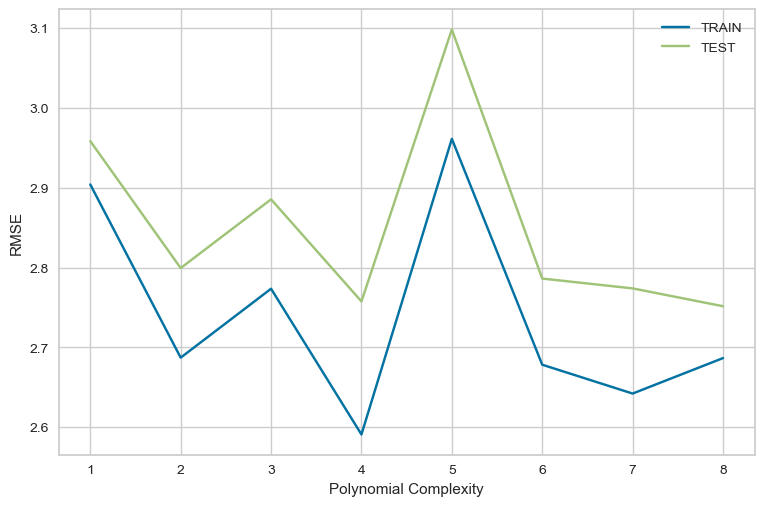

In [427]:
plt.plot(range(1,9),train_rmse_errors[:8],label='TRAIN')
plt.plot(range(1,9),test_rmse_errors[:8],label='TEST')
plt.xlabel("Polynomial Complexity")
plt.ylabel("RMSE")
plt.legend()

In [428]:
# Based on our chart, could have also been degree=1, but 
# it is better to be on the safe side of complexity
final_poly_converter = PolynomialFeatures(degree=1,include_bias=False)
final_model = LinearRegression()
final_model.fit(final_poly_converter.fit_transform(X),y)

LinearRegression()

In [429]:
from joblib import dump, load

In [430]:
dump(final_model, 'sales_poly_model.joblib') 

['sales_poly_model.joblib']

In [431]:
dump(final_poly_converter,'poly_converter.joblib')

['poly_converter.joblib']

In [432]:
# Deployment and Predictions

In [433]:
y

0      -36.793432
1      -36.663681
2      -32.290737
3      -49.019839
4      -31.214503
          ...    
2447   -47.596807
2448   -43.342901
2449   -36.772456
2450   -45.751265
2451   -40.018044
Name: intensity, Length: 2417, dtype: float64

In [434]:
X

,length_ms,mfcc_min,max,kur,frame_count,stft_std
0,3737,-755.22345,0.138947,9.406061,179379.0,0.335533
1,3904,-713.98560,0.263062,19.564187,187387.0,0.352380
2,4671,-726.06036,0.166351,4.881241,224224.0,0.352270
3,3637,-842.94635,0.024078,13.040259,174575.0,0.360552
4,4404,-700.70276,0.242676,7.485109,211411.0,0.350655
...,...,...,...,...,...,...
2447,4605,-855.92420,0.052399,9.551363,221021.0,0.304496
2448,4171,-825.37410,0.084045,22.517991,200200.0,0.306333
2449,5239,-768.36536,0.097260,4.964319,251451.0,0.347843
2450,3737,-868.09576,0.052002,13.855588,179379.0,0.308684


In [435]:
loaded_poly = load('poly_converter.joblib')
loaded_model = load('sales_poly_model.joblib')

In [436]:
campaign = [[4641, -716.0603, 0.126351, 2.881241, 224214.0, 0.392270]]
campaign_poly = loaded_poly.fit_transform(campaign)

In [437]:
campaign_poly

array([[ 4.641000e+03, -7.160603e+02,  1.263510e-01,  2.881241e+00,
         2.242140e+05,  3.922700e-01]])

In [438]:
loaded_model.predict(campaign_poly)

array([-34.85938712])

## Ridge Resgression

In [439]:
X = df[reg_cols]
y = df["intensity"]

In [440]:
from sklearn.preprocessing import PolynomialFeatures

polynomial_converter = PolynomialFeatures(degree=2,include_bias=False)
polynomial_converter.fit(X)

poly_features = polynomial_converter.transform(X)

In [441]:
X.shape

(2417, 6)

In [442]:
poly_features.shape

(2417, 27)

In [443]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=101)

In [444]:
X_train.shape

(1691, 27)

In [445]:
# Scaling the Data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [446]:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [447]:
from sklearn.linear_model import Ridge
ridge_model = Ridge(alpha=0.1)
ridge_model.fit(X_train,y_train)

Ridge(alpha=0.1)

In [448]:
test_predictions = ridge_model.predict(X_test)

In [449]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

In [450]:
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [451]:
MAE

1.94732307335658

In [452]:
MSE

7.371321317817503

In [453]:
RMSE

2.7150177380299936

In [454]:
# How did it perform on the training set? (This will be used later on for comparison)
# Training Set Performance
train_predictions = ridge_model.predict(X_train)
MAE = mean_absolute_error(y_train,train_predictions)
MAE

1.9161953555927513

In [455]:
help(Ridge)

Help on class Ridge in module sklearn.linear_model._ridge:

class Ridge(sklearn.base.MultiOutputMixin, sklearn.base.RegressorMixin, _BaseRidge)
 |  Ridge(alpha=1.0, *, fit_intercept=True, normalize='deprecated', copy_X=True, max_iter=None, tol=0.001, solver='auto', positive=False, random_state=None)
 |  
 |  Linear least squares with l2 regularization.
 |  
 |  Minimizes the objective function::
 |  
 |  ||y - Xw||^2_2 + alpha * ||w||^2_2
 |  
 |  This model solves a regression model where the loss function is
 |  the linear least squares function and regularization is given by
 |  the l2-norm. Also known as Ridge Regression or Tikhonov regularization.
 |  This estimator has built-in support for multi-variate regression
 |  (i.e., when y is a 2d-array of shape (n_samples, n_targets)).
 |  
 |  Read more in the :ref:`User Guide <ridge_regression>`.
 |  
 |  Parameters
 |  ----------
 |  alpha : {float, ndarray of shape (n_targets,)}, default=1.0
 |      Regularization strength; must be 

In [456]:
param_grid = {'alpha':[0.001, 0.01, 0.1,1,5,10,50,100, 1000],
              'l1_ratio':[.1, .5, .7, .9, .95, .99, 1]}

In [457]:
from sklearn.model_selection import GridSearchCV

### Grid Search:

In [458]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

param_grid = {'alpha':[0.1,1,5,10,50,100]}

# verbose number a personal preference
grid_model = GridSearchCV(estimator=ridge_model,
                          param_grid=param_grid,
                          scoring='neg_mean_squared_error',
                          cv=5,
                          verbose=2)
grid_result = grid_model.fit(X_train, y_train)
grid_result.best_params_

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ............................................alpha=1; total time=   0.0s
[CV] END ............................................alpha=1; total time=   0.0s
[CV] END ............................................alpha=1; total time=   0.0s
[CV] END ............................................alpha=1; total time=   0.0s
[CV] END ............................................alpha=1; total time=   0.0s
[CV] END ............................................alpha=5; total time=   0.0s
[CV] END ........................................

{'alpha': 0.1}

In [459]:
grid_model.best_params_

{'alpha': 0.1}

In [460]:
# Retrain

In [461]:
# Choosing an alpha value with Cross-Validation
from sklearn.linear_model import RidgeCV
# Choosing a scoring: https://scikit-learn.org/stable/modules/model_evaluation.html
# Negative RMSE so all metrics follow convention "Higher is better"

# See all options: sklearn.metrics.SCORERS.keys()
ridge_cv_model = RidgeCV(alphas=(0.1, 1.0, 10.0),scoring='neg_mean_absolute_error')

In [462]:
# The more alpha options you pass, the longer this will take.
# Fortunately our data set is still pretty small
ridge_cv_model.fit(X_train,y_train)

RidgeCV(alphas=array([ 0.1,  1. , 10. ]), scoring='neg_mean_absolute_error')

In [463]:
ridge_cv_model.alpha_

0.1

In [464]:
test_predictions = ridge_cv_model.predict(X_test)

In [465]:
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [466]:
MAE

1.941085583945345

In [467]:
MSE

7.335629422114088

In [468]:
RMSE

2.7084367118531842

In [469]:
ridge_cv_model.coef_

array([ 1.63529009e+00,  8.89667951e-02,  7.73108035e-01, -8.04199082e-02,
       -1.30476997e-01, -5.37992736e-01,  4.78827179e-01, -9.98925045e-03,
       -1.57938804e-04,  3.18398803e-02, -2.64972786e-01,  1.28518490e-02,
        1.46264413e-02,  1.57220784e-04, -7.48386374e-05,  8.10169440e-05,
        4.33475943e-05, -8.17880553e-01, -8.22967669e-01, -5.36231858e+00,
        1.59524493e+01,  9.47625920e-01,  1.24755733e+00, -3.00673086e-02,
        1.61502260e-02, -2.28100957e-01,  4.01488210e-01,  5.70828935e+00,
       -7.41534813e-02,  2.00911611e-01,  9.64580662e-02])

In [470]:
# None of the ridge coeff are 0

## Lasso Regression

In [471]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [472]:
from sklearn.linear_model import LassoCV

In [473]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html
lasso_cv_model = LassoCV(eps=0.001,n_alphas=10,cv=5, max_iter=10000)

In [474]:
lasso_cv_model.fit(X_train,y_train)

LassoCV(cv=5, max_iter=10000, n_alphas=10)

In [475]:
lasso_cv_model.alpha_

59.21053010069513

In [476]:
test_predictions = lasso_cv_model.predict(X_test)

In [477]:
test_predictions = lasso_cv_model.predict(X_test)
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [478]:
MAE

2.352283763000542

In [479]:
MSE

9.807621874762791

In [480]:
RMSE

3.131712291185573

In [481]:
# Training Set Performance
# Training Set Performance
train_predictions = lasso_cv_model.predict(X_train)
MAE = mean_absolute_error(y_train,train_predictions)
MAE

2.396634610375719

In [482]:
len(lasso_cv_model.coef_)

31

In [483]:
lasso_cv_model.coef_

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  2.23235630e-05,
        4.98556936e-05,  0.00000000e+00, -0.00000000e+00,  6.30085980e-02,
       -0.00000000e+00, -3.65350297e-04, -0.00000000e+00,  1.14709622e-04,
       -7.86733593e-05,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00])

In [484]:
param_grid = {'eps':[0.001, 0.01, 0.1,1,5,10,50,100, 1000]}

### Grid Search:

In [485]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

param_grid = {'n_alphas':[1, 10,100, 1000, 10000]}

# verbose number a personal preference
grid_model = GridSearchCV(estimator=lasso_cv_model,
                          param_grid=param_grid,
                          scoring='neg_mean_squared_error',
                          cv=5,
                          verbose=2)
grid_result = grid_model.fit(X_train, y_train)
grid_result.best_params_

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END .........................................n_alphas=1; total time=   0.0s
[CV] END .........................................n_alphas=1; total time=   0.0s
[CV] END .........................................n_alphas=1; total time=   0.0s
[CV] END .........................................n_alphas=1; total time=   0.0s
[CV] END .........................................n_alphas=1; total time=   0.0s
[CV] END ........................................n_alphas=10; total time=   0.0s
[CV] END ........................................n_alphas=10; total time=   0.0s
[CV] END ........................................n_alphas=10; total time=   0.0s
[CV] END ........................................n_alphas=10; total time=   0.0s
[CV] END ........................................n_alphas=10; total time=   0.0s
[CV] END .......................................n_alphas=100; total time=   0.1s
[CV] END .......................................n

{'n_alphas': 1}

In [486]:
grid_model.best_estimator_

LassoCV(cv=5, max_iter=10000, n_alphas=1)

## KNN Regression

In [487]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [488]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train_scaled)

X_test_scaled = scaler.fit_transform(X_test)
X_test = pd.DataFrame(X_test_scaled)

In [489]:
#import required packages
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt
import matplotlib.pyplot as plt
%matplotlib inline

In [490]:
rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(X_train, y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 4.24867890724575
RMSE value for k=  2 is: 3.6463245207558264
RMSE value for k=  3 is: 3.4678917572191326
RMSE value for k=  4 is: 3.3800041110030756
RMSE value for k=  5 is: 3.3467871479990468
RMSE value for k=  6 is: 3.3183420951344282
RMSE value for k=  7 is: 3.3068482924986373
RMSE value for k=  8 is: 3.3071261512994057
RMSE value for k=  9 is: 3.329737153501132
RMSE value for k=  10 is: 3.3161600710636088
RMSE value for k=  11 is: 3.353483829277405
RMSE value for k=  12 is: 3.3391799750353583
RMSE value for k=  13 is: 3.325726243932869
RMSE value for k=  14 is: 3.3298595151891917
RMSE value for k=  15 is: 3.3341877877713393
RMSE value for k=  16 is: 3.3497384579655844
RMSE value for k=  17 is: 3.343216456227248
RMSE value for k=  18 is: 3.357842650023585
RMSE value for k=  19 is: 3.3526792482216923
RMSE value for k=  20 is: 3.356060759282954


<AxesSubplot:>

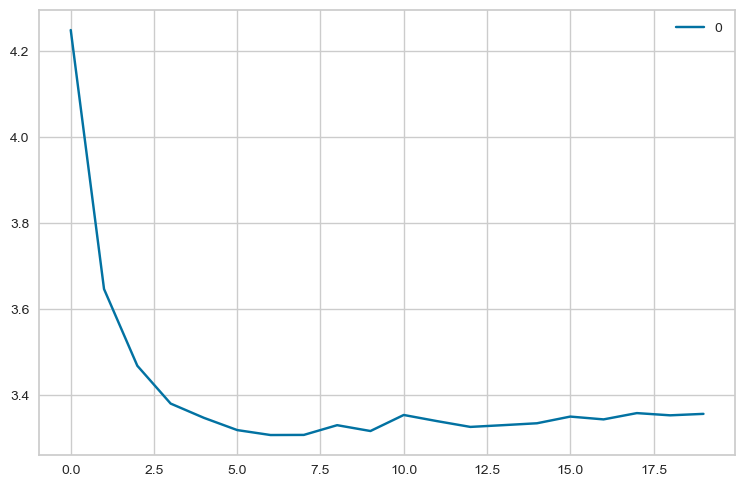

In [491]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()
# plt.xlim(1, 14)

In [492]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


reg = neighbors.KNeighborsRegressor(n_neighbors = K)
param_grid = {"n_neighbors": range(1, 20)}

from sklearn.model_selection import GridSearchCV
# verbose number a personal preference
grid_model = GridSearchCV(estimator=reg,
                          param_grid=param_grid,
                          cv=5,
                          verbose=2)

grid_result = grid_model.fit(X_train, y_train)
grid_result.best_params_

Fitting 5 folds for each of 19 candidates, totalling 95 fits
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=3; total time=   0.0s
[CV] END ......................................n

{'n_neighbors': 13}

In [493]:
grid_model.fit(X_train_scaled,y_train)

Fitting 5 folds for each of 19 candidates, totalling 95 fits
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=1; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=2; total time=   0.0s
[CV] END ......................................n_neighbors=3; total time=   0.0s
[CV] END ......................................n

GridSearchCV(cv=5, estimator=KNeighborsRegressor(n_neighbors=20),
             param_grid={'n_neighbors': range(1, 20)}, verbose=2)

In [494]:
grid_model.best_estimator_


KNeighborsRegressor(n_neighbors=14)

In [495]:
grid_model.best_params_

{'n_neighbors': 14}

In [496]:
reg = neighbors.KNeighborsRegressor(n_neighbors = 4)

In [497]:
reg.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=4)

In [498]:
test_predictions = reg.predict(X_test)
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [499]:
MAE

5.521255680828915

In [500]:
MSE

51.251975427291086

In [501]:
RMSE

7.159048500135412

## Decisiom tree 

In [502]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [503]:
from sklearn.tree import DecisionTreeRegressor 
  
# create a regressor object
regressor = DecisionTreeRegressor() 
  
# fit the regressor with X and Y data
regressor.fit(X, y)

DecisionTreeRegressor()

In [504]:
# Grid Search:
X = df.drop("intensity", axis=1)
y = df["intensity"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


reg = DecisionTreeRegressor() 
param_grid = {"criterion" : ["squared_error", "friedman_mse", "absolute_error", "poisson"],
             "max_depth" : [2,4,6,8,10,12]}

from sklearn.model_selection import GridSearchCV
# verbose number a personal preference
grid_model = GridSearchCV(estimator=reg,
                          param_grid=param_grid,
                          cv=5,
                          verbose=2)

grid_result = grid_model.fit(X_train, y_train)
grid_result.best_params_

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] END ...............criterion=squared_error, max_depth=2; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=2; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=2; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=2; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=2; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=4; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=4; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=4; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=4; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=4; total time=   0.0s
[CV] END ...............criterion=squared_error, max_depth=6; total time=   0.0s
[CV] END ...............criterion=squared_error

/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py", line 1315, in fit
    super().fit(
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/tree/_classes.py", line 178, in fit
    raise ValueError(
ValueError: Some value(s) of y are negative which is not allowed for Poisson re

{'criterion': 'absolute_error', 'max_depth': 4}

In [505]:
grid_model.best_params_

{'criterion': 'absolute_error', 'max_depth': 4}

In [506]:
reg = DecisionTreeRegressor(criterion="absolute_error", max_depth=4)

In [507]:
reg.fit(X_train, y_train)

DecisionTreeRegressor(criterion='absolute_error', max_depth=4)

In [508]:
test_predictions = reg.predict(X_test)
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [509]:
MAE

1.7524755167132586

In [510]:
MSE

8.46621091240181

In [511]:
RMSE

2.909675396397648

# Classification

## KNN

In [512]:
categorical_cols

['statement',
 'sex',
 'emotional_intensity',
 'repetition',
 'emotion',
 'vocal_channel']

In [513]:
# class_cols = ["frame_count", "sc_skew", "stft_skew", "repetition", 'emotional_intensity', "vocal_channel"] for vocal_channel

In [514]:
df.corr()["vocal_channel"].sort_values(ascending=False)

vocal_channel          1.000000
frame_count            0.724790
length_ms              0.724771
kmeans_labels          0.592616
sc_skew                0.535351
stft_skew              0.481279
stft_std               0.385434
intensity              0.291211
sc_kur                 0.221502
mfcc_min               0.179433
zero_crossings_sum     0.133524
std                    0.123588
mfcc_mean              0.036652
skew                   0.029126
max                    0.026629
mean                   0.025346
repetition             0.008864
statement             -0.005664
emotional_intensity   -0.010564
min                   -0.021518
sex                   -0.028086
sc_min                -0.043150
sc_max                -0.112402
stft_kur              -0.123545
sc_std                -0.125154
stft_min              -0.190507
emotion               -0.227154
mfcc_max              -0.256152
mfcc_std              -0.263475
stft_mean             -0.455390
sc_mean               -0.486255
kur     

In [515]:
df.corr()["sex"].nlargest(7)

sex                   1.000000
stft_std              0.580464
stft_skew             0.463453
zero_crossings_sum    0.387442
sc_max                0.202701
mfcc_min              0.124847
skew                  0.123203
Name: sex, dtype: float64

In [516]:
df.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_kur', 'stft_skew', 'mean',
       'std', 'min', 'max', 'kur', 'skew', 'kmeans_labels'],
      dtype='object')

In [517]:
# Let us consider "vocal_channel" variable as a target variable

In [518]:
# df.corr()["sex"]

In [519]:
class_cols = ["frame_count", "sc_skew", "stft_skew", "sex", "emotion", "vocal_channel"]

In [520]:
# class_cols1 = ["stft_std", "stft_skew", "sex"]

In [521]:
# sns.scatterplot(x="stft_std",y="stft_skew",hue="sex",data=df[class_cols1],alpha=0.7)

<AxesSubplot:xlabel='sc_skew', ylabel='frame_count'>

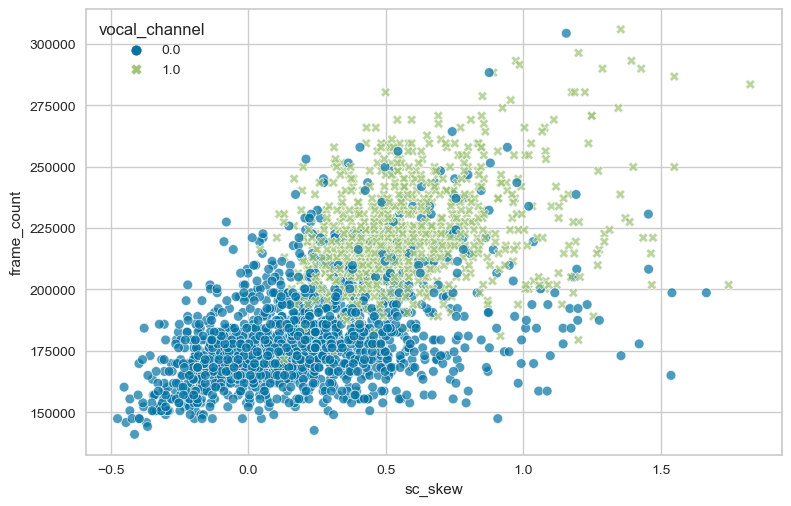

In [522]:
sns.scatterplot(x="sc_skew",y="frame_count",hue="vocal_channel",data=df[class_cols],alpha=0.7, style="vocal_channel")

In [523]:
# sns.pairplot(data = df, hue="vocal_channel")

In [524]:
# sns.pairplot(data = df[class_cols], hue="vocal_channel")

In [525]:
# Bimodal distributions as we have 2 classes

In [526]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [527]:
categorical_cols

['statement',
 'sex',
 'emotional_intensity',
 'repetition',
 'emotion',
 'vocal_channel']

In [528]:
class_cols

['frame_count', 'sc_skew', 'stft_skew', 'sex', 'emotion', 'vocal_channel']

In [529]:
df[class_cols]

,frame_count,sc_skew,stft_skew,sex,emotion,vocal_channel
0,179379.0,0.250940,0.403514,1,5,0.0
1,187387.0,0.219582,0.290905,1,4,0.0
2,224224.0,0.436699,0.470350,1,2,0.0
3,174575.0,0.098802,0.274756,1,7,0.0
4,211411.0,0.496066,0.318926,1,2,1.0
...,...,...,...,...,...,...
2447,221021.0,0.184390,-0.310088,0,1,0.0
2448,200200.0,-0.113920,-0.408018,0,1,0.0
2449,251451.0,0.619346,0.130310,0,3,1.0
2450,179379.0,0.206481,-0.242668,0,7,0.0


In [530]:
# Converting Categorical Attributes to Numeric Values

statement_map = {"Dogs are sitting by the door": 0, "Kids are talking by the door": 1}

emotional_intensity_map = {"normal": 0, "strong": 1}

emotion_map = {'neutral':0, 'calm':1, 'happy':2, 'sad':3, 'angry':4, 'fearful':5, 'disgust':6, 'surprised':7}

modality_map = {"audio-only": 0}

repetition_map = {"1st": 0, "2nd": 1}

vocal_channel_map = {"speech": 0, "song": 1}

sex_map = {"M": 0, "F": 1}

df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
            "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
           "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

In [531]:
X = df.drop("vocal_channel", axis=1)
y = df["vocal_channel"]

In [532]:
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [533]:
scaler = StandardScaler()

In [534]:
df.head()

,vocal_channel,emotion,emotional_intensity,statement,repetition,sex,length_ms,frame_count,intensity,zero_crossings_sum,...,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew,kmeans_labels
0,0.0,5,0,0,1,1,3737,179379.0,-36.793432,16995,...,0.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153,1
1,0.0,4,0,0,0,1,3904,187387.0,-36.663681,13906,...,0.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157,1
2,0.0,2,1,0,1,1,4671,224224.0,-32.290737,18723,...,0.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659,2
3,0.0,7,0,1,0,1,3637,174575.0,-49.019839,11617,...,0.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014,1
4,1.0,2,1,0,1,1,4404,211411.0,-31.214503,15137,...,0.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872,2


In [535]:
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [536]:
from sklearn.neighbors import KNeighborsClassifier

In [537]:
knn_model = KNeighborsClassifier(n_neighbors=1)

In [538]:
knn_model.fit(scaled_X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [539]:
# Understanding KNN and Choosing K Value


In [540]:
# Model Evaluation
y_pred = knn_model.predict(scaled_X_test)

In [541]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [542]:
accuracy_score(y_test,y_pred)

0.8925619834710744

In [543]:
confusion_matrix = confusion_matrix(y_test,y_pred)

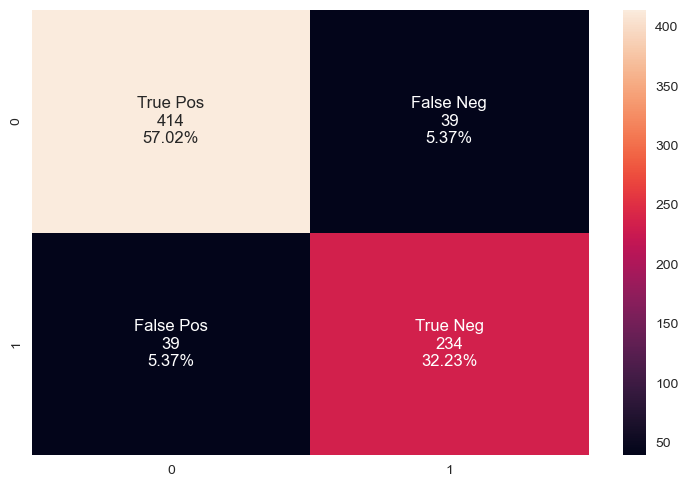

In [544]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [545]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91       453
         1.0       0.86      0.86      0.86       273

    accuracy                           0.89       726
   macro avg       0.89      0.89      0.89       726
weighted avg       0.89      0.89      0.89       726



In [546]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score   : ', accuracy_score(y_test, y_pred))
print('F1 Score         : ', f1_score(y_test, y_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(knn_model,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score  : ',abs(scores.mean()))


Accuracy Score   :  0.8925619834710744
F1 Score         :  0.8855250709555345
Recall Score     :  0.8855250709555345
Precession Score :  0.8855250709555345
Cross Val Score  :  0.15472034566715817


In [547]:
# Elbow Method for Choosing Reasonable K Values
test_error_rates = []


for k in range(1,30):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(scaled_X_train,y_train) 
   
    y_pred_test = knn_model.predict(scaled_X_test)
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    test_error_rates.append(test_error)

In [548]:
test_error_rates

[0.1074380165289256,
 0.1143250688705234,
 0.07713498622589532,
 0.07988980716253447,
 0.07851239669421484,
 0.07300275482093666,
 0.06887052341597799,
 0.07024793388429751,
 0.06887052341597799,
 0.07300275482093666,
 0.06749311294765836,
 0.0757575757575758,
 0.06887052341597799,
 0.07024793388429751,
 0.07024793388429751,
 0.07162534435261703,
 0.07300275482093666,
 0.07713498622589532,
 0.0757575757575758,
 0.07300275482093666,
 0.07713498622589532,
 0.07713498622589532,
 0.07713498622589532,
 0.07988980716253447,
 0.07988980716253447,
 0.08126721763085398,
 0.0826446280991735,
 0.08126721763085398,
 0.07851239669421484]

Text(0.5, 0, 'K Value')

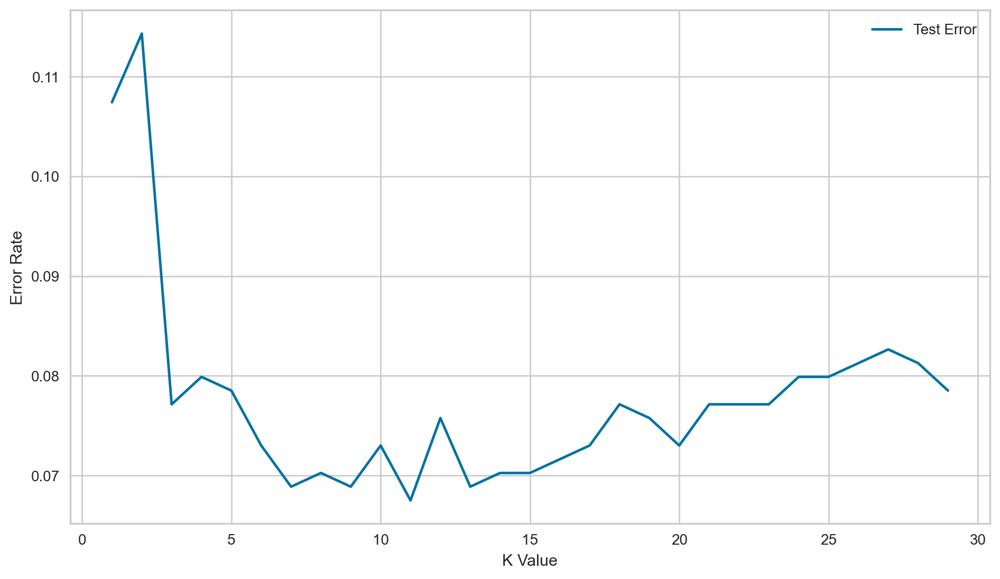

In [549]:
plt.figure(figsize=(10,6),dpi=200)
plt.plot(range(1,30),test_error_rates,label='Test Error')
plt.legend()
plt.ylabel('Error Rate')
plt.xlabel("K Value")
# plt.ylim(0.05, 0.07)
# plt.xlim(5,15)

In [550]:
# plt.figure(figsize=(10,6),dpi=200)
# plt.plot(range(1,30),test_error_rates,label='Test Error')
# plt.legend()
# plt.ylabel('Error Rate')
# plt.xlabel("K Value")
# plt.ylim(0.08, 0.10)
# plt.xlim(4, 10)

### Full Cross Validation Grid Search for K Value 

In [551]:
X = df.drop("vocal_channel", axis=1)
y = df["vocal_channel"]
# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [552]:
# Creating a Pipeline to find K value
scaler = StandardScaler()
knn = KNeighborsClassifier()

In [553]:
knn.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [554]:
# Highly recommend string code matches variable name!
operations = [('scaler',scaler),('knn',knn)]

In [555]:
from sklearn.pipeline import Pipeline
pipe = Pipeline(operations)

In [556]:
from sklearn.model_selection import GridSearchCV
k_values = list(range(1,30))

param_grid = {'knn__n_neighbors': k_values}

In [557]:
full_cv_classifier = GridSearchCV(pipe,param_grid,cv=5,scoring='accuracy')

In [558]:
# results = pd.DataFrame(full_cv_classifier.cv_results_)
# results.head()

In [559]:
# results.columns

In [560]:
# results["metric_weight"] = results["param_metric"] + " , " + results["param_weights"]

In [561]:
# Use full X and y if you DON'T want a hold-out test set
# Use X_train and y_train if you DO want a holdout test set (X_test,y_test)
full_cv_classifier.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             param_grid={'knn__n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                              12, 13, 14, 15, 16, 17, 18, 19,
                                              20, 21, 22, 23, 24, 25, 26, 27,
                                              28, 29]},
             scoring='accuracy')

In [562]:
full_cv_classifier.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=11))])

In [563]:
full_cv_classifier.best_estimator_.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()),
  ('knn', KNeighborsClassifier(n_neighbors=11))],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(n_neighbors=11),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 11,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [564]:
pd.DataFrame(full_cv_classifier.cv_results_).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_knn__n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.004062,0.000443,0.014440,0.000416,1,{'knn__n_neighbors': 1},0.905605,0.872781,0.902367,0.872781,0.866864,0.884080,0.016428,29
1,0.004944,0.000926,0.023792,0.006498,2,{'knn__n_neighbors': 2},0.905605,0.887574,0.896450,0.869822,0.878698,0.887630,0.012631,28
2,0.008164,0.000085,0.039403,0.003079,3,{'knn__n_neighbors': 3},0.935103,0.902367,0.923077,0.928994,0.911243,0.920157,0.011882,13
3,0.006484,0.001197,0.035089,0.005035,4,{'knn__n_neighbors': 4},0.943953,0.896450,0.917160,0.923077,0.920118,0.920152,0.015138,14
4,0.005580,0.000396,0.034180,0.001348,5,{'knn__n_neighbors': 5},0.958702,0.890533,0.926036,0.917160,0.917160,0.921918,0.021910,10


In [565]:
# len(k_values) We got the optimal hyperparameters after 29 runs k(0,30)

In [566]:
full_cv_classifier.cv_results_['mean_test_score']

array([0.88407952, 0.88762982, 0.92015674, 0.92015151, 0.92191793,
       0.92429352, 0.92665689, 0.9219284 , 0.9272521 , 0.92843553,
       0.93079367, 0.92429177, 0.92311358, 0.92074671, 0.92193015,
       0.92073973, 0.91837636, 0.9177829 , 0.92015151, 0.91600775,
       0.91778639, 0.91423435, 0.9148313 , 0.91364787, 0.9166047 ,
       0.91482781, 0.91778639, 0.91601299, 0.91719467])

def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                results['mean_test_score'][candidate],
                results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")
report(full_cv_classifier.cv_results_, 10)

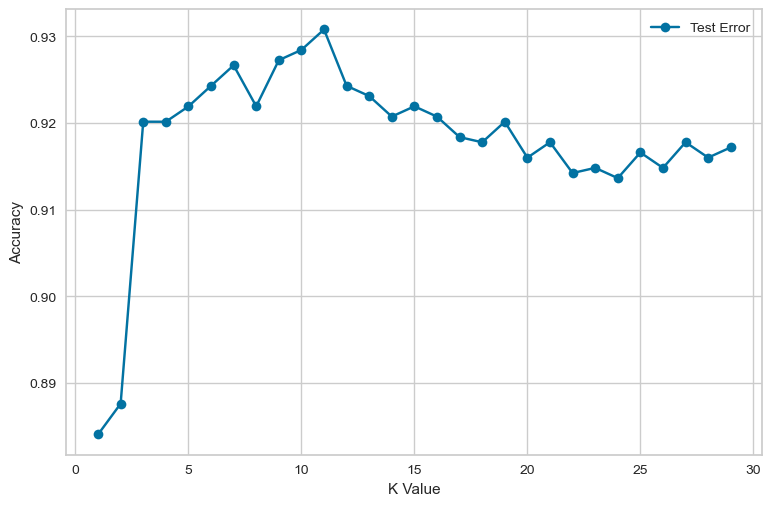

In [567]:
scores = full_cv_classifier.cv_results_['mean_test_score']
plt.plot(k_values,scores,'o-', label='Test Error')
plt.xlabel("K Value")
plt.ylabel("Accuracy")
plt.legend()

### Final Model
We just saw that our  GridSearch recommends a K=7 (in line with our 
alternative Elbow Method). Let's now use the PipeLine again, but this 
time, no need to do a grid search, instead we will evaluate on our 
hold-out Test Set.

In [568]:
# Creating a Pipeline to find K value
scaler = StandardScaler()
knn = KNeighborsClassifier(n_neighbors= 13)

In [569]:
# Highly recommend string code matches variable name!
operations = [('scaler',scaler),('knn',knn)]

In [570]:
from sklearn.pipeline import Pipeline
pipe = Pipeline(operations)

In [571]:
pipe.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=13))])

In [572]:
# Prediction
pipe_pred = pipe.predict(X_test)

In [573]:
# Classification Report
print(classification_report(y_test, pipe_pred))

              precision    recall  f1-score   support

         0.0       0.96      0.93      0.94       453
         1.0       0.89      0.93      0.91       273

    accuracy                           0.93       726
   macro avg       0.92      0.93      0.93       726
weighted avg       0.93      0.93      0.93       726



In [574]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    recall_score,
    precision_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, pipe_pred))
print('F1 Score       : ', f1_score(y_test, pipe_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, pipe_pred, average="macro"))
print("Precession Score : ", precision_score(y_test, pipe_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(pipe,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))

Accuracy Score :  0.931129476584022
F1 Score       :  0.9273302370275465
Recall Score     :  0.9317128787327462
Precession Score :  0.9237497321279754
Cross Val Score :  0.07198312815061213


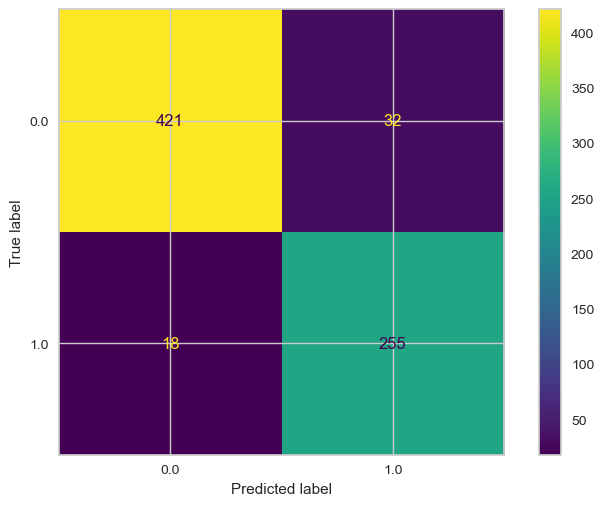

In [575]:
from sklearn.metrics import confusion_matrix,classification_report, ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(pipe, X_test, y_test)

In [576]:
confusion_matrix = confusion_matrix(y_test, pipe_pred)
confusion_matrix

array([[421,  32],
       [ 18, 255]])

In [577]:
len(pipe_pred)

726

<AxesSubplot:xlabel='sc_skew', ylabel='frame_count'>

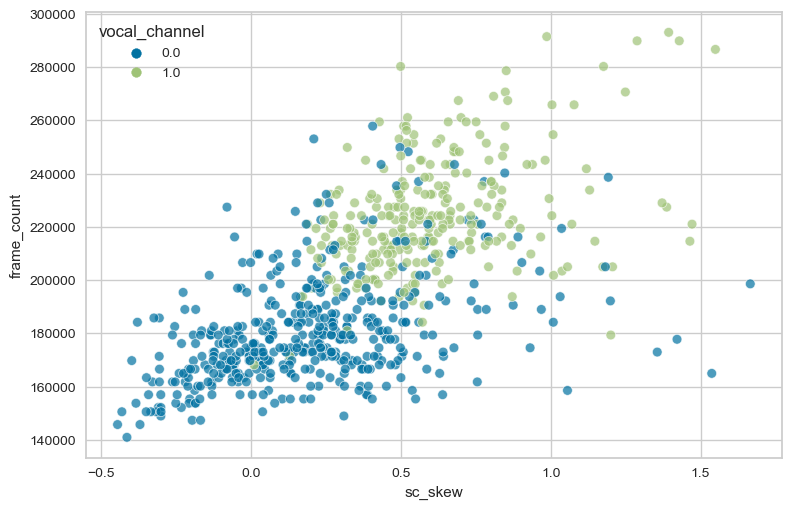

In [578]:
sns.scatterplot(x="sc_skew",y="frame_count",hue=y_test,data=X_test,alpha=0.7)

<AxesSubplot:xlabel='sc_skew', ylabel='frame_count'>

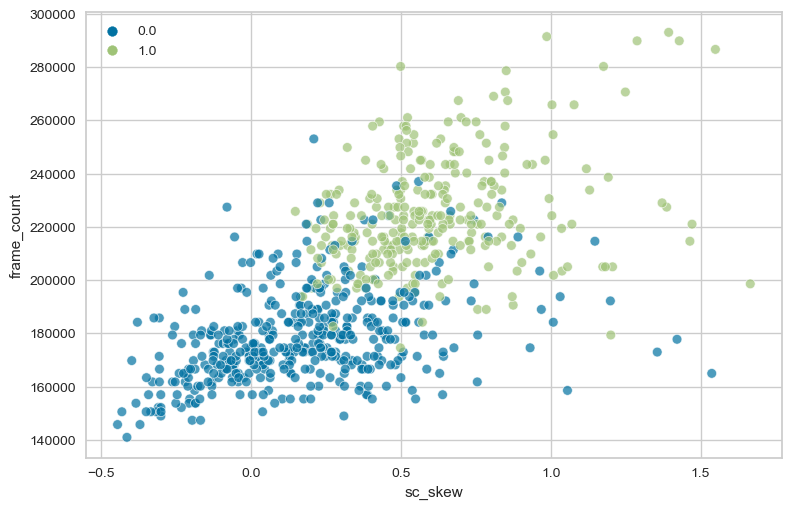

In [579]:
sns.scatterplot(x="sc_skew",y="frame_count",hue=pipe_pred,data=X_test,alpha=0.7)

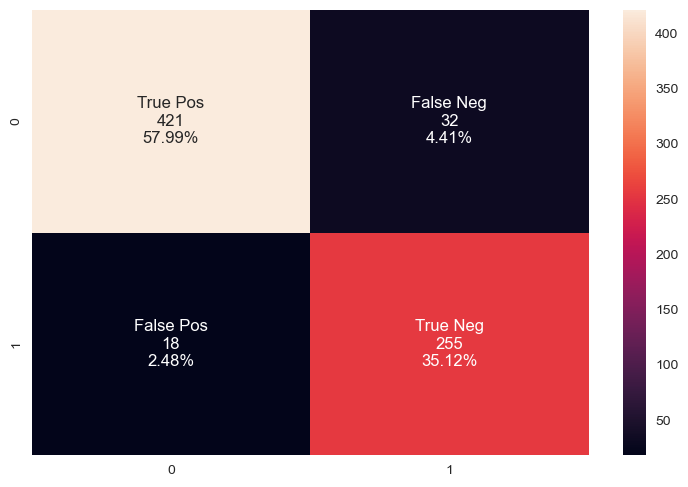

In [580]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [581]:
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(pipe,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
abs(scores.mean())

0.07198312815061213

In [582]:
# prediction of a record to belong to the positive class

y_score = pipe.predict_proba(X_test)
y_score[:6]

array([[0.46153846, 0.53846154],
       [1.        , 0.        ],
       [0.69230769, 0.30769231],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ]])

In [583]:
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

0.9751069386830976


<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

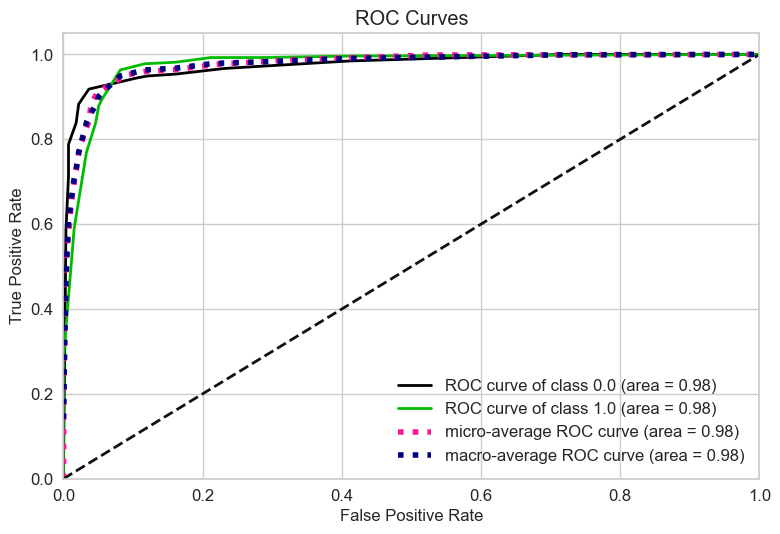

In [584]:
import scikitplot as skplt
skplt.metrics.plot_roc(y_test, y_score)

<AxesSubplot:title={'center':'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

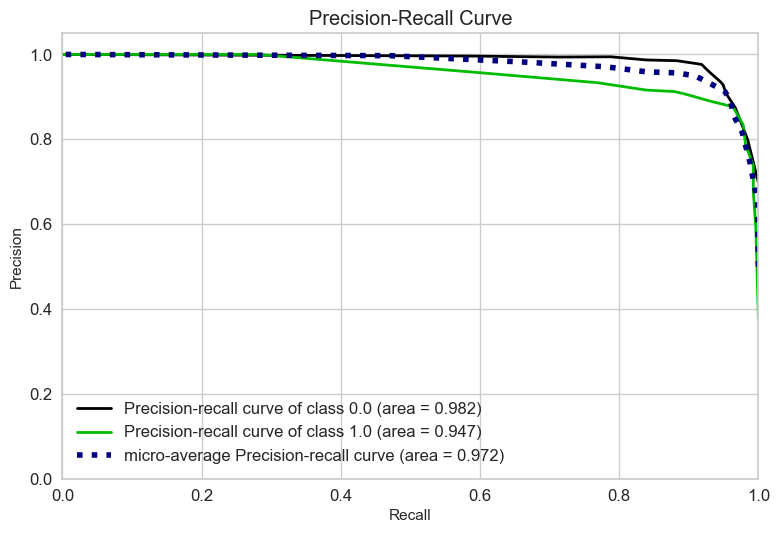

In [585]:
skplt.metrics.plot_precision_recall(y_test, y_score)

## Decision Tree

In [586]:
df[class_cols].head()

,frame_count,sc_skew,stft_skew,sex,emotion,vocal_channel
0,179379.0,0.250940,0.403514,1,5,0.0
1,187387.0,0.219582,0.290905,1,4,0.0
2,224224.0,0.436699,0.470350,1,2,0.0
3,174575.0,0.098802,0.274756,1,7,0.0
4,211411.0,0.496066,0.318926,1,2,1.0


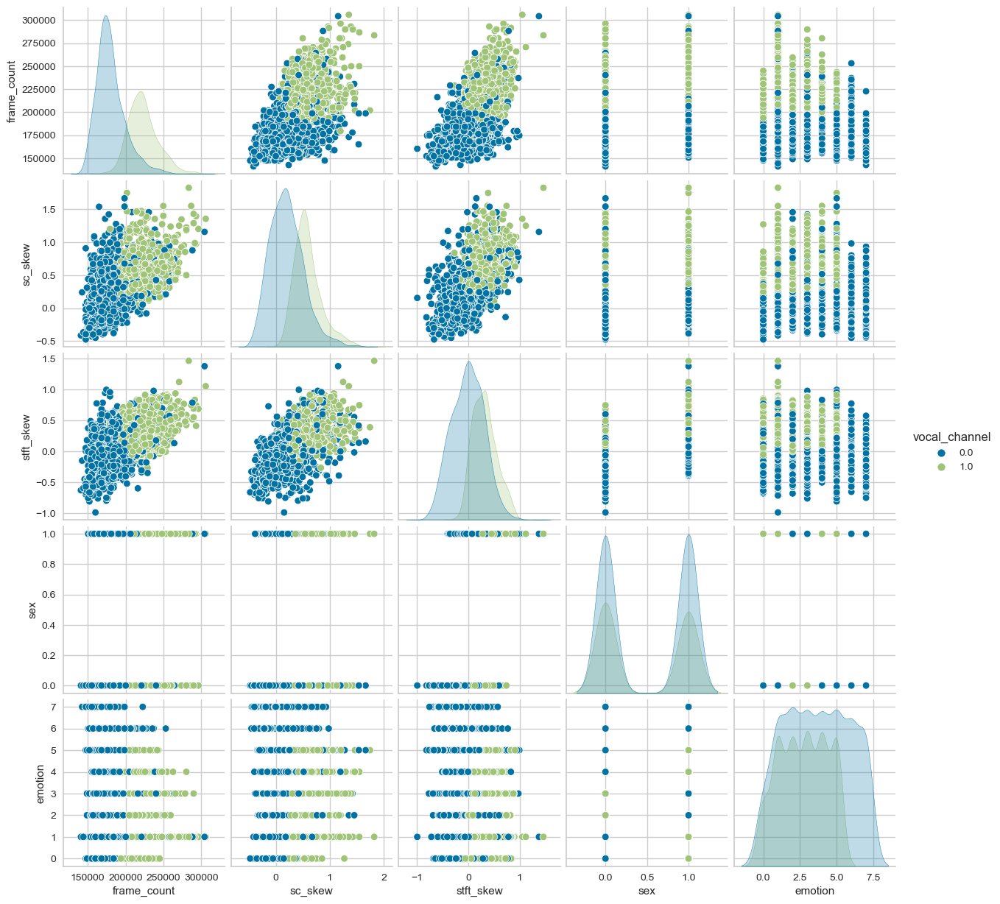

In [587]:
sns.pairplot(data = df[class_cols], hue="vocal_channel")

In [588]:
# df.drop("kmeans_labels", axis=1, inplace=True)

In [589]:
df_decision = df.copy()

In [590]:
vocal_channel_map = {0 : "speech", 1 : "song"}

# sex_map = {0 : "M", 1 : "F"}

df_decision.replace({"vocal_channel": vocal_channel_map}, inplace=True)

In [591]:
X = df.drop("vocal_channel", axis=1)
y = df["vocal_channel"]

# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [592]:
from sklearn.tree import DecisionTreeClassifier

In [593]:
model = DecisionTreeClassifier()
model.fit(X_train,y_train)
base_pred = model.predict(X_test)

In [594]:
# Evaluation

In [595]:
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
confusion_matrix = confusion_matrix(y_test,base_pred)

In [596]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
    precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, base_pred))
print('F1 Score       : ', f1_score(y_test, base_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, pipe_pred, average="macro"))
print("Precession Score : ", precision_score(y_test, pipe_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(pipe,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))

Accuracy Score :  0.9146005509641874
F1 Score       :  0.9091386215360765
Recall Score     :  0.9317128787327462
Precession Score :  0.9237497321279754
Cross Val Score :  0.07198312815061213


In [597]:
print(classification_report(y_test,base_pred))

              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93       453
         1.0       0.88      0.89      0.89       273

    accuracy                           0.91       726
   macro avg       0.91      0.91      0.91       726
weighted avg       0.91      0.91      0.91       726



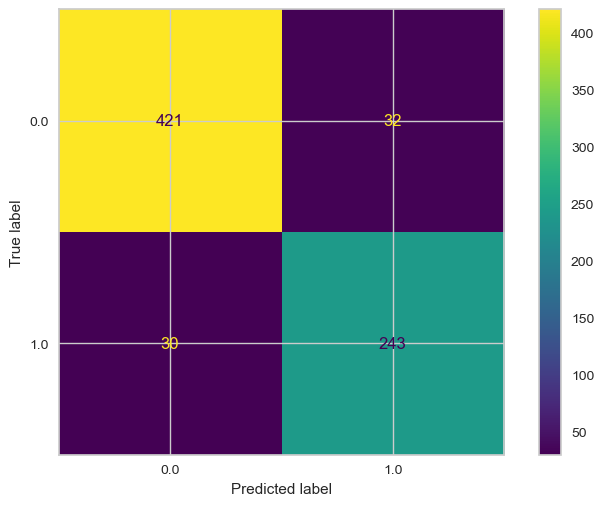

In [598]:
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)

In [599]:
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
confusion_matrix = confusion_matrix(y_test,base_pred)

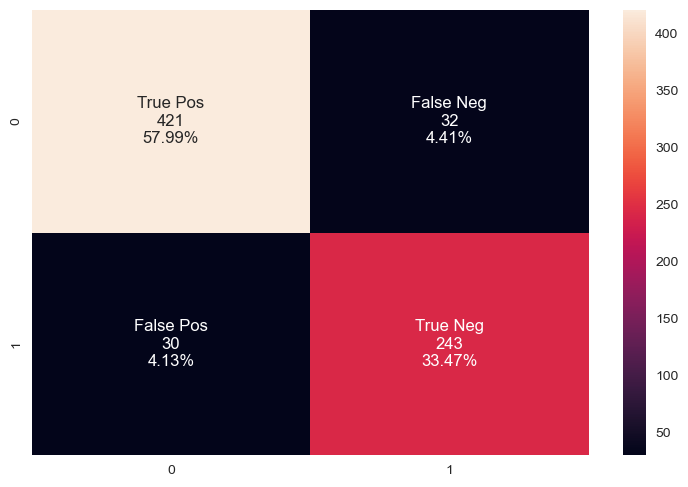

In [600]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [601]:
from sklearn.model_selection import GridSearchCV
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]

param_grid = {'criterion': criterion,
             "max_depth" : max_depth
             }

In [602]:
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='accuracy',
                          cv=5)

In [603]:
grid_model.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12]},
             scoring='accuracy')

In [604]:
grid_model.best_estimator_

DecisionTreeClassifier(max_depth=6)

In [605]:
grid_model.best_estimator_.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 6,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [606]:
# Retrain model on best Hyperparameters
model = DecisionTreeClassifier(criterion='gini', max_depth=4)
model.fit(X_train,y_train)
base_pred = model.predict(X_test)

In [607]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
    precision_score
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, base_pred))
print('F1 Score       : ', f1_score(y_test, base_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, pipe_pred, average="macro"))
print("Precession Score : ", precision_score(y_test, pipe_pred, average="macro"))

from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(model,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))

Accuracy Score :  0.9325068870523416
F1 Score       :  0.9288307915758895
Recall Score     :  0.9317128787327462
Precession Score :  0.9237497321279754
Cross Val Score :  0.08025616405473063


In [608]:
# Evaluation
from sklearn.metrics import confusion_matrix,classification_report, ConfusionMatrixDisplay
confusion_matrix = confusion_matrix(y_test,base_pred)
confusion_matrix

array([[421,  32],
       [ 17, 256]])

In [609]:
print(classification_report(y_test,base_pred))

              precision    recall  f1-score   support

         0.0       0.96      0.93      0.95       453
         1.0       0.89      0.94      0.91       273

    accuracy                           0.93       726
   macro avg       0.93      0.93      0.93       726
weighted avg       0.93      0.93      0.93       726



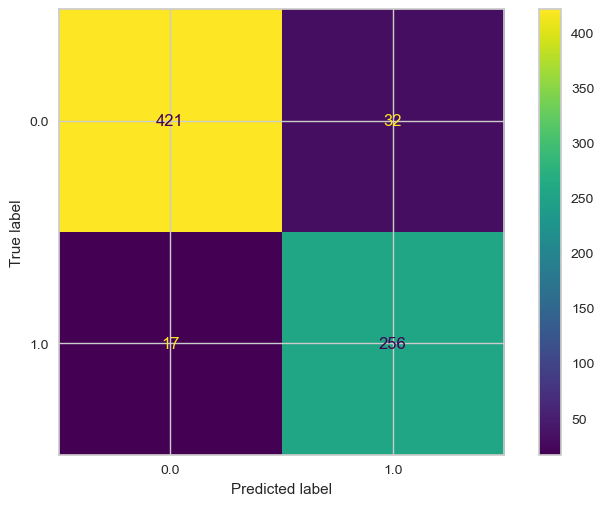

In [610]:
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)

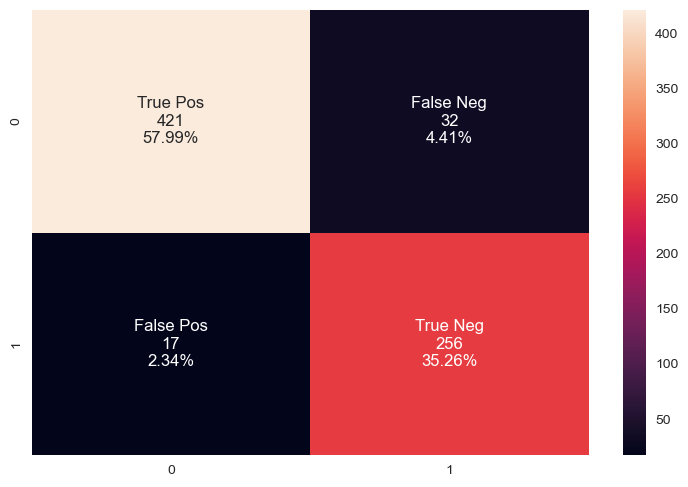

In [611]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [612]:
model.feature_importances_

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.07385355, 0.00837241, 0.        , 0.        ,
       0.        , 0.        , 0.001972  , 0.03110438, 0.00151692,
       0.        , 0.        , 0.00475807, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.02054622, 0.        , 0.04455952, 0.        , 0.        ,
       0.81331692])

In [613]:
len(model.feature_importances_)

31

In [614]:

count = 0
for x in model.feature_importances_:
    if x == 0:
        count += 1
print(31 - count)

9


In [615]:
pd.DataFrame(index=X.columns,data=model.feature_importances_,columns=['Feature Importance']).sort_values('Feature Importance')

,Feature Importance
emotion,0.000000
kur,0.000000
min,0.000000
mean,0.000000
stft_skew,0.000000
stft_kur,0.000000
stft_min,0.000000
stft_std,0.000000
stft_mean,0.000000
sc_skew,0.000000


In [616]:
# Visualize the Tree
from sklearn.tree import plot_tree


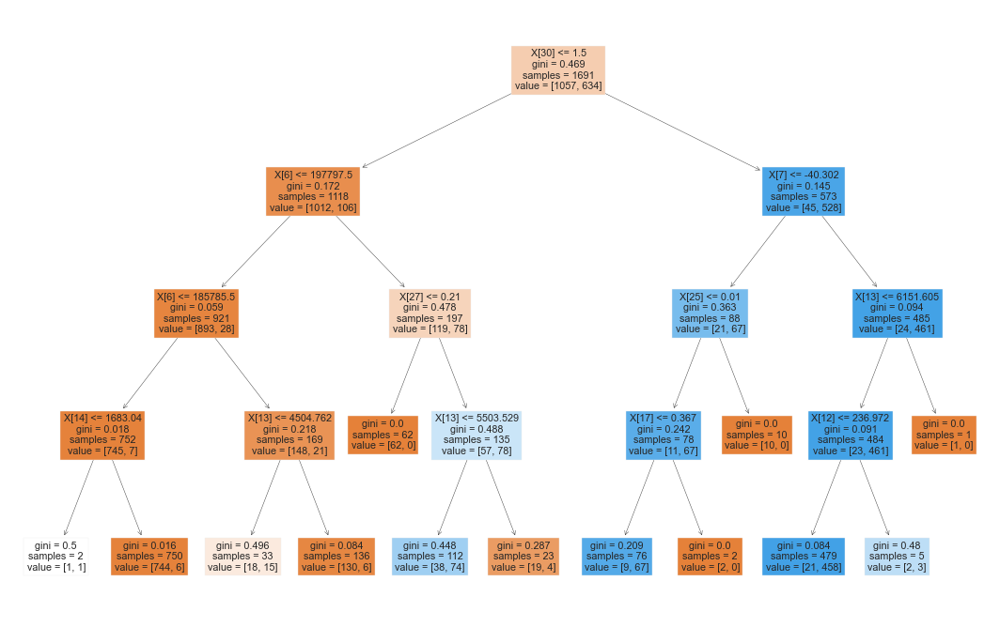

In [617]:
plt.figure(figsize=(12,8))
plot_tree(model, filled=True,);

In [618]:
df[class_cols].head()

,frame_count,sc_skew,stft_skew,sex,emotion,vocal_channel
0,179379.0,0.250940,0.403514,1,5,0.0
1,187387.0,0.219582,0.290905,1,4,0.0
2,224224.0,0.436699,0.470350,1,2,0.0
3,174575.0,0.098802,0.274756,1,7,0.0
4,211411.0,0.496066,0.318926,1,2,1.0


In [619]:
len(X_train)

1691

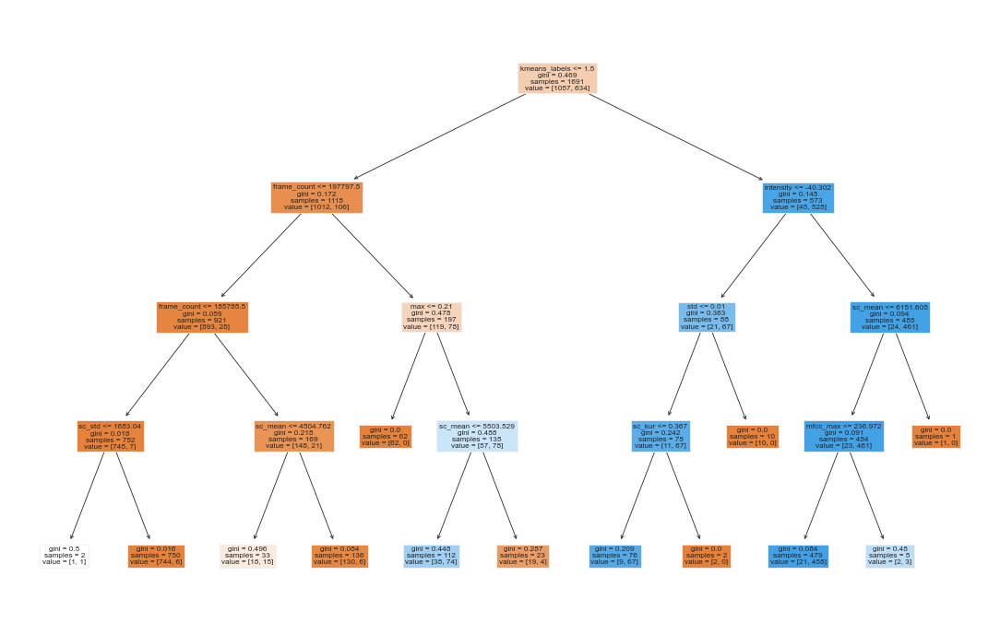

In [620]:
plt.figure(figsize=(6,4),dpi=200)
plot_tree(model,filled=True,feature_names=X.columns);

In [621]:
# Hold-out
from sklearn.model_selection import train_test_split

# Decision Tree
from sklearn.tree import DecisionTreeClassifier #!!!
# Optional: KNN
from sklearn.neighbors import KNeighborsClassifier #!!!

##### Decision Tree Visualization ###
from sklearn import tree # export_graphviz() method
import pydotplus # viz stuff
from IPython.display import Image # viz stuff
####################################

######## Evaluation #######
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
# Optional: baseline comparison
from sklearn.dummy import DummyClassifier
###########################

# hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

# cross-validation
from sklearn.model_selection import cross_val_score

from sklearn.naive_bayes import GaussianNB


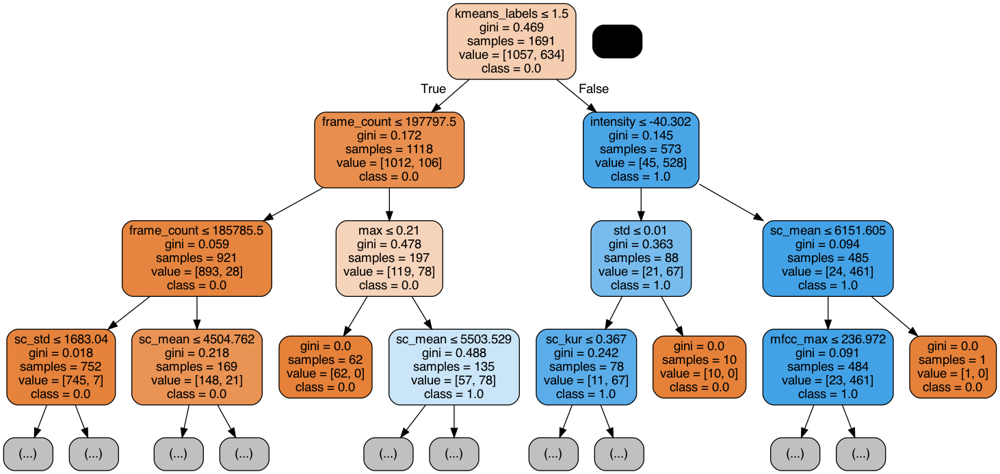

In [623]:
# features_name = nomi delle variabili
# max_depth = livelli visualizzati

dot_data = tree.export_graphviz (model, out_file=None,
                                 feature_names=X.columns,
                                 class_names=[str(v) for v in model.classes_],
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 max_depth=3)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())


In [624]:
# attributes = ['frame_count', 'sc_skew', 'stft_skew', 'sex', 'emotion']

In [626]:
# Reporting Model Results
def report_model(model):
    model_preds = model.predict(X_test)
    print(classification_report(y_test,model_preds))
    print('\n')
    plt.figure(figsize=(12,8),dpi=150)
    plot_tree(model,filled=True,feature_names=X.columns);

In [627]:
print(accuracy_score(y_test, base_pred))
print(f1_score(y_test, base_pred, average="macro"))

0.9325068870523416
0.9288307915758895


In [628]:
len(y_score)

726

In [629]:
# prediction of a record to belong to the positive class

y_score = model.predict_proba(X_test)
y_score[:6]

array([[1.   , 0.   ],
       [0.992, 0.008],
       [0.992, 0.008],
       [0.992, 0.008],
       [0.992, 0.008],
       [1.   , 0.   ]])

<AxesSubplot:xlabel='sc_skew', ylabel='frame_count'>

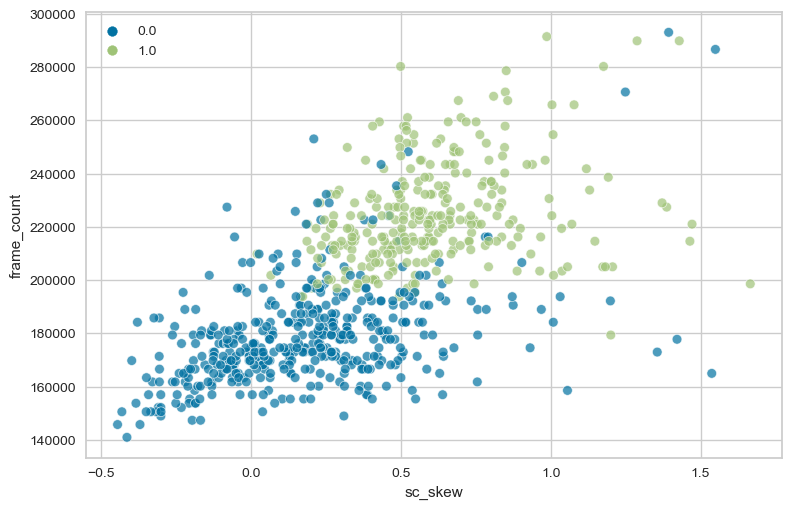

In [630]:
sns.scatterplot(x="sc_skew",y="frame_count",hue=base_pred,data=X_test,alpha=0.7)

In [631]:
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

0.9631880261019333


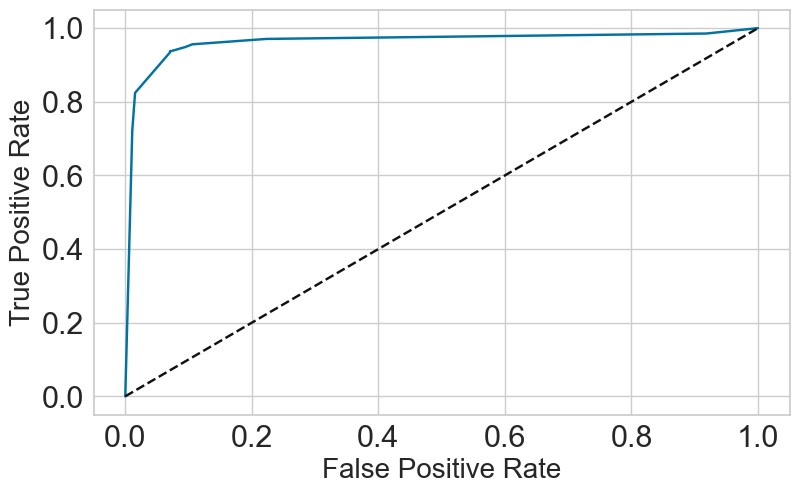

In [632]:
plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)

In [633]:
# prediction of a record to belong to the positive class

y_score = model.predict_proba(X_test)
y_score[:6]

array([[1.   , 0.   ],
       [0.992, 0.008],
       [0.992, 0.008],
       [0.992, 0.008],
       [0.992, 0.008],
       [1.   , 0.   ]])

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

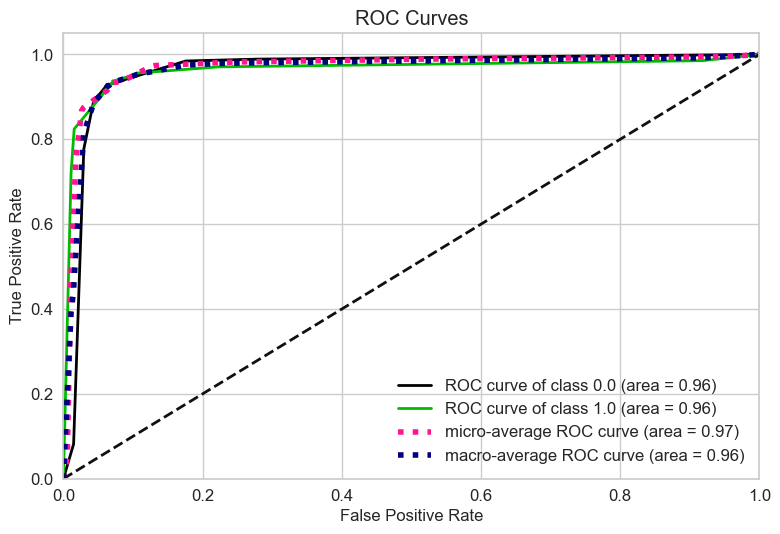

In [634]:
import scikitplot as skplt
skplt.metrics.plot_roc(y_test, y_score)

<AxesSubplot:title={'center':'Precision-Recall Curve'}, xlabel='Recall', ylabel='Precision'>

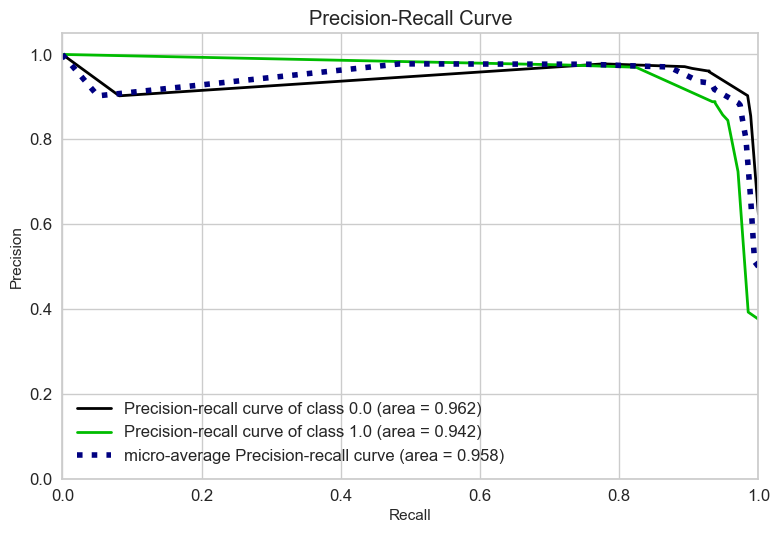

In [635]:
skplt.metrics.plot_precision_recall(y_test, y_score)

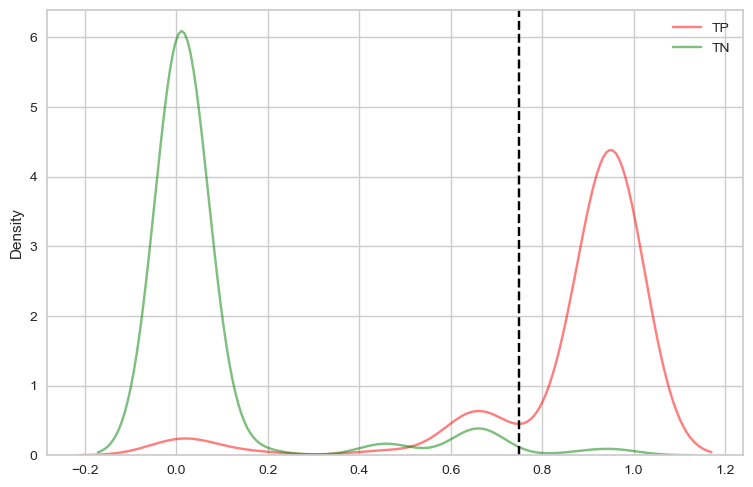

In [636]:
#  KDEPLOTS just for understanding how a threshold work:
# green line to the right of the threshold are FPs
# red line to the left of the threshold are FNs

sns.kdeplot(y_score[:,1][y_test == 1], alpha=0.5, color='red', label='TP')
sns.kdeplot(y_score[:,1][y_test == 0], alpha=0.5, color='green', label='TN')

# example
threshold = 0.75
plt.axvline(threshold, c='black', ls='dashed')

plt.legend()

In [637]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

In [638]:
plt.show()

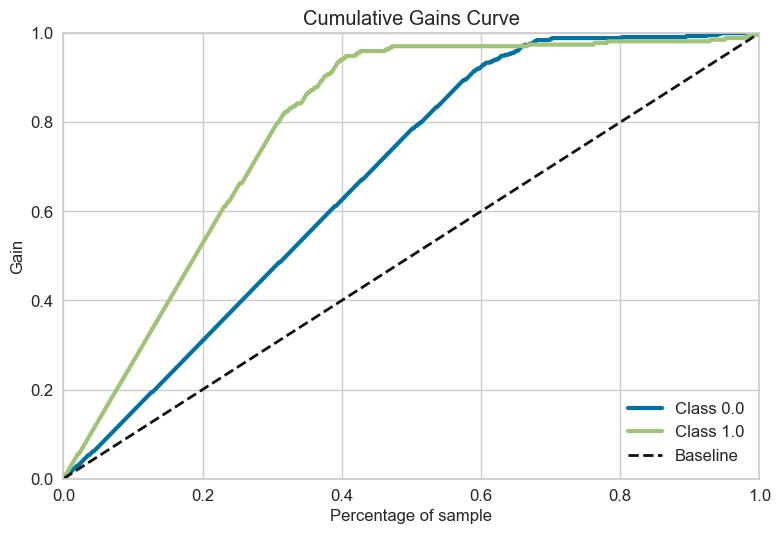

In [639]:
plot_cumulative_gain(y_test, y_score)
plt.show()

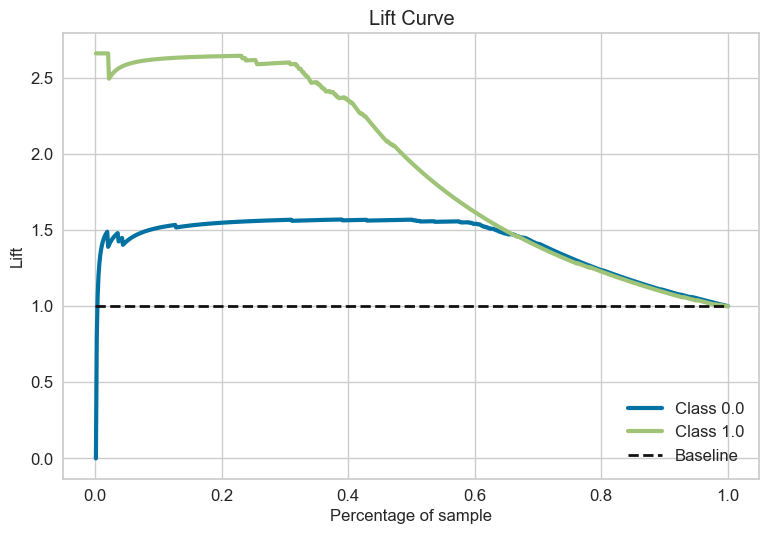

In [640]:
plot_lift_curve(y_test, y_score)
plt.show()

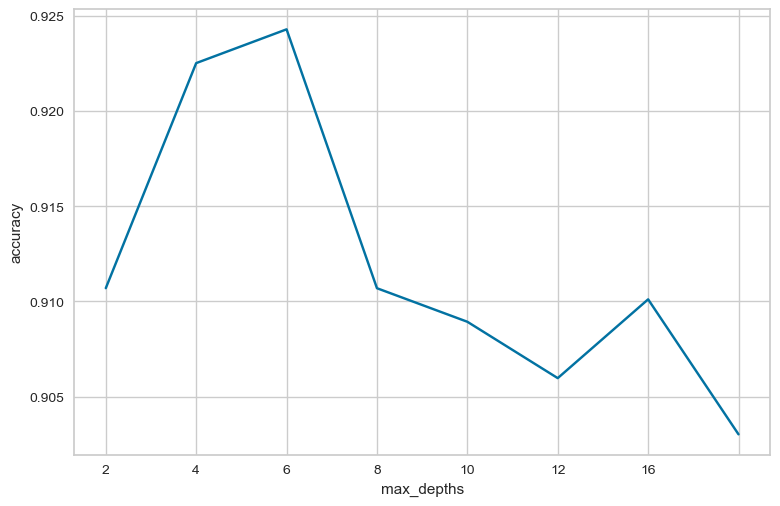

In [641]:
max_depths = [2, 4, 6, 8, 10, 12, 16, None]
scores = list()
for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores.append(cross_val_score(dt, X_train, y_train, cv=5).mean())
plt.plot(scores)
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

## Random Forest

In [642]:
# Random Forest
X = df.drop("vocal_channel", axis=1)
y = df["vocal_channel"]

# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [643]:
from sklearn.ensemble import RandomForestClassifier

In [644]:
# Use 10 random trees
model = RandomForestClassifier(bootstrap= False, max_features=3, n_estimators=100)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)

In [645]:
# Evaluation
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix,accuracy_score

In [646]:
confusion_matrix = confusion_matrix(y_test,y_pred)

In [647]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(model,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))


Accuracy Score :  0.9517906336088154
Precession Score :  0.946804932735426
Recall Score     :  0.9511801664119545
F1 Score       :  0.9488883569648414
Cross Val Score :  0.055855423339391655


In [648]:
confusion_matrix = confusion_matrix(y_test,y_pred)

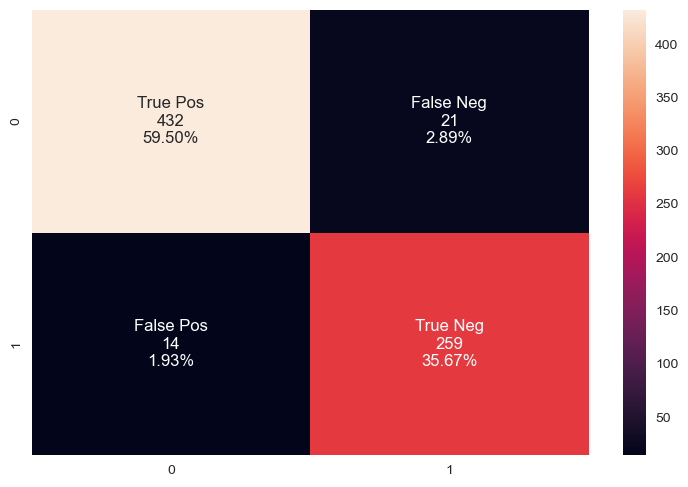

In [649]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [650]:
# Feature Importance
model.feature_importances_

array([0.02606504, 0.00262851, 0.00135916, 0.00166794, 0.00479004,
       0.15191908, 0.09874846, 0.03704975, 0.01313141, 0.01249841,
       0.0219575 , 0.0142442 , 0.01394929, 0.04406218, 0.0136624 ,
       0.00957121, 0.01000765, 0.01431433, 0.0659619 , 0.04092525,
       0.02423977, 0.01353937, 0.01334712, 0.02707537, 0.01025734,
       0.0216345 , 0.0168549 , 0.0152045 , 0.07401553, 0.00969531,
       0.17562258])

In [651]:
# Choosing correct number of trees
test_error = []

for n in range(1,40):
    # Use n random trees
    model = RandomForestClassifier(n_estimators=n,max_features='auto')
    model.fit(X_train,y_train)
    test_preds = model.predict(X_test)
    test_error.append(1-accuracy_score(test_preds,y_test))
 

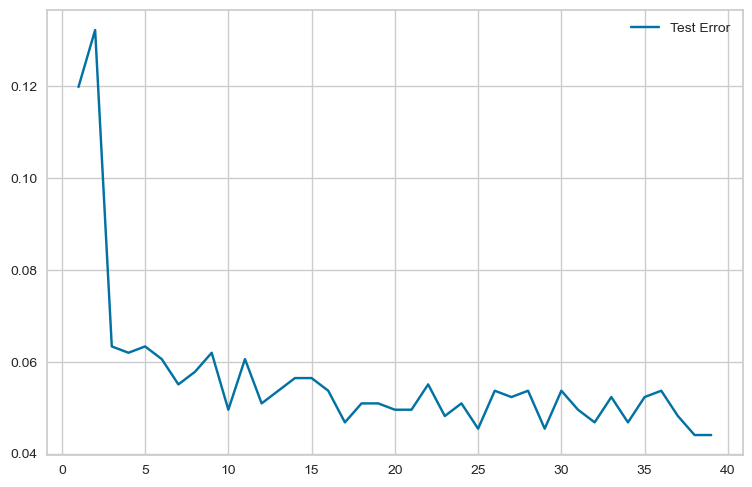

In [652]:
plt.plot(range(1,40),test_error,label='Test Error')
# plt.xlim(0, 5)
plt.legend()

Clearly there are diminishing returns, on such a small dataset, we've pretty much extracted all the information we can after about 3 trees.

In [653]:
# Random Forest - HyperParameter Exploration
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=101)

In [654]:
from sklearn.model_selection import GridSearchCV
n_estimators=[64,100,128,200]
max_features= [2,3,4]
bootstrap = [True,False]

In [655]:
param_grid = {'n_estimators':n_estimators,
             'max_features':max_features,
             'bootstrap':bootstrap}  # Note, oob_score only makes sense when bootstrap=True!

In [656]:
rfc = RandomForestClassifier()
grid = GridSearchCV(rfc,param_grid)

In [657]:
grid.fit(X_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False], 'max_features': [2, 3, 4],
                         'n_estimators': [64, 100, 128, 200]})

In [658]:
grid.best_params_

{'bootstrap': False, 'max_features': 4, 'n_estimators': 64}

In [659]:
predictions = grid.predict(X_test)

In [660]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       229
         1.0       0.93      0.93      0.93       134

    accuracy                           0.95       363
   macro avg       0.94      0.94      0.94       363
weighted avg       0.95      0.95      0.95       363



In [661]:
len(y_test)

363

In [662]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)

In [663]:
confusion_matrix = confusion_matrix(y_test,predictions)

In [664]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, predictions))
print('F1 Score       : ', f1_score(y_test, predictions, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(rfc,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))

Accuracy Score :  0.9476584022038568
F1 Score       :  0.9437223078994394
Cross Val Score :  0.0575014574260142


In [665]:
# plot_confusion_matrix(grid,X_test,y_test)

In [666]:
# # No underscore, reports back original oob_score parameter
# grid.best_estimator_.oob_score

In [667]:
# With underscore, reports back fitted attribute of oob_score
# grid.best_estimator_.oob_score_

In [668]:
confusion_matrix = confusion_matrix(y_test,predictions)

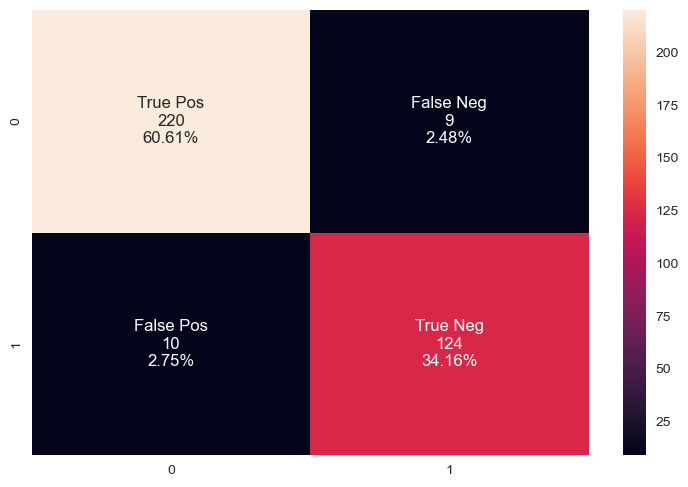

In [669]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [670]:
# Understanding Number of Estimators (Trees)
from sklearn.metrics import accuracy_score

In [671]:
errors = []
misclassifications = []

for n in range(1,200):
    rfc = RandomForestClassifier( n_estimators=n,bootstrap=True,max_features= 2)
    rfc.fit(X_train,y_train)
    preds = rfc.predict(X_test)
    err = 1 - accuracy_score(preds,y_test)
    n_missed = np.sum(preds != y_test) # watch the video to understand this line!!
    errors.append(err)
    misclassifications.append(n_missed)

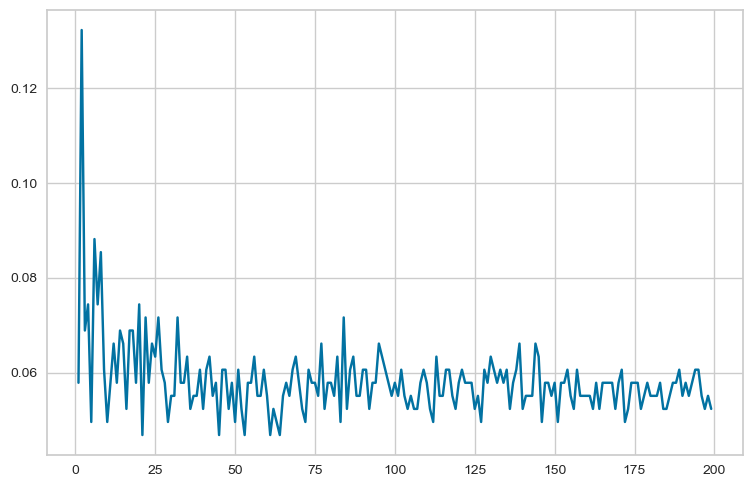

In [672]:
plt.plot(range(1,200),errors)

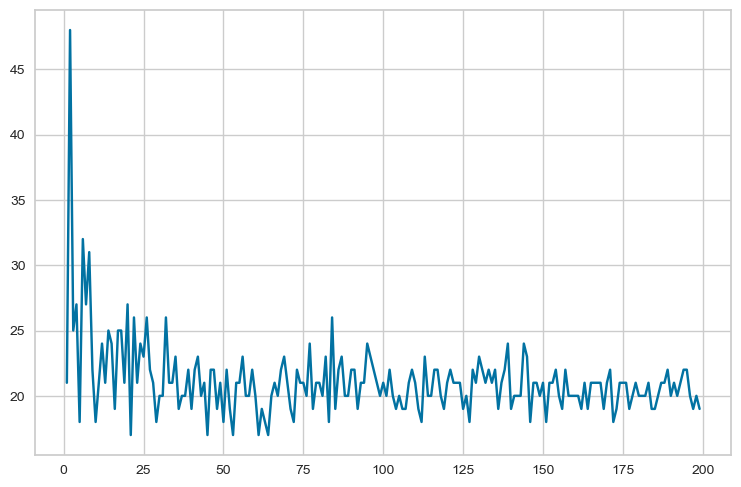

In [673]:
plt.plot(range(1,200),misclassifications)

In [674]:
# prediction of a record to belong to the positive class

y_score = model.predict_proba(X_test)
y_score[:6]

array([[1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.94871795, 0.05128205],
       [1.        , 0.        ],
       [1.        , 0.        ]])

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

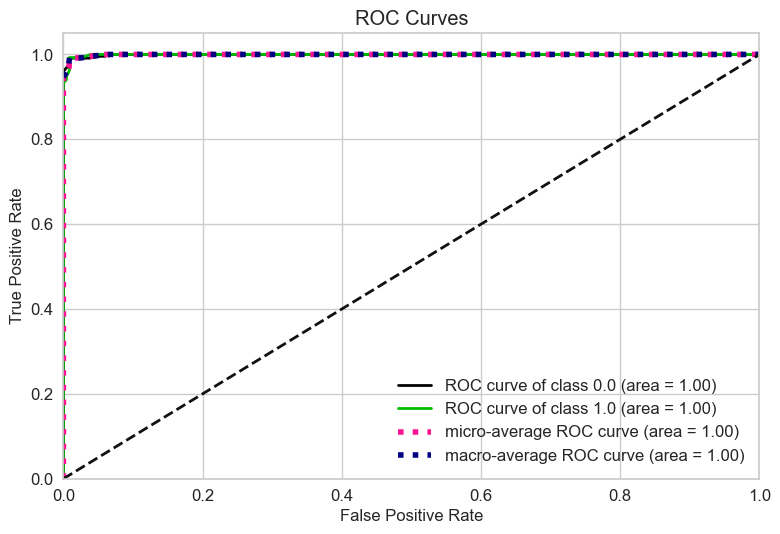

In [675]:
import scikitplot as skplt
skplt.metrics.plot_roc(y_test, y_score)

## Naives Bayes

## Gaussian NB

In [676]:
from sklearn.naive_bayes import GaussianNB, CategoricalNB
clf = GaussianNB(var_smoothing=1.2328467394420635e-09)

In [677]:
clf.fit(X_train, y_train)

GaussianNB(var_smoothing=1.2328467394420635e-09)

In [678]:
# clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
# print(classification_report(y_test, y_pred))

In [679]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.94      0.93      0.94       229
         1.0       0.88      0.90      0.89       134

    accuracy                           0.92       363
   macro avg       0.91      0.92      0.91       363
weighted avg       0.92      0.92      0.92       363



In [680]:
clf.predict_proba(X_test)

array([[9.98553738e-01, 1.44626191e-03],
       [1.00000000e+00, 3.92320783e-10],
       [9.98661674e-01, 1.33832566e-03],
       [9.58205993e-01, 4.17940071e-02],
       [1.00000000e+00, 2.34317000e-15],
       [9.99946568e-01, 5.34323861e-05],
       [9.99718186e-01, 2.81813790e-04],
       [1.10118350e-05, 9.99988988e-01],
       [4.80873294e-02, 9.51912671e-01],
       [9.99999341e-01, 6.58641600e-07],
       [9.99854671e-01, 1.45329339e-04],
       [9.94673622e-02, 9.00532638e-01],
       [9.99999982e-01, 1.84916540e-08],
       [8.78622464e-01, 1.21377536e-01],
       [5.78486565e-04, 9.99421513e-01],
       [9.97098160e-01, 2.90183992e-03],
       [9.99989280e-01, 1.07196197e-05],
       [1.00000000e+00, 7.41652134e-21],
       [8.88410767e-03, 9.91115892e-01],
       [9.99998595e-01, 1.40491508e-06],
       [9.99803674e-01, 1.96326298e-04],
       [1.07345953e-01, 8.92654047e-01],
       [5.15256838e-09, 9.99999995e-01],
       [9.97896838e-01, 2.10316204e-03],
       [9.999914

In [681]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")
from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")
from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")
from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[213  16]
 [ 13 121]] : is the confusion matrix
0.9201101928374655 : is the accuracy score
0.8832116788321168 : is the precision score
0.9029850746268657 : is the recall score
0.8929889298892989 : is the f1 score


In [682]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(clf,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))


Accuracy Score :  0.9201101928374655
F1 Score       :  0.9146263330765176
Cross Val Score :  0.09060388875552965
Recall Score     :  0.9165580394968389
Precession Score :  0.9128447774691557


In [683]:
# prediction of a record to belong to the positive class

y_score = clf.predict_proba(X_test)
y_score[:6]

array([[9.98553738e-01, 1.44626191e-03],
       [1.00000000e+00, 3.92320783e-10],
       [9.98661674e-01, 1.33832566e-03],
       [9.58205993e-01, 4.17940071e-02],
       [1.00000000e+00, 2.34317000e-15],
       [9.99946568e-01, 5.34323861e-05]])

In [684]:
confusion_matrix = confusion_matrix(y_test, y_pred)

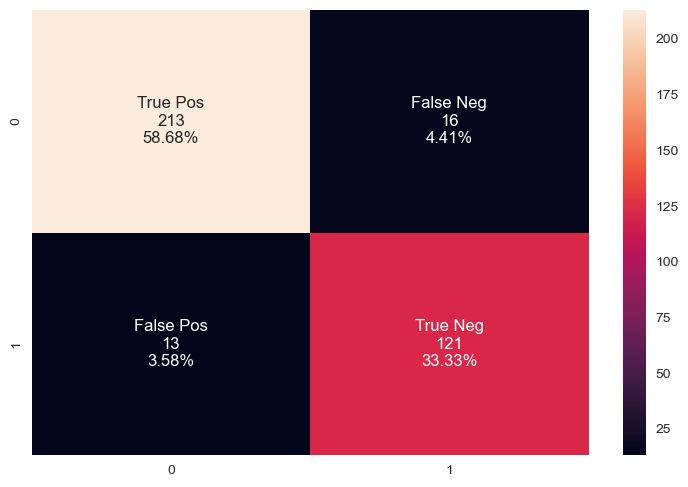

In [685]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [686]:
# prediction of a record to belong to the positive class

y_score = clf.predict_proba(X_test)
y_score[:6]

array([[9.98553738e-01, 1.44626191e-03],
       [1.00000000e+00, 3.92320783e-10],
       [9.98661674e-01, 1.33832566e-03],
       [9.58205993e-01, 4.17940071e-02],
       [1.00000000e+00, 2.34317000e-15],
       [9.99946568e-01, 5.34323861e-05]])

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

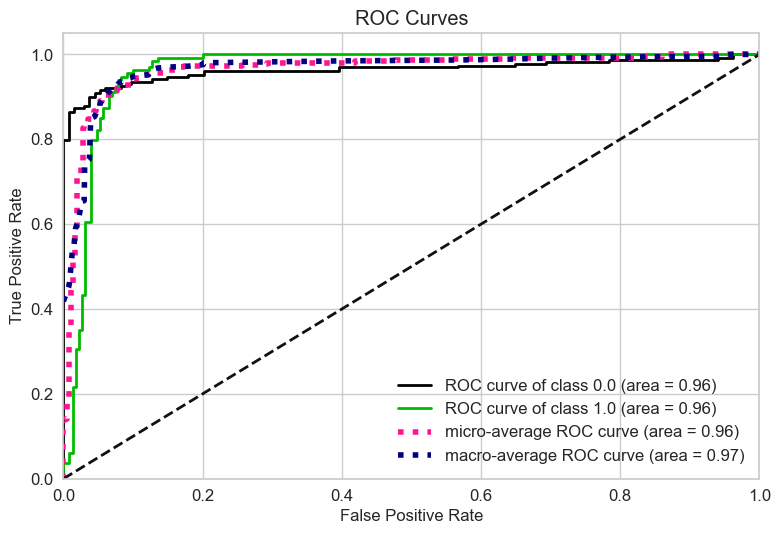

In [687]:
import scikitplot as skplt
skplt.metrics.plot_roc(y_test, y_score)

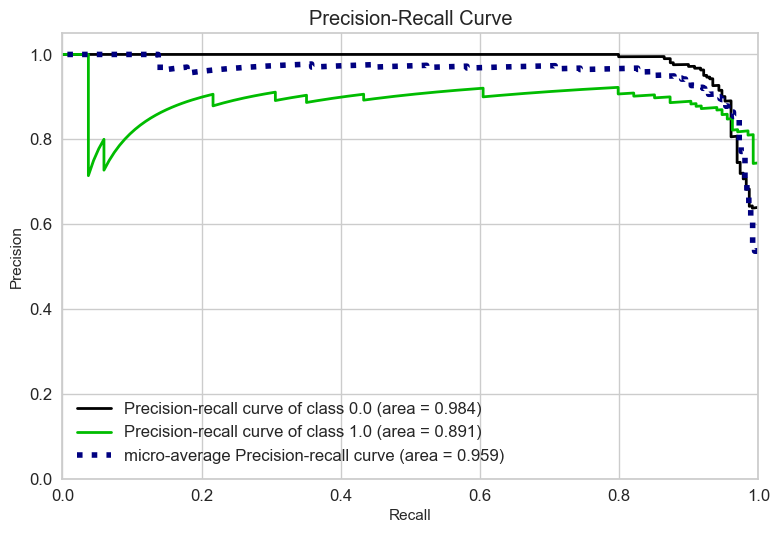

In [688]:
plot_precision_recall(y_test, clf.predict_proba(X_test))
plt.show()

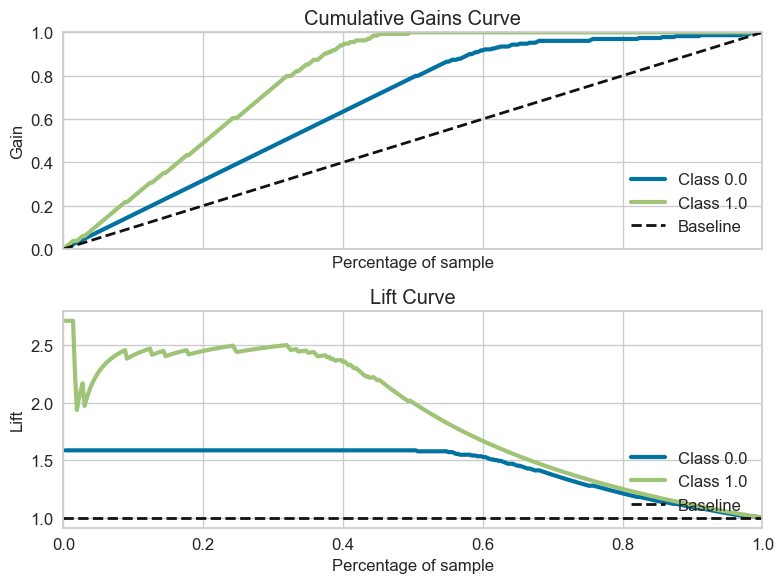

In [689]:
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(8,6))
plot_cumulative_gain(y_test, clf.predict_proba(X_test), ax=axs[0])
plot_lift_curve(y_test, clf.predict_proba(X_test), ax=axs[1])
plt.tight_layout()
plt.show()

In [690]:
param_grid_nb = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

In [691]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
nbModel_grid = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1)
nbModel_grid.fit(X_train, y_train)
print(nbModel_grid.best_estimator_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
GaussianNB()


In [692]:
y_pred = nbModel_grid.predict(X_test)


In [693]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(clf,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))


Accuracy Score :  0.9201101928374655
F1 Score       :  0.9146263330765176
Cross Val Score :  0.09060388875552965
Recall Score     :  0.9165580394968389
Precession Score :  0.9128447774691557


In [694]:
nbModel_grid.best_estimator_.get_params()

{'priors': None, 'var_smoothing': 1e-09}

In [695]:
confusion_matrix(y_test, y_pred)

array([[213,  16],
       [ 13, 121]])

In [696]:
# Retrain

In [697]:
from sklearn.naive_bayes import GaussianNB, CategoricalNB
clf = GaussianNB(priors= None, var_smoothing= 1.2328467394420635e-09)

In [698]:
clf.fit(X_train, y_train)

GaussianNB(var_smoothing=1.2328467394420635e-09)

In [699]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.94      0.93      0.94       229
         1.0       0.88      0.90      0.89       134

    accuracy                           0.92       363
   macro avg       0.91      0.92      0.91       363
weighted avg       0.92      0.92      0.92       363



In [700]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, predictions))
print('F1 Score       : ', f1_score(y_test, predictions, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(rfc,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))

Accuracy Score :  0.9476584022038568
F1 Score       :  0.9437223078994394
Cross Val Score :  0.05833304756352663


## Bernouli NB

In [701]:
# Random Forest
X = df.drop("vocal_channel", axis=1)
y = df["vocal_channel"]

# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [702]:
# alpha= 10.0, binarize=0.0, class_prior=None, fit_prior=False

In [703]:
# Bernouli NB
from sklearn.naive_bayes import BernoulliNB
clf = BernoulliNB()

In [704]:
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.86      0.72      0.78       453
         1.0       0.63      0.81      0.71       273

    accuracy                           0.75       726
   macro avg       0.75      0.77      0.75       726
weighted avg       0.78      0.75      0.76       726



In [705]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(clf,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))


Accuracy Score :  0.7534435261707989
Precession Score :  0.7493237082066869
Recall Score     :  0.7653130533925236
F1 Score       :  0.7483788896483221
Cross Val Score :  0.2589726003909331


In [706]:
# prediction of a record to belong to the positive class

y_score = clf.predict_proba(X_test)
y_score[:6]

array([[9.49144834e-01, 5.08551664e-02],
       [9.00196308e-01, 9.98036916e-02],
       [4.21112678e-01, 5.78887322e-01],
       [9.99499542e-01, 5.00458148e-04],
       [9.99414415e-01, 5.85585240e-04],
       [9.99485185e-01, 5.14814961e-04]])

In [707]:
len(df)

2417

In [708]:
confusion_matrix = confusion_matrix(y_test, y_pred)

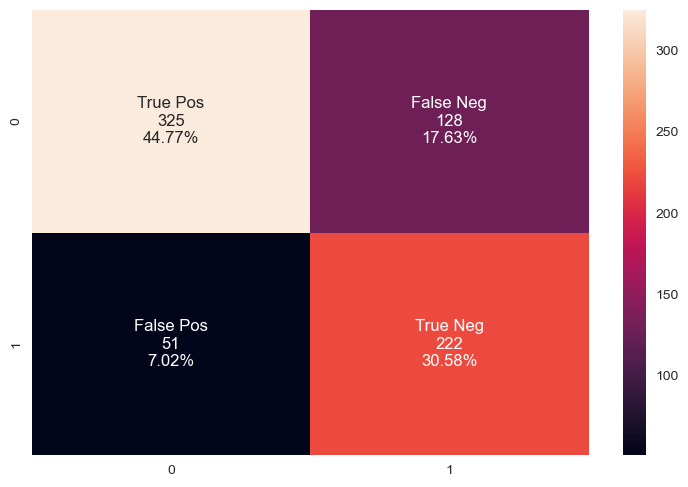

In [709]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [710]:
n_classes = np.array([0, 1])

In [711]:
from sklearn.model_selection import GridSearchCV

params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0],
          'fit_prior': [True, False],
          'class_prior': [None, [0.1,]* len(n_classes), ],
          'binarize': [None, 0.0, 8.5, 10.0]
         }

bernoulli_nb_grid = GridSearchCV(BernoulliNB(), param_grid=params, n_jobs=-1, cv=5, verbose=5)
bernoulli_nb_grid.fit(X_train,y_train)

print('Best Parameters : {}'.format(bernoulli_nb_grid.best_params_))
print('Best Accuracy Through Grid Search : {:.3f}\n'.format(bernoulli_nb_grid.best_score_))

Fitting 5 folds for each of 80 candidates, totalling 400 fits


/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountered in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountered in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountere

/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountered in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountered in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountere

Best Parameters : {'alpha': 0.01, 'binarize': 8.5, 'class_prior': None, 'fit_prior': True}
Best Accuracy Through Grid Search : 0.792



d in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountered in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1168: RuntimeWarning: invalid value encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py:1183: RuntimeWarning: invalid value encountered in log
  neg_prob = np.log(1 - np.exp(self.feature_log_prob_))
/opt/anaconda3/lib/python3.9/site-packages/skle

In [712]:
bernoulli_nb_grid.best_params_

{'alpha': 0.01, 'binarize': 8.5, 'class_prior': None, 'fit_prior': True}

In [713]:
# Retrain
clf = BernoulliNB(alpha= 0.01, binarize= 0.0, class_prior= None, fit_prior= True)

In [714]:
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.86      0.72      0.78       453
         1.0       0.63      0.81      0.71       273

    accuracy                           0.75       726
   macro avg       0.75      0.77      0.75       726
weighted avg       0.78      0.75      0.76       726



In [715]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)

In [716]:
confusion_matrix(y_test, y_pred)

array([[325, 128],
       [ 51, 222]])

In [717]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(clf,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))


Accuracy Score :  0.7534435261707989
Precession Score :  0.7493237082066869
Recall Score     :  0.7653130533925236
F1 Score       :  0.7483788896483221
Cross Val Score :  0.2589726003909331


In [718]:
# prediction of a record to belong to the positive class

y_score = clf.predict_proba(X_test)
y_score[:6]

array([[9.49715642e-01, 5.02843579e-02],
       [9.00745160e-01, 9.92548399e-02],
       [4.17407079e-01, 5.82592921e-01],
       [9.99995003e-01, 4.99667432e-06],
       [9.99994151e-01, 5.84882482e-06],
       [9.99994859e-01, 5.14084769e-06]])

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

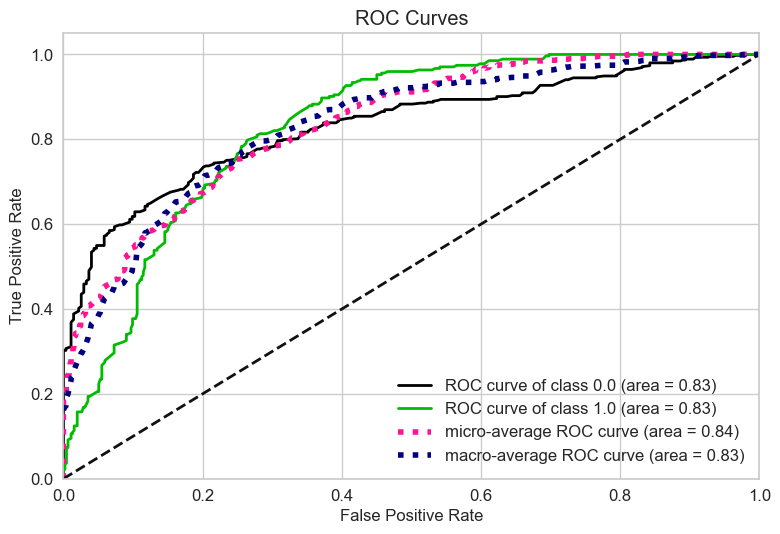

In [719]:
import scikitplot as skplt
skplt.metrics.plot_roc(y_test, y_score)

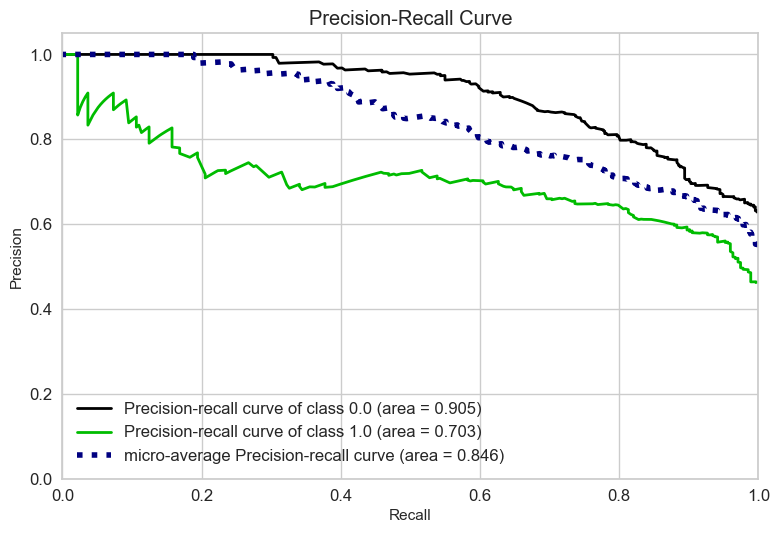

In [720]:
plot_precision_recall(y_test, clf.predict_proba(X_test))
plt.show()

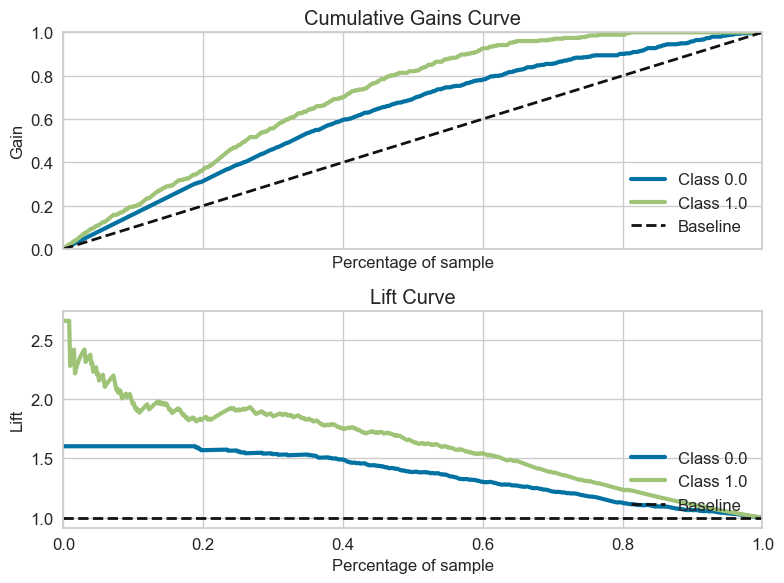

In [721]:
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(8,6))
plot_cumulative_gain(y_test, clf.predict_proba(X_test), ax=axs[0])
plot_lift_curve(y_test, clf.predict_proba(X_test), ax=axs[1])
plt.tight_layout()
plt.show()

## Multinomial NB

In [722]:
X = df.drop("vocal_channel", axis=1)
y = df["vocal_channel"]

# Train|Test Split and Scaling Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [723]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB(alpha=1, class_prior=None, fit_prior=True)

In [724]:
from sklearn.preprocessing import MinMaxScaler


In [725]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
scaler = MinMaxScaler()
scaler1 = MinMaxScaler()
scaled_X = scaler.fit_transform(X)
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [726]:
# clf.fit(X_train, y_train)
# y_pred = clf.predict(X_test)
# print(classification_report(y_test, y_pred))

In [727]:
# Negative values cannot be passed to Multinomial NB

In [728]:
clf.fit(scaled_X_train, y_train)

MultinomialNB(alpha=1)

In [729]:
# clf.fit(X_train, y_train)
y_pred = clf.predict(scaled_X_test)
# print(classification_report(y_test, y_pred))

In [730]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90       453
         1.0       0.95      0.70      0.80       273

    accuracy                           0.87       726
   macro avg       0.89      0.84      0.85       726
weighted avg       0.88      0.87      0.87       726



In [731]:
clf.predict_proba(scaled_X_test)

array([[0.74142785, 0.25857215],
       [0.77383621, 0.22616379],
       [0.62536638, 0.37463362],
       ...,
       [0.85984403, 0.14015597],
       [0.46032971, 0.53967029],
       [0.49602515, 0.50397485]])

In [732]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    recall_score,
precision_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print("Precession Score : ", precision_score(y_test, y_pred, average="macro"))
print("Recall Score     : ", recall_score(y_test, y_pred, average="macro"))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(clf,scaled_X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))


Accuracy Score :  0.871900826446281
Precession Score :  0.8945280024185625
Recall Score     :  0.8376755694636489
F1 Score       :  0.8545105855734525
Cross Val Score :  0.1386029285689791


In [733]:
confusion_matrix = confusion_matrix(y_test, y_pred)

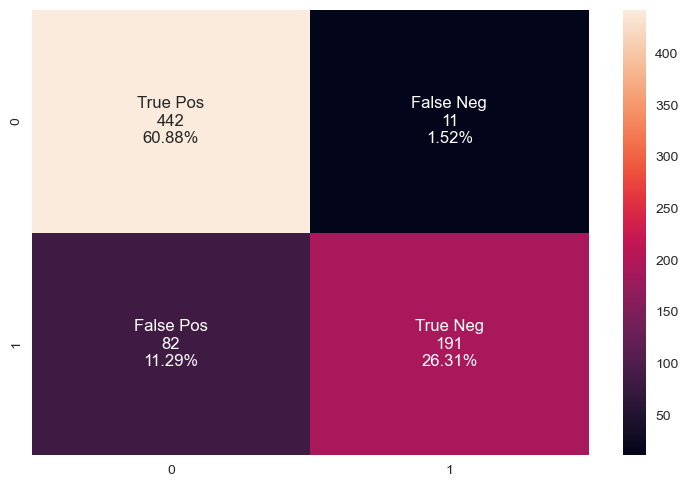

In [734]:
#CF MATRIX VISUALIZATION

import seaborn as sns

group_names = ["True Pos","False Neg","False Pos","True Neg"]
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(confusion_matrix, annot=labels, fmt="")

In [735]:
# prediction of a record to belong to the positive class

y_score = clf.predict_proba(scaled_X_test)
y_score[:6]

array([[0.74142785, 0.25857215],
       [0.77383621, 0.22616379],
       [0.62536638, 0.37463362],
       [0.76948942, 0.23051058],
       [0.83517136, 0.16482864],
       [0.77117076, 0.22882924]])

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

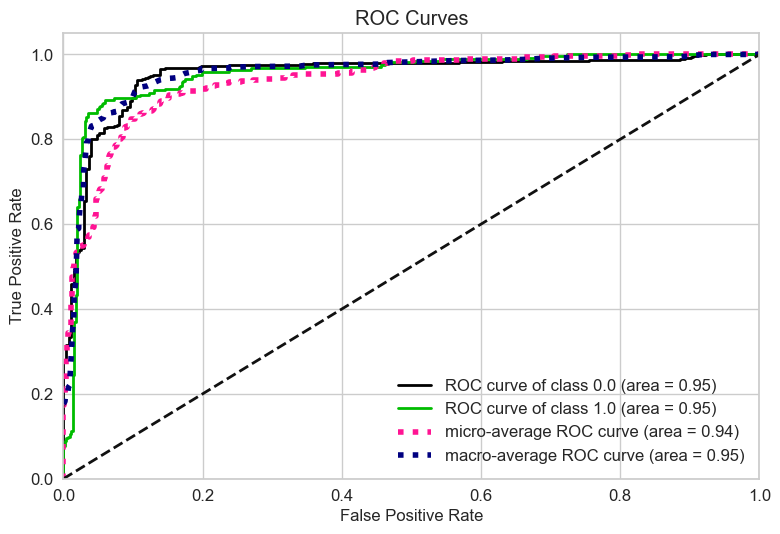

In [736]:
import scikitplot as skplt
skplt.metrics.plot_roc(y_test, y_score)

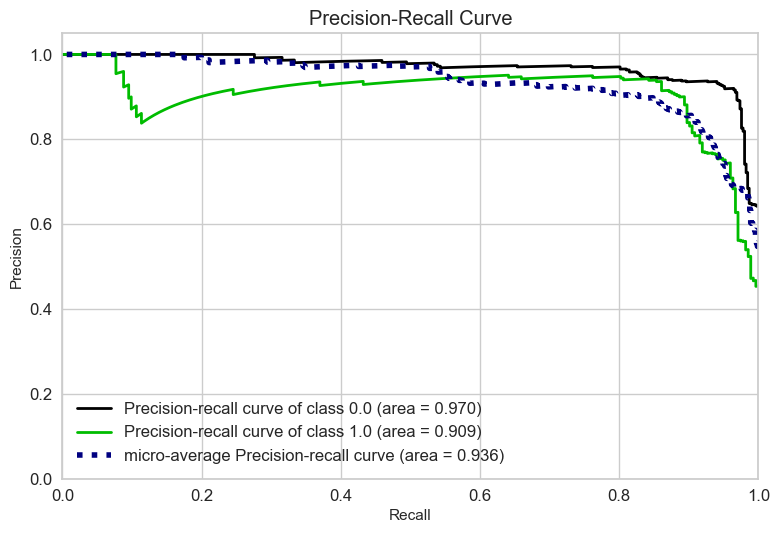

In [737]:
plot_precision_recall(y_test, clf.predict_proba(scaled_X_test))
plt.show()

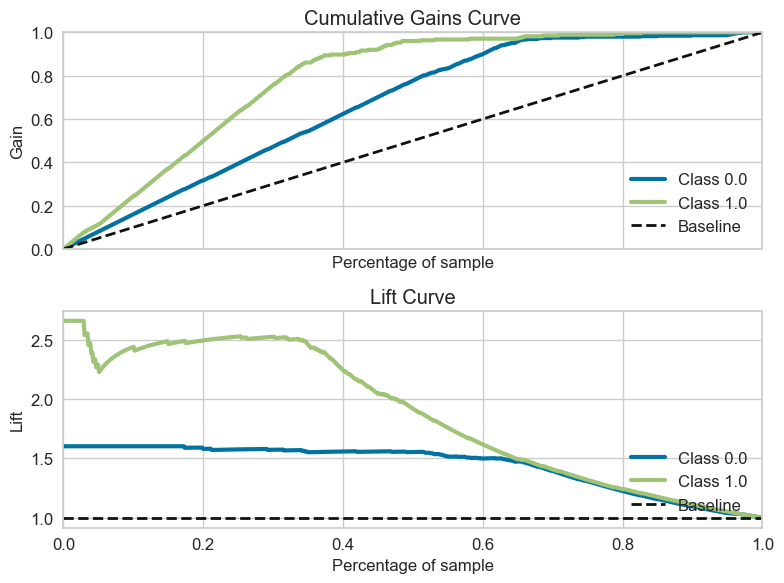

In [738]:
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(8,6))
plot_cumulative_gain(y_test, clf.predict_proba(scaled_X_test), ax=axs[0])
plot_lift_curve(y_test, clf.predict_proba(scaled_X_test), ax=axs[1])
plt.tight_layout()
plt.show()

In [739]:
param_grid = [{'alpha': [1, 0.1, 0.01, 0.001, 0.0001, 0.00001]}]  # creating parameter grid


In [740]:
# param_grid_nb = {
#     'var_smoothing': np.logspace(0,-9, num=100)
# }

In [741]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
nbModel_grid = GridSearchCV(estimator=MultinomialNB(), param_grid=param_grid, verbose=1, cv=10, n_jobs=-1)
nbModel_grid.fit(scaled_X_train, y_train)
print(nbModel_grid.best_estimator_)

Fitting 10 folds for each of 6 candidates, totalling 60 fits
MultinomialNB(alpha=0.01)


In [742]:
y_pred = nbModel_grid.predict(scaled_X_test)

In [743]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")
from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")
from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")
from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[442  11]
 [ 82 191]] : is the confusion matrix
0.871900826446281 : is the accuracy score
0.9455445544554455 : is the precision score
0.6996336996336996 : is the recall score
0.8042105263157895 : is the f1 score


In [744]:
nbModel_grid.best_estimator_.get_params()

{'alpha': 0.01, 'class_prior': None, 'fit_prior': True}

In [745]:
confusion_matrix(y_test, y_pred)

array([[442,  11],
       [ 82, 191]])

In [746]:
# Retrain

In [747]:
from sklearn.naive_bayes import GaussianNB, CategoricalNB
clf = MultinomialNB(alpha= 1, class_prior= None, fit_prior= True)

In [748]:
clf.fit(scaled_X_train, y_train)

MultinomialNB(alpha=1)

In [749]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90       453
         1.0       0.95      0.70      0.80       273

    accuracy                           0.87       726
   macro avg       0.89      0.84      0.85       726
weighted avg       0.88      0.87      0.87       726



In [750]:
# Performance evaluation
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve

# plot_cumulative_gain and plot_lift_curve only work in a binary classification case
print('Accuracy Score : ', accuracy_score(y_test, y_pred))
print('F1 Score       : ', f1_score(y_test, y_pred, average="macro"))
from sklearn.model_selection import cross_val_score
# SCORING OPTIONS:
# https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_val_score(clf,X,y,
                         scoring='neg_mean_absolute_error',cv=10)
print('Cross Val Score : ',abs(scores.mean()))

Accuracy Score :  0.871900826446281
F1 Score       :  0.8545105855734525
Cross Val Score :  nan


/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
10 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py", line 690, in fit
    self._count(X, Y)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/naive_bayes.py", line 863, in _count
    check_non_negative(X, "MultinomialNB (input X)")
  File "/opt/anaconda3/lib/python3.9/site-pack

In [751]:
abs(np.mean(scores))

nan

# Pattern Mining

## Preprocessing

In [752]:
new_df = df.copy()

In [753]:
df.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_kur', 'stft_skew', 'mean',
       'std', 'min', 'max', 'kur', 'skew', 'kmeans_labels'],
      dtype='object')

In [754]:
clus_cols

['vocal_channel',
 'length_ms',
 'emotion',
 'mfcc_min',
 'emotional_intensity',
 'max',
 'statement',
 'kur',
 'repetition',
 'frame_count',
 'sex',
 'stft_std']

In [755]:
patt_cols = ['vocal_channel',
 'emotional_intensity',
 'max',
 'statement',
 'frame_count',
 'sex',
 "kur",
 'stft_std']

In [756]:
new_df = df[patt_cols]

In [757]:
new_df

,vocal_channel,emotional_intensity,max,statement,frame_count,sex,kur,stft_std
0,0.0,0,0.138947,0,179379.0,1,9.406061,0.335533
1,0.0,0,0.263062,0,187387.0,1,19.564187,0.352380
2,0.0,1,0.166351,0,224224.0,1,4.881241,0.352270
3,0.0,0,0.024078,1,174575.0,1,13.040259,0.360552
4,1.0,1,0.242676,0,211411.0,1,7.485109,0.350655
...,...,...,...,...,...,...,...,...
2447,0.0,1,0.052399,1,221021.0,0,9.551363,0.304496
2448,0.0,0,0.084045,0,200200.0,0,22.517991,0.306333
2449,1.0,1,0.097260,0,251451.0,0,4.964319,0.347843
2450,0.0,0,0.052002,1,179379.0,0,13.855588,0.308684


In [758]:
new_df['kur_bin'] = pd.qcut(df["kur"], 4)
new_df['max_bin'] = pd.qcut(df['max'], 4)
new_df['frame_count_bin'] = pd.qcut(df['frame_count'], 4)
new_df['stft_std_bin'] = pd.qcut(df['stft_std'], 4)

new_df.drop(['stft_std', 'frame_count', 'max', 'kur'], axis=1, inplace=True)

/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/3190485178.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['kur_bin'] = pd.qcut(df["kur"], 4)
/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/3190485178.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['max_bin'] = pd.qcut(df['max'], 4)
/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/3190485178.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

In [759]:
# Preprocessing
# Converting categorical cols back to names

# Converting Categorical Attributes to Numeric Values

statement_map = {0: "Dogs are sitting by the door", 1 : "Kids are talking by the door"}

emotional_intensity_map = {0 : "normal", 1: "strong"}

# emotion_map = {0 : 'neutral', 1 : 'calm', 2: 'happy', 3 : 'sad', 4 : 'angry', 5 :'fearful', 6 : 'disgust', 7 : 'surprised'}

# repetition_map = {0 : "1st", 1 : "2nd"}

vocal_channel_map = {0 : "speech", 1 : "song"}

sex_map = {0 : "M", 1 : "F"}

new_df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map, 
            "vocal_channel": vocal_channel_map, "repetition": repetition_map, 
           "statement": statement_map, "modality": modality_map, "emotion": emotion_map}, inplace=True)

/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/1989087941.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df.replace({"sex": sex_map, "emotional_intensity": emotional_intensity_map,


In [760]:
new_df.head()

,vocal_channel,emotional_intensity,statement,sex,kur_bin,max_bin,frame_count_bin,stft_std_bin
0,speech,normal,Dogs are sitting by the door,F,"(6.53, 9.834]","(0.109, 0.225]","(172973.0, 192192.0]","(0.334, 0.349]"
1,speech,normal,Dogs are sitting by the door,F,"(14.095, 59.086]","(0.225, 0.999]","(172973.0, 192192.0]","(0.349, 0.392]"
2,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]","(0.109, 0.225]","(217818.0, 305906.0]","(0.349, 0.392]"
3,speech,normal,Kids are talking by the door,F,"(9.834, 14.095]","(0.0036699999999999997, 0.0554]","(172973.0, 192192.0]","(0.349, 0.392]"
4,song,strong,Dogs are sitting by the door,F,"(6.53, 9.834]","(0.225, 0.999]","(192192.0, 217818.0]","(0.349, 0.392]"


In [761]:
new_df['kur_bin'] = pd.qcut(df["kur"], 4)
new_df['max_bin'] = pd.qcut(df['max'], 4)
new_df['frame_count_bin'] = pd.qcut(df['frame_count'], 4)
new_df['stft_std_bin'] = pd.qcut(df['stft_std'], 4)


/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/606203989.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['kur_bin'] = pd.qcut(df["kur"], 4)
/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/606203989.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['max_bin'] = pd.qcut(df['max'], 4)
/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/606203989.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

In [762]:
new_df['kur_bin'] = new_df['kur_bin'].astype(str) + "_Kur"
new_df['max_bin'] = new_df['max_bin'].astype(str) + "_Max"
new_df['frame_count_bin'] = new_df['frame_count_bin'].astype(str) + "_FrameCount"
new_df['stft_std_bin'] = new_df['stft_std_bin'].astype(str) + "_StftStd"

/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/3648959843.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['kur_bin'] = new_df['kur_bin'].astype(str) + "_Kur"
/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/3648959843.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['max_bin'] = new_df['max_bin'].astype(str) + "_Max"
/var/folders/kx/vwf66kn17s153dgnqfn48k180000gn/T/ipykernel_38451/3648959843.py:3: SettingWithCopyWarning: 
A value is trying to be set on 

In [763]:
new_df.head()

,vocal_channel,emotional_intensity,statement,sex,kur_bin,max_bin,frame_count_bin,stft_std_bin
0,speech,normal,Dogs are sitting by the door,F,"(6.53, 9.834]_Kur","(0.109, 0.225]_Max","(172973.0, 192192.0]_FrameCount","(0.334, 0.349]_StftStd"
1,speech,normal,Dogs are sitting by the door,F,"(14.095, 59.086]_Kur","(0.225, 0.999]_Max","(172973.0, 192192.0]_FrameCount","(0.349, 0.392]_StftStd"
2,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.109, 0.225]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd"
3,speech,normal,Kids are talking by the door,F,"(9.834, 14.095]_Kur","(0.0036699999999999997, 0.0554]_Max","(172973.0, 192192.0]_FrameCount","(0.349, 0.392]_StftStd"
4,song,strong,Dogs are sitting by the door,F,"(6.53, 9.834]_Kur","(0.225, 0.999]_Max","(192192.0, 217818.0]_FrameCount","(0.349, 0.392]_StftStd"


In [764]:
new_df["stft_std_bin"].sort_values().unique()

array(['(0.209, 0.318]_StftStd', '(0.318, 0.334]_StftStd',
       '(0.334, 0.349]_StftStd', '(0.349, 0.392]_StftStd'], dtype=object)

In [765]:
new_df["kur_bin"].sort_values().unique()

array(['(1.7570000000000001, 6.53]_Kur', '(14.095, 59.086]_Kur',
       '(6.53, 9.834]_Kur', '(9.834, 14.095]_Kur'], dtype=object)

In [766]:
new_df["max_bin"].sort_values().unique()

array(['(0.0036699999999999997, 0.0554]_Max', '(0.0554, 0.109]_Max',
       '(0.109, 0.225]_Max', '(0.225, 0.999]_Max'], dtype=object)

In [767]:
new_df["frame_count_bin"].sort_values().unique()

array(['(140940.999, 172973.0]_FrameCount',
       '(172973.0, 192192.0]_FrameCount',
       '(192192.0, 217818.0]_FrameCount',
       '(217818.0, 305906.0]_FrameCount'], dtype=object)

In [768]:
df[["kur", "frame_count", "vocal_channel"]].corr()

,kur,frame_count,vocal_channel
kur,1.000000,-0.459839,-0.493606
frame_count,-0.459839,1.000000,0.724790
vocal_channel,-0.493606,0.724790,1.000000


In [769]:
df[["statement", "sex", "vocal_channel"]].corr()

,statement,sex,vocal_channel
statement,1.000000,-0.000303,-0.005664
sex,-0.000303,1.000000,-0.028086
vocal_channel,-0.005664,-0.028086,1.000000


In [770]:
df[["max", "statement", "emotional_intensity", "vocal_channel"]].corr()

,max,statement,emotional_intensity,vocal_channel
max,1.000000,0.005138,0.418561,0.026629
statement,0.005138,1.000000,-0.003263,-0.005664
emotional_intensity,0.418561,-0.003263,1.000000,-0.010564
vocal_channel,0.026629,-0.005664,-0.010564,1.000000


In [771]:
df[["max", "statement", "emotional_intensity","vocal_channel"]].corr()

,max,statement,emotional_intensity,vocal_channel
max,1.000000,0.005138,0.418561,0.026629
statement,0.005138,1.000000,-0.003263,-0.005664
emotional_intensity,0.418561,-0.003263,1.000000,-0.010564
vocal_channel,0.026629,-0.005664,-0.010564,1.000000


In [772]:
df[["frame_count", "vocal_channel"]].corr()

,frame_count,vocal_channel
frame_count,1.00000,0.72479
vocal_channel,0.72479,1.00000


In [773]:
# "kur", "sex", "vocal_channel"

In [774]:
new_df["kur_bin"].unique()

array(['(6.53, 9.834]_Kur', '(14.095, 59.086]_Kur',
       '(1.7570000000000001, 6.53]_Kur', '(9.834, 14.095]_Kur'],
      dtype=object)

In [775]:
X = new_df.values.tolist()

In [776]:
X

[['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(6.53, 9.834]_Kur',
  '(0.109, 0.225]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.334, 0.349]_StftStd'],
 ['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(14.095, 59.086]_Kur',
  '(0.225, 0.999]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'strong',
  'Dogs are sitting by the door',
  'F',
  '(1.7570000000000001, 6.53]_Kur',
  '(0.109, 0.225]_Max',
  '(217818.0, 305906.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'normal',
  'Kids are talking by the door',
  'F',
  '(9.834, 14.095]_Kur',
  '(0.0036699999999999997, 0.0554]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['song',
  'strong',
  'Dogs are sitting by the door',
  'F',
  '(6.53, 9.834]_Kur',
  '(0.225, 0.999]_Max',
  '(192192.0, 217818.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(9.834, 1

In [777]:
X[0]

['speech',
 'normal',
 'Dogs are sitting by the door',
 'F',
 '(6.53, 9.834]_Kur',
 '(0.109, 0.225]_Max',
 '(172973.0, 192192.0]_FrameCount',
 '(0.334, 0.349]_StftStd']

## Apriori

In [778]:
# conda install -c conda-forge pyfim

In [779]:
from fim import apriori

In [780]:
help(apriori)

Help on built-in function apriori in module fim:

apriori(...)
    apriori (tracts, target='s', supp=10, zmin=1, zmax=None, report='a',
             eval='x', agg='x', thresh=10, prune=None, algo='b', mode='',
             border=None)
    Find frequent item sets with the Apriori algorithm.
    tracts  transaction database to mine (mandatory)
            The database must be an iterable of transactions;
            each transaction must be an iterable of items;
            each item must be a hashable object.
            If the database is a dictionary, the transactions are
            the keys, the values their (integer) multiplicities.
    target  type of frequent item sets to find     (default: s)
            s/a   sets/all   all     frequent item sets
            c     closed     closed  frequent item sets
            m     maximal    maximal frequent item sets
            g     gens       generators
            r     rules      association rules
    supp    minimum support of an i

### If a rule satisfies both minimum support and minimum confidence, it is a strong rule. 
Important Definitions :
Support : It is one of the measure of interestingness. This tells about usefulness and certainty of rules. 5% Support means total 5% of transactions in database follow the rule.
 

Support(A -> B) = Support_count(A ∪ B)
Confidence: A confidence of 60% means that 60% of the customers who purchased a milk and bread also bought butter.
 

Confidence(A -> B) = Support_count(A ∪ B) / Support_count(A)
If a rule satisfies both minimum support and minimum confidence, it is a strong rule. 


Support_count(X) : Number of transactions in which X appears. If X is A union B then it is the number of transactions in which A and B both are present.
Maximal Itemset: An itemset is maximal frequent if none of its supersets are frequent.
Closed Itemset:An itemset is closed if none of its immediate supersets have same support count same as Itemset.
K- Itemset:Itemset which contains K items is a K-itemset. So it can be said that an itemset is frequent if the corresponding support count is greater than minimum support count.

In [781]:
# Frequent Itemset
all_itemsets = apriori(X, target="s", supp=2, zmin=3, report="S")
all_itemsets_df = pd.DataFrame(all_itemsets, columns=["frequent_itemset", "support"])

In [782]:
all_itemsets

[(('(217818.0, 305906.0]_FrameCount',
   '(0.318, 0.334]_StftStd',
   '(0.225, 0.999]_Max'),
  2.15142738932561),
 (('(217818.0, 305906.0]_FrameCount',
   '(0.318, 0.334]_StftStd',
   '(1.7570000000000001, 6.53]_Kur'),
  2.399669011170873),
 (('(217818.0, 305906.0]_FrameCount',
   '(0.318, 0.334]_StftStd',
   '(1.7570000000000001, 6.53]_Kur',
   'song'),
  2.1928009929664873),
 (('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song'),
  4.137360364087712),
 (('(217818.0, 305906.0]_FrameCount',
   '(0.318, 0.334]_StftStd',
   'song',
   'strong'),
  2.2341745966073643),
 (('(217818.0, 305906.0]_FrameCount',
   '(0.318, 0.334]_StftStd',
   'song',
   'Kids are talking by the door'),
  2.399669011170873),
 (('(217818.0, 305906.0]_FrameCount',
   '(0.318, 0.334]_StftStd',
   'song',
   'Kids are talking by the door',
   'M'),
  2.110053785684733),
 (('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'M'),
  3.6822507240380635),
 (('(217818.0, 305906.0]_Fram

In [783]:
# Frequent Itemset
all_itemsets1 = apriori(X, target="s", supp=15, zmin=3, report="S")
pd.DataFrame(all_itemsets1, columns=["frequent_itemset", "support"])

,frequent_itemset,support
0,"((0.209, 0.318]_StftStd, M, speech)",21.348779
1,"((140940.999, 172973.0]_FrameCount, M, speech)",15.928837
2,"((140940.999, 172973.0]_FrameCount, normal, sp...",18.535374
3,"(F, Dogs are sitting by the door, speech)",15.308233
4,"(F, Kids are talking by the door, speech)",16.052958
5,"(F, normal, speech)",16.756309
6,"(Dogs are sitting by the door, M, speech)",15.597849
7,"(Dogs are sitting by the door, normal, speech)",16.425321
8,"(Kids are talking by the door, M, speech)",15.515101
9,"(Kids are talking by the door, normal, speech)",16.921804


In [784]:
# all_itemset
# when supp=0.02, len = 2683
# when supp=0.15, len = 15

In [785]:
len(all_itemsets)

2683

In [786]:
all_itemsets1

[(('(0.209, 0.318]_StftStd', 'M', 'speech'), 21.348779478692595),
 (('(140940.999, 172973.0]_FrameCount', 'M', 'speech'), 15.928837401737692),
 (('(140940.999, 172973.0]_FrameCount', 'normal', 'speech'),
  18.53537443111295),
 (('F', 'Dogs are sitting by the door', 'speech'), 15.308233347124533),
 (('F', 'Kids are talking by the door', 'speech'), 16.05295821266032),
 (('F', 'normal', 'speech'), 16.756309474555234),
 (('Dogs are sitting by the door', 'M', 'speech'), 15.597848572610673),
 (('Dogs are sitting by the door', 'normal', 'speech'), 16.42532064542822),
 (('Kids are talking by the door', 'M', 'speech'), 15.51510136532892),
 (('Kids are talking by the door', 'normal', 'speech'), 16.921803889118742),
 (('M', 'normal', 'speech'), 16.590815059991726)]

In [787]:
len(all_itemsets1)

11

In [788]:
len(df)

2417

In [789]:
all_itemsets[2]

(('(217818.0, 305906.0]_FrameCount',
  '(0.318, 0.334]_StftStd',
  '(1.7570000000000001, 6.53]_Kur',
  'song'),
 2.1928009929664873)

In [790]:
# Checking "Speech" occurence in all_items:
count = 0
for x in all_itemsets:
    if "speech" in x[-2]:
        count += 1
#         print(x)
print(count)

869


In [791]:
# # all_itemsets
# s <= 11, 
# we have 2626 frequent patterns

# s >11,
# we have 57 frequent patterns

In [792]:
# Checking Items whether different or frequent
# all_itemsets
count = 0
for x in all_itemsets:
    if x[-1] < 14:
        count += 1
        print(x)
print(count)

(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', '(0.225, 0.999]_Max'), 2.15142738932561)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', '(1.7570000000000001, 6.53]_Kur'), 2.399669011170873)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', '(1.7570000000000001, 6.53]_Kur', 'song'), 2.1928009929664873)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song'), 4.137360364087712)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'strong'), 2.2341745966073643)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'Kids are talking by the door'), 2.399669011170873)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'Kids are talking by the door', 'M'), 2.110053785684733)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'M'), 3.6822507240380635)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'strong'), 2.813405047579644)
(('(217818.0, 30590

In [793]:
# Checking Items whether different or frequent
# all_itemsets
count = 0
final_list = []
for x in all_itemsets:
    if x[-1] < 11:
        count += 1
        final_list.append(x)
print(count)

2626


In [794]:
final_list[1]

(('(217818.0, 305906.0]_FrameCount',
  '(0.318, 0.334]_StftStd',
  '(1.7570000000000001, 6.53]_Kur'),
 2.399669011170873)

In [795]:
sorted_by_second = sorted(final_list, key=lambda tup: tup[1], reverse=True)

In [796]:
pattern_df = pd.DataFrame(sorted_by_second, columns=["frequent_itemset", "support"])

In [797]:
# pattern_df = pattern_df.reset_index(drop=True)

In [798]:
sorted_by_second

[(('(0.0554, 0.109]_Max', 'normal', 'speech'), 10.92263136119156),
 (('song', 'M', 'normal'), 10.757136946628052),
 (('(172973.0, 192192.0]_FrameCount', 'normal', 'speech'), 10.715763342987174),
 (('(0.209, 0.318]_StftStd', 'Kids are talking by the door', 'M', 'speech'),
  10.715763342987174),
 (('(14.095, 59.086]_Kur', '(140940.999, 172973.0]_FrameCount', 'speech'),
  10.63301613570542),
 (('(0.209, 0.318]_StftStd', 'Dogs are sitting by the door', 'M', 'speech'),
  10.63301613570542),
 (('(14.095, 59.086]_Kur', 'strong', 'speech'), 10.550268928423666),
 (('(217818.0, 305906.0]_FrameCount', 'song', 'Dogs are sitting by the door'),
  10.508895324782788),
 (('(0.349, 0.392]_StftStd', 'F', 'speech'), 10.508895324782788),
 (('(0.225, 0.999]_Max', 'strong', 'Kids are talking by the door'),
  10.467521721141912),
 (('(140940.999, 172973.0]_FrameCount', 'F', 'speech'), 10.426148117501034),
 (('(217818.0, 305906.0]_FrameCount', 'song', 'Kids are talking by the door'),
  10.384774513860156),
 (

In [799]:
pattern_df

,frequent_itemset,support
0,"((0.0554, 0.109]_Max, normal, speech)",10.922631
1,"(song, M, normal)",10.757137
2,"((172973.0, 192192.0]_FrameCount, normal, speech)",10.715763
3,"((0.209, 0.318]_StftStd, Kids are talking by t...",10.715763
4,"((14.095, 59.086]_Kur, (140940.999, 172973.0]_...",10.633016
...,...,...
2621,"((192192.0, 217818.0]_FrameCount, (1.757000000...",2.027307
2622,"((192192.0, 217818.0]_FrameCount, (0.209, 0.31...",2.027307
2623,"((192192.0, 217818.0]_FrameCount, (0.209, 0.31...",2.027307
2624,"((192192.0, 217818.0]_FrameCount, F, Kids are ...",2.027307


<AxesSubplot:ylabel='Count'>

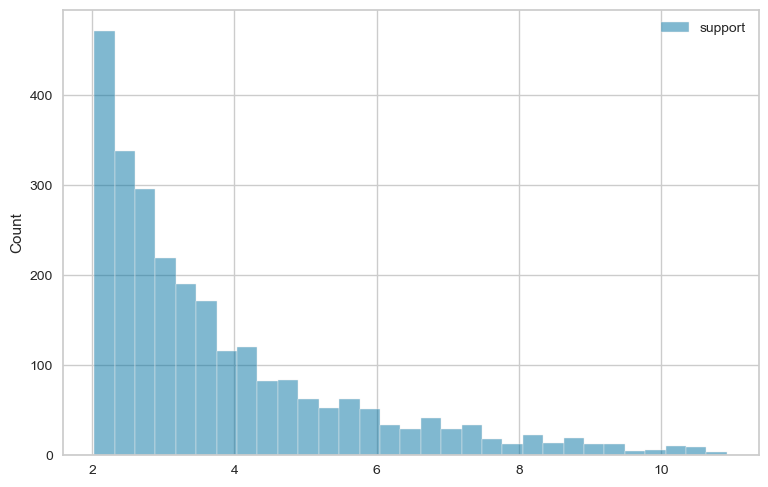

In [800]:
sns.histplot(pattern_df)

In [801]:
pattern_df.describe()

,support
count,2626.000000
mean,3.774183
std,1.800915
min,2.027307
25%,2.441043
50%,3.144394
75%,4.468349
max,10.922631


In [802]:
pattern_df.iloc[18]

frequent_itemset    (song, Dogs are sitting by the door, normal)
support                                                 10.21928
Name: 18, dtype: object

In [803]:
# PATTERN	SUPPORT
# ('(6.53, 9.834]_Kur',
  
#  	(0.0036699999999999997, 0.0554]_Max'	'(140940.999, 172973.0]_FrameCount',
# 	'Dogs are sitting by the door',	'speech'	2.027307
# (1.7570000000000001, 6.53]_Kur'	'(0.334, 0.349]_StftStd'	(('(217818.0, 305906.0]_FrameCount'	-	'song'	4.468349

# '(1.7570000000000001, 6.53]_Kur'	-	(217818.0, 305906.0]_FrameCount	'Kids are talking by the door')	-	7.033513
# '(1.7570000000000001, 6.53]_Kur'	-	-	'normal'	'song'	21.348779


## Checking

In [804]:
# all_itemsets
count = 0
final_list = []
for x in all_itemsets:
    if x[-1] < 14:
        count += 1
        final_list.append(x)
print(count)

2663


In [805]:
sorted_by_second = sorted(final_list, key=lambda tup: tup[1], reverse=True)
pattern_df = pd.DataFrame(sorted_by_second, columns=["frequent_itemset", "support"])

In [806]:
sorted_by_second

[(('(217818.0, 305906.0]_FrameCount',
   '(1.7570000000000001, 6.53]_Kur',
   'song'),
  13.984278030616467),
 (('(1.7570000000000001, 6.53]_Kur', 'song', 'normal'), 13.984278030616467),
 (('Kids are talking by the door', 'M', 'normal'), 13.818783616052958),
 (('(0.209, 0.318]_StftStd', 'M', 'normal'), 13.611915597848572),
 (('Dogs are sitting by the door', 'M', 'normal'), 13.529168390566818),
 (('(0.0036699999999999997, 0.0554]_Max', 'normal', 'speech'),
  13.405047579644187),
 (('F', 'Kids are talking by the door', 'normal'), 13.322300372362433),
 (('(0.349, 0.392]_StftStd', 'F', 'normal'), 13.239553165080679),
 (('F', 'Dogs are sitting by the door', 'normal'), 13.115432354158047),
 (('(0.209, 0.318]_StftStd', 'M', 'normal', 'speech'), 12.991311543235415),
 (('(0.225, 0.999]_Max', 'strong', 'speech'), 12.825817128671908),
 (('(14.095, 59.086]_Kur', 'normal', 'speech'), 12.825817128671908),
 (('(0.209, 0.318]_StftStd', '(140940.999, 172973.0]_FrameCount', 'speech'),
  12.7016963177492

In [807]:
pattern_df

,frequent_itemset,support
0,"((217818.0, 305906.0]_FrameCount, (1.757000000...",13.984278
1,"((1.7570000000000001, 6.53]_Kur, song, normal)",13.984278
2,"(Kids are talking by the door, M, normal)",13.818784
3,"((0.209, 0.318]_StftStd, M, normal)",13.611916
4,"(Dogs are sitting by the door, M, normal)",13.529168
...,...,...
2658,"((192192.0, 217818.0]_FrameCount, (1.757000000...",2.027307
2659,"((192192.0, 217818.0]_FrameCount, (0.209, 0.31...",2.027307
2660,"((192192.0, 217818.0]_FrameCount, (0.209, 0.31...",2.027307
2661,"((192192.0, 217818.0]_FrameCount, F, Kids are ...",2.027307


In [808]:
pattern_df.iloc[-10]

frequent_itemset    ((6.53, 9.834]_Kur, (0.0036699999999999997, 0....
support                                                      2.027307
Name: 2653, dtype: object

In [809]:
pattern_df.describe()

,support
count,2663.000000
mean,3.892366
std,2.049492
min,2.027307
25%,2.441043
50%,3.185767
75%,4.592470
max,13.984278


In [810]:
pattern_df["support"].value_counts() > 10

2.110054      True
2.068680      True
2.151427      True
2.027307      True
2.192801      True
             ...  
10.467522    False
7.736864     False
10.550269    False
9.060819     False
9.019446     False
Name: support, Length: 228, dtype: bool

In [811]:
pattern_df[pattern_df["support"] > 2]

,frequent_itemset,support
0,"((217818.0, 305906.0]_FrameCount, (1.757000000...",13.984278
1,"((1.7570000000000001, 6.53]_Kur, song, normal)",13.984278
2,"(Kids are talking by the door, M, normal)",13.818784
3,"((0.209, 0.318]_StftStd, M, normal)",13.611916
4,"(Dogs are sitting by the door, M, normal)",13.529168
...,...,...
2658,"((192192.0, 217818.0]_FrameCount, (1.757000000...",2.027307
2659,"((192192.0, 217818.0]_FrameCount, (0.209, 0.31...",2.027307
2660,"((192192.0, 217818.0]_FrameCount, (0.209, 0.31...",2.027307
2661,"((192192.0, 217818.0]_FrameCount, F, Kids are ...",2.027307


<AxesSubplot:ylabel='Count'>

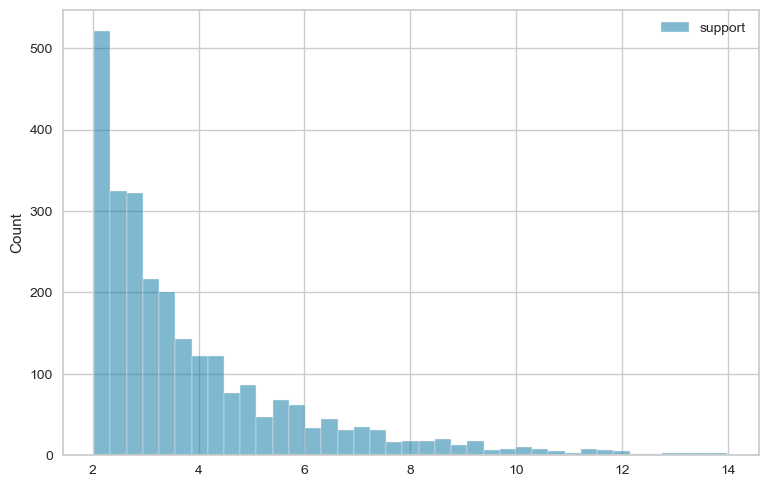

In [812]:
sns.histplot(pattern_df)

In [813]:
all_itemsets[20]

(('(217818.0, 305906.0]_FrameCount',
  '(0.349, 0.392]_StftStd',
  '(0.0554, 0.109]_Max',
  '(1.7570000000000001, 6.53]_Kur'),
 2.9375258585022754)

In [814]:
X

[['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(6.53, 9.834]_Kur',
  '(0.109, 0.225]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.334, 0.349]_StftStd'],
 ['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(14.095, 59.086]_Kur',
  '(0.225, 0.999]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'strong',
  'Dogs are sitting by the door',
  'F',
  '(1.7570000000000001, 6.53]_Kur',
  '(0.109, 0.225]_Max',
  '(217818.0, 305906.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'normal',
  'Kids are talking by the door',
  'F',
  '(9.834, 14.095]_Kur',
  '(0.0036699999999999997, 0.0554]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['song',
  'strong',
  'Dogs are sitting by the door',
  'F',
  '(6.53, 9.834]_Kur',
  '(0.225, 0.999]_Max',
  '(192192.0, 217818.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(9.834, 1

In [815]:
# Maximal Itemsets
maximal_itemsets = apriori(X, target="m", supp=2, zmin=3, report="S")
pd.DataFrame(maximal_itemsets, columns=["maximal_itemset", "support"])

,maximal_itemset,support
0,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.151427
1,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.192801
2,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.234175
3,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.110054
4,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.399669
...,...,...
727,"((0.0036699999999999997, 0.0554]_Max, F, Kids ...",3.558130
728,"((140940.999, 172973.0]_FrameCount, strong, F,...",2.234175
729,"((140940.999, 172973.0]_FrameCount, strong, Do...",3.144394
730,"((140940.999, 172973.0]_FrameCount, strong, Ki...",2.441043


In [816]:
all_itemsets[0]

(('(217818.0, 305906.0]_FrameCount',
  '(0.318, 0.334]_StftStd',
  '(0.225, 0.999]_Max'),
 2.15142738932561)

In [817]:
len(df)

2417

In [818]:
# # maximal_itemsets
# s <= 11, 
# we have 732 frequent patterns

# s >11,
# we have 0 frequent patterns

In [819]:
# Checking Items whether different or frequent
# all_itemsets
count = 0
for x in maximal_itemsets:
    if x[-1] > 4 :
        count += 1
        print(x)
print(count)

(('(172973.0, 192192.0]_FrameCount', 'strong', 'F', 'Dogs are sitting by the door', 'speech'), 4.220107571369466)
(('(0.209, 0.318]_StftStd', 'strong', 'Dogs are sitting by the door', 'M', 'speech'), 4.178733967728589)
2


In [820]:
len(all_itemsets)

2683

In [821]:
len(maximal_itemsets)

732

In [822]:
# Closed Itemsets
closed_itemsets = apriori(X, target="c", supp=2, zmin=3, report="S")
pd.DataFrame(closed_itemsets, columns=["closed_itemset", "support"])

,closed_itemset,support
0,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.151427
1,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.399669
2,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.192801
3,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",4.137360
4,"((217818.0, 305906.0]_FrameCount, (0.318, 0.33...",2.234175
...,...,...
2485,"(Kids are talking by the door, M, normal)",13.818784
2486,"(Kids are talking by the door, M, normal, speech)",8.316094
2487,"(Kids are talking by the door, M, speech)",15.515101
2488,"(Kids are talking by the door, normal, speech)",16.921804


In [823]:
# # closed_itemsets
# s <= 11, 
# we have 2434 frequent patterns

# s >11,
# we have 56 frequent patterns

In [824]:
# Checking Items whether different or frequent
# all_itemsets
count = 0
for x in closed_itemsets:
    if x[-1] <= 11 :
        count += 1
        print(x)
print(count)

(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', '(0.225, 0.999]_Max'), 2.15142738932561)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', '(1.7570000000000001, 6.53]_Kur'), 2.399669011170873)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', '(1.7570000000000001, 6.53]_Kur', 'song'), 2.1928009929664873)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song'), 4.137360364087712)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'strong'), 2.2341745966073643)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'Kids are talking by the door'), 2.399669011170873)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'Kids are talking by the door', 'M'), 2.110053785684733)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'song', 'M'), 3.6822507240380635)
(('(217818.0, 305906.0]_FrameCount', '(0.318, 0.334]_StftStd', 'strong'), 2.813405047579644)
(('(217818.0, 30590

## Pattern plots

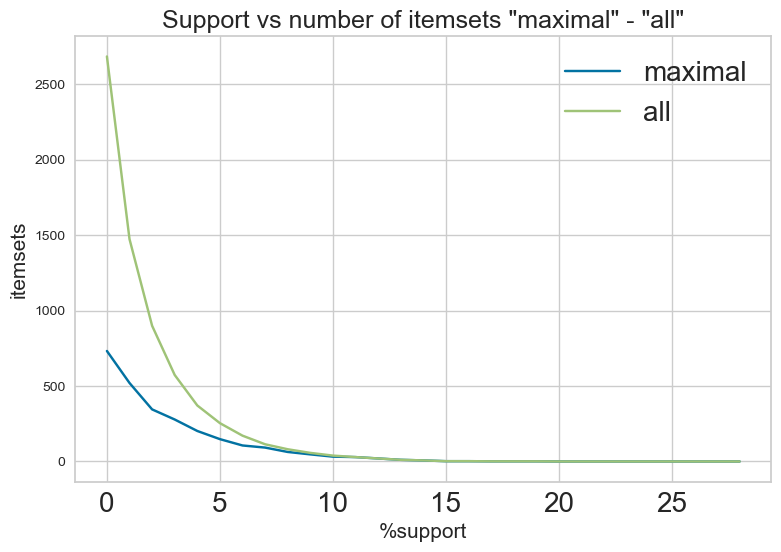

In [826]:
len_max_it = []
len_all_it = []
for i in range(2, 30+1):
    max_itemsets = apriori(X, target='m', supp=i, zmin=3)
    all_itemsets = apriori(X, target='s', supp=i, zmin=3)
    len_max_it.append( len(max_itemsets)  )
    len_all_it.append( len(all_itemsets) )
    
plt.plot(len_max_it, label='maximal')
plt.plot(len_all_it, label='all')
plt.legend(fontsize=20)
plt.xticks(fontsize=20)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets \"maximal\" - \"all\"", fontsize=18)
# plt.ylim(-25, 100)

plt.show()

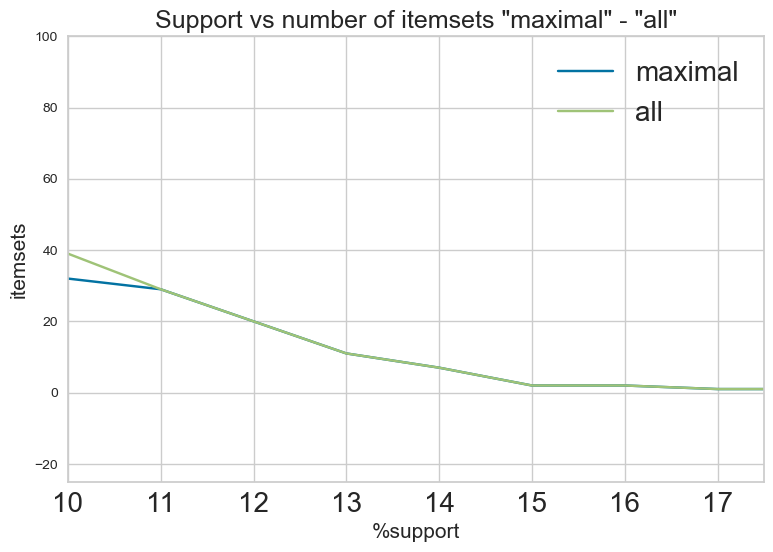

In [827]:
len_max_it = []
len_all_it = []
for i in range(2, 20+1):
    max_itemsets = apriori(X, target='m', supp=i, zmin=3)
    all_itemsets = apriori(X, target='s', supp=i, zmin=3)
    len_max_it.append( len(max_itemsets)  )
    len_all_it.append( len(all_itemsets) )
    
plt.plot(len_max_it, label='maximal')
plt.plot(len_all_it, label='all')
plt.legend(fontsize=20)
plt.xticks(fontsize=20)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets \"maximal\" - \"all\"", fontsize=18)
plt.ylim(-25, 100)
plt.xlim(10, 17.5)

plt.show()

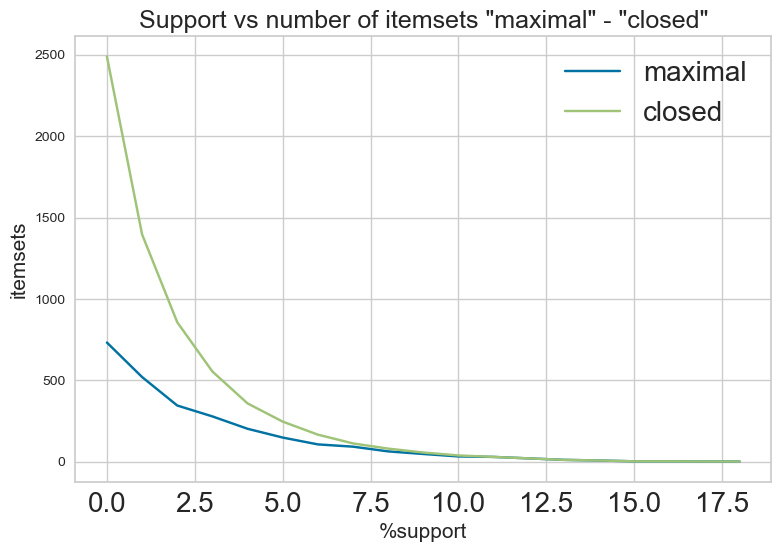

In [828]:
len_max_it = []
len_cl_it = []
for i in range(2, 20+1):
    max_itemsets = apriori(X, target='m', supp=i, zmin=3)
    cl_itemsets = apriori(X, target='c', supp=i, zmin=3)
    len_max_it.append( len(max_itemsets)  )
    len_cl_it.append( len(cl_itemsets) )
    
plt.plot(len_max_it, label='maximal')
plt.plot(len_cl_it, label='closed')
plt.legend(fontsize=20)
plt.xticks(fontsize=20)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets \"maximal\" - \"closed\"", fontsize=18)

plt.show()

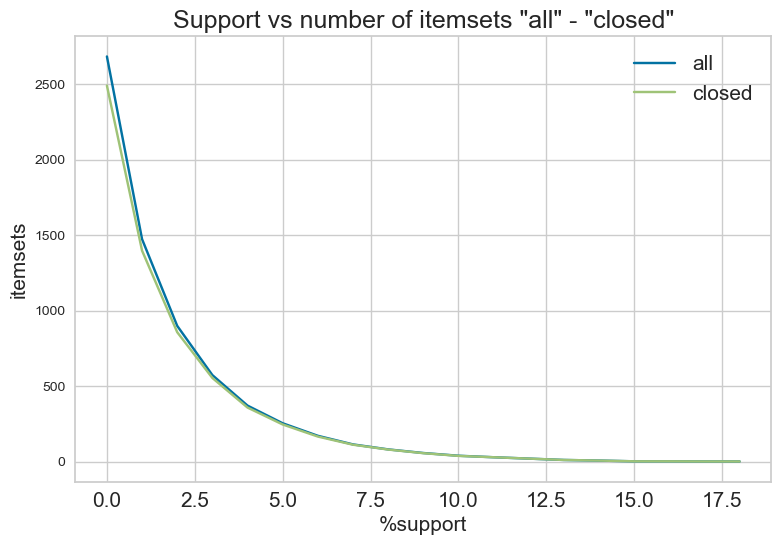

In [829]:
len_all_it1 = []
len_cl_it1 = []
for i in range(2, 20+1):
    all_itemsets1 = apriori(X, target='s', supp=i, zmin=3)
    close_itemsets1 = apriori(X, target='c', supp=i, zmin=3)
    len_all_it1.append( len(all_itemsets1)  )
    len_cl_it1.append( len(close_itemsets1) )
    
plt.plot(len_all_it1, label='all')
plt.plot(len_cl_it1, label='closed')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets \"all\" - \"closed\"", fontsize=18)

plt.show()

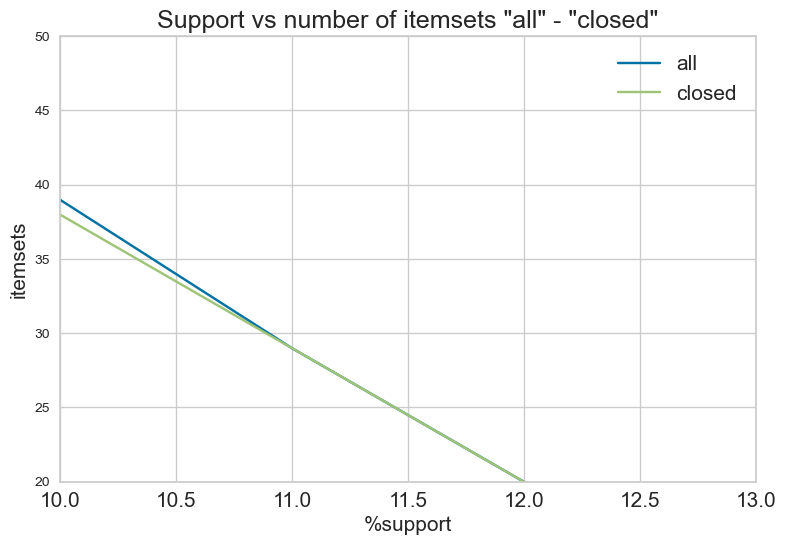

In [830]:
# Viewing the coinciding points at 11
len_all_it1 = []
len_cl_it1 = []
for i in range(2, 20+1):
    all_itemsets1 = apriori(X, target='s', supp=i, zmin=3)
    close_itemsets1 = apriori(X, target='c', supp=i, zmin=3)
    len_all_it1.append( len(all_itemsets1)  )
    len_cl_it1.append( len(close_itemsets1) )
    
plt.plot(len_all_it1, label='all')
plt.plot(len_cl_it1, label='closed')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets \"all\" - \"closed\"", fontsize=18)
plt.xlim(10, 13)
plt.ylim(20, 50)

plt.show()

In [831]:
new_df["vocal_channel"].unique()

array(['speech', 'song'], dtype=object)

In [832]:
X

[['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(6.53, 9.834]_Kur',
  '(0.109, 0.225]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.334, 0.349]_StftStd'],
 ['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(14.095, 59.086]_Kur',
  '(0.225, 0.999]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'strong',
  'Dogs are sitting by the door',
  'F',
  '(1.7570000000000001, 6.53]_Kur',
  '(0.109, 0.225]_Max',
  '(217818.0, 305906.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'normal',
  'Kids are talking by the door',
  'F',
  '(9.834, 14.095]_Kur',
  '(0.0036699999999999997, 0.0554]_Max',
  '(172973.0, 192192.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['song',
  'strong',
  'Dogs are sitting by the door',
  'F',
  '(6.53, 9.834]_Kur',
  '(0.225, 0.999]_Max',
  '(192192.0, 217818.0]_FrameCount',
  '(0.349, 0.392]_StftStd'],
 ['speech',
  'normal',
  'Dogs are sitting by the door',
  'F',
  '(9.834, 1

In [833]:
# Support vs number of itemset for speech / song
filter_1 = []
filter_2 = []

max_itemsets = apriori(X, target='s', supp=14, zmin=3)
filter_1.append( len([item for item in max_itemsets if 'speech' in item[0]])  )
filter_2.append( len([item for item in max_itemsets if 'song' in item[0]]) )

In [834]:
print(filter_1, filter_2)

[20] [0]


In [835]:
# when supp=2,
# "speech": 869, "song" : "529"

# when supp=11,
# "speech": 34, "song" : "7"

filter_1 = []
filter_2 = []

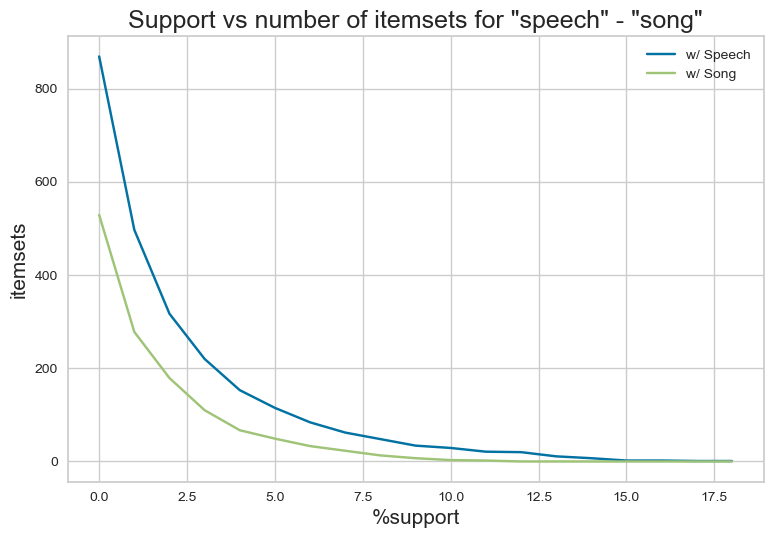

In [836]:
filter_1 = []
filter_2 = []
for i in range(2, 20+1):
    max_itemsets = apriori(X, target='s', supp=i, zmin=3)
    
    filter_1.append( len([item for item in max_itemsets if 'speech' in item[0]])  )
    filter_2.append( len([item for item in max_itemsets if 'song' in item[0]]) )
    
plt.plot(filter_1, label='w/ Speech')
plt.plot(filter_2, label='w/ Song')
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets for \"speech\" - \"song\"", fontsize=18)
# plt.ylim(-10, 50)

plt.show()

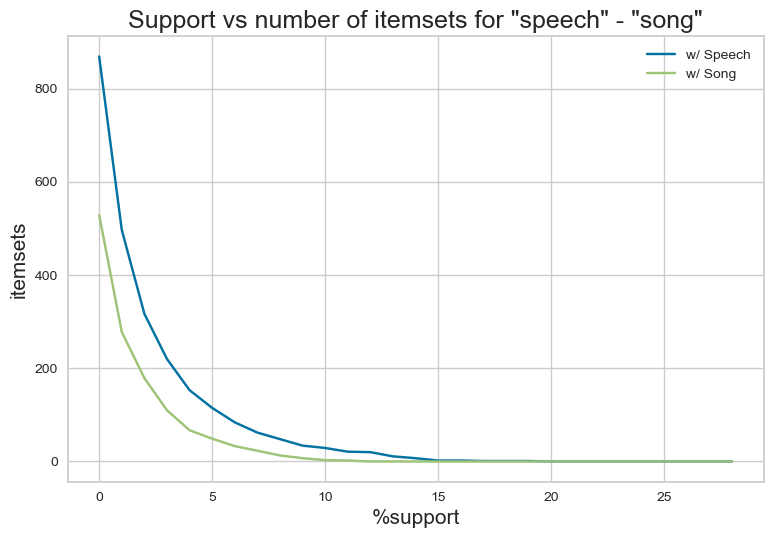

In [837]:
filter_1 = []
filter_2 = []
for i in range(2, 30+1):
    max_itemsets = apriori(X, target='s', supp=i, zmin=3)
    
    filter_1.append( len([item for item in max_itemsets if 'speech' in item[0]])  )
    filter_2.append( len([item for item in max_itemsets if 'song' in item[0]]) )
    
plt.plot(filter_1, label='w/ Speech')
plt.plot(filter_2, label='w/ Song')
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel('%support', fontsize=15)
plt.ylabel("itemsets", fontsize=15)
plt.title("Support vs number of itemsets for \"speech\" - \"song\"", fontsize=18)
# plt.ylim(-10, 10)
# plt.xlim(25, 30)

plt.show()

In [838]:
all_itemsets[:30]

[(('(0.209, 0.318]_StftStd', 'M', 'speech'), 516)]

In [839]:
len(max_itemsets)

0

In [840]:
# Rules

In [841]:
conf = 60
rules = apriori(X, target="r", supp=10, zmin=3, conf=conf, report="aScl")
rules_df = pd.DataFrame(
    rules,
    columns=[
        "consequent",
        "antecedent",
        "abs_support",
        "%_support",
        "confidence",
        "lift",
    ],
)
rules_df.sort_values(by="lift", axis=0, ascending=False)

,consequent,antecedent,abs_support,%_support,confidence,lift
177,"(0.209, 0.318]_StftStd","((140940.999, 172973.0]_FrameCount, M, normal,...",208,8.605710,0.832000,3.323874
180,"(0.209, 0.318]_StftStd","((140940.999, 172973.0]_FrameCount, M, normal)",208,8.605710,0.828685,3.310632
99,"(0.209, 0.318]_StftStd","((14.095, 59.086]_Kur, M, speech)",274,11.336367,0.803519,3.210092
210,"(0.209, 0.318]_StftStd","(M, normal, speech)",314,12.991312,0.783042,3.128287
158,"(1.7570000000000001, 6.53]_Kur","(song, Dogs are sitting by the door, normal)",191,7.902358,0.773279,3.089283
...,...,...,...,...,...,...
147,speech,"((0.0554, 0.109]_Max, M)",187,7.736864,0.607143,0.971831
269,speech,"(M, normal)",401,16.590815,0.606657,0.971052
267,speech,"(Kids are talking by the door, M)",375,15.515101,0.605816,0.969707
81,speech,"((0.225, 0.999]_Max, strong, Kids are talking ...",153,6.330161,0.604743,0.967989


In [842]:
# rules list for speech
speech_list = [r for r in rules if r[0] == "speech"]

In [843]:
# rules list for song
song_list = [r for r in rules if r[0] == "song"]

In [844]:
speech_list

[('speech',
  ('(172973.0, 192192.0]_FrameCount', 'strong'),
  305,
  12.618949110467522,
  0.9501557632398754,
  1.5208784634111119),
 ('speech',
  ('(172973.0, 192192.0]_FrameCount', 'F'),
  351,
  14.52213487794787,
  0.975,
  1.5606456953642385),
 ('speech',
  ('(172973.0, 192192.0]_FrameCount', 'Dogs are sitting by the door'),
  271,
  11.2122465866777,
  0.9575971731448764,
  1.532789647345143),
 ('speech',
  ('(172973.0, 192192.0]_FrameCount', 'Kids are talking by the door'),
  293,
  12.122465866776997,
  0.9575163398692811,
  1.5326602605722202),
 ('speech',
  ('(172973.0, 192192.0]_FrameCount', 'normal'),
  259,
  10.715763342987174,
  0.9664179104477612,
  1.5469086685776416),
 ('speech',
  ('(9.834, 14.095]_Kur', 'strong'),
  238,
  9.846917666528755,
  0.7460815047021944,
  1.1942245012352344),
 ('speech',
  ('(9.834, 14.095]_Kur', 'F'),
  240,
  9.929664873810509,
  0.8,
  1.2805298013245032),
 ('speech',
  ('(9.834, 14.095]_Kur', 'Dogs are sitting by the door'),
  243,
 

In [845]:
len(speech_list)

77

In [846]:
song_list

[('song',
  ('(217818.0, 305906.0]_FrameCount', '(0.349, 0.392]_StftStd'),
  227,
  9.391808026479106,
  0.9227642276422764,
  2.4590089726696607),
 ('song',
  ('(217818.0, 305906.0]_FrameCount', '(1.7570000000000001, 6.53]_Kur'),
  338,
  13.984278030616467,
  0.9234972677595629,
  2.4609623993107643),
 ('song',
  ('(217818.0, 305906.0]_FrameCount', 'strong'),
  226,
  9.350434422838228,
  0.8188405797101449,
  2.1820702107601107),
 ('song',
  ('(217818.0, 305906.0]_FrameCount', 'F'),
  270,
  11.170872983036823,
  0.8681672025723473,
  2.313517231110654),
 ('song',
  ('(217818.0, 305906.0]_FrameCount', 'Dogs are sitting by the door'),
  254,
  10.508895324782788,
  0.8881118881118881,
  2.366666409665307),
 ('song',
  ('(217818.0, 305906.0]_FrameCount', 'Kids are talking by the door'),
  251,
  10.384774513860156,
  0.847972972972973,
  2.2597030602818915),
 ('song',
  ('(217818.0, 305906.0]_FrameCount', 'M'),
  235,
  9.722796855606124,
  0.8671586715867159,
  2.3108296683848866),
 

In [847]:
len(song_list)

18

In [848]:
# Prediction

In [849]:
print("to_predict:", [r for r in rules if r[0] == "speech"][0][0])
print("how?", [r for r in rules if r[0] == "speech"][0][1])

to_predict: speech
how? ('(172973.0, 192192.0]_FrameCount', 'strong')


In [850]:
print("to_predict:", speech_list[0][0])
print("how?", speech_list[0][1])

to_predict: speech
how? ('(172973.0, 192192.0]_FrameCount', 'strong')


In [851]:
print("to_predict:", song_list[0][0])
print("how?", song_list[0][1])

to_predict: song
how? ('(217818.0, 305906.0]_FrameCount', '(0.349, 0.392]_StftStd')


In [852]:
rules_df.describe()

,abs_support,%_support,confidence,lift
count,270.000000,270.000000,270.000000,270.000000
mean,240.174074,9.936867,0.728935,1.655825
std,69.328881,2.868386,0.126459,0.625556
min,151.000000,6.247414,0.600000,0.963273
25%,190.250000,7.871328,0.621972,1.197273
50%,221.000000,9.143566,0.682873,1.386447
75%,276.500000,11.439801,0.831983,2.006401
max,516.000000,21.348779,1.000000,3.323874


In [853]:
rules_df["%_abs_support"] = (rules_df["abs_support"] / 301) * 100

In [854]:
rules_df[(rules_df["lift"] >= 1.8) & (rules_df["lift"] <= 1.9)]

,consequent,antecedent,abs_support,%_support,confidence,lift,%_abs_support
71,F,"((0.349, 0.392]_StftStd, Kids are talking by t...",248,10.260654,0.888889,1.809978,82.392027
73,F,"((0.349, 0.392]_StftStd, normal)",320,13.239553,0.893855,1.820090,106.312292
74,F,"((0.349, 0.392]_StftStd, speech)",254,10.508895,0.930403,1.894510,84.385382
78,strong,"((0.225, 0.999]_Max, F)",275,11.377741,0.851393,1.842272,91.362126
80,strong,"((0.225, 0.999]_Max, Dogs are sitting by the d...",248,10.260654,0.843537,1.825273,82.392027
98,M,"((14.095, 59.086]_Kur, (0.209, 0.318]_StftStd,...",274,11.336367,0.954704,1.876032,91.029900
100,M,"((14.095, 59.086]_Kur, (0.209, 0.318]_StftStd)",282,11.667356,0.955932,1.878446,93.687708
182,M,"((0.209, 0.318]_StftStd, (140940.999, 172973.0...",293,12.122466,0.954397,1.875430,97.342193
184,M,"((0.209, 0.318]_StftStd, (140940.999, 172973.0...",293,12.122466,0.954397,1.875430,97.342193
191,M,"((0.209, 0.318]_StftStd, strong)",226,9.350434,0.918699,1.805281,75.083056


In [855]:
rules_df[rules_df["abs_support"]==533]

,consequent,antecedent,abs_support,%_support,confidence,lift,%_abs_support


In [856]:
rules_df.describe()

,abs_support,%_support,confidence,lift,%_abs_support
count,270.000000,270.000000,270.000000,270.000000,270.000000
mean,240.174074,9.936867,0.728935,1.655825,79.792051
std,69.328881,2.868386,0.126459,0.625556,23.032851
min,151.000000,6.247414,0.600000,0.963273,50.166113
25%,190.250000,7.871328,0.621972,1.197273,63.205980
50%,221.000000,9.143566,0.682873,1.386447,73.421927
75%,276.500000,11.439801,0.831983,2.006401,91.860465
max,516.000000,21.348779,1.000000,3.323874,171.428571


In [857]:
len(rules_df)

270

In [858]:
rules.sort(key=lambda x: x[5],reverse=True)

In [859]:
rules[:][2]

('(0.209, 0.318]_StftStd',
 ('(14.095, 59.086]_Kur', 'M', 'speech'),
 274,
 11.33636739760033,
 0.8035190615835777,
 3.2100918542934007)

In [860]:
rules[0][0], rules[0][1], rules[0][2]

('(0.209, 0.318]_StftStd',
 ('(140940.999, 172973.0]_FrameCount', 'M', 'normal', 'speech'),
 208)

(0.69, 0.72)

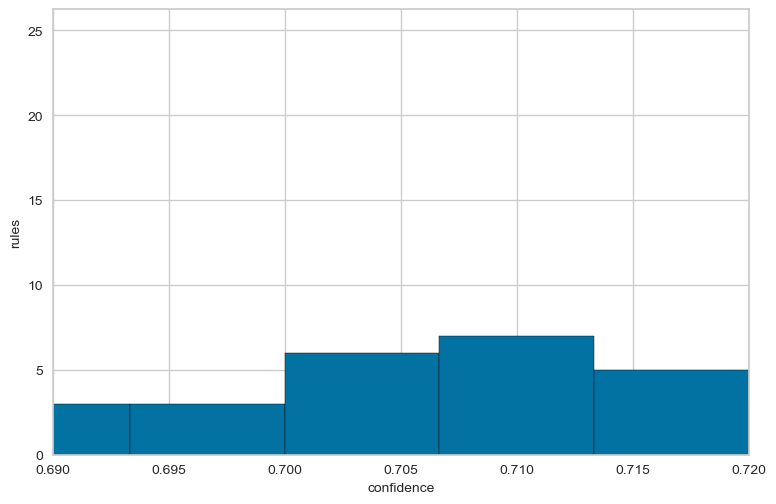

In [861]:
conf = []
for r in rules :
    conf.append(r[4])
    
plt.hist(conf, bins=60, edgecolor='black')
plt.xlabel('confidence', fontsize=10)
plt.ylabel('rules', fontsize=10)
plt.xlim(0.69, 0.72)

Text(0, 0.5, 'rules')

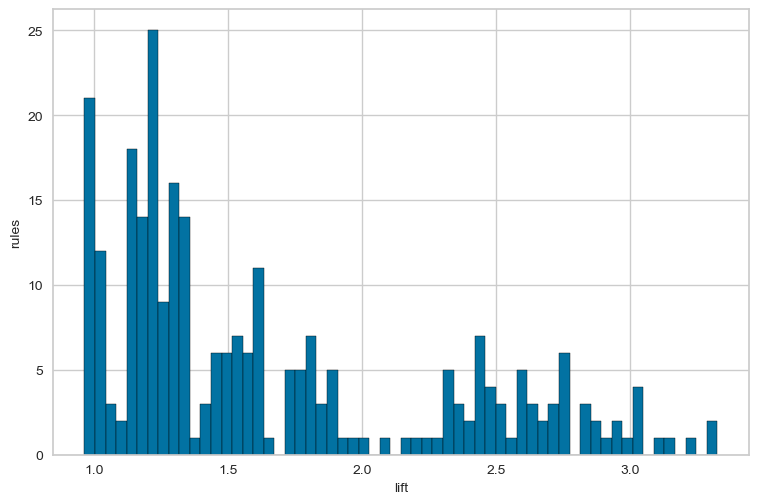

In [862]:
conf = []
for r in rules :
    conf.append(r[5])
    
plt.hist(conf, bins=60, edgecolor='black')
plt.xlabel('lift', fontsize=10)
plt.ylabel('rules', fontsize=10)
# plt.xlim(1.5, 2)

In [863]:
conf

[3.3238743801652895,
 3.310631852754272,
 3.2100918542934007,
 3.1282867212134953,
 3.08928296583799,
 3.0448693321420595,
 3.0403820972416016,
 3.035468333816365,
 3.0246695282636087,
 3.0070203501288546,
 2.9556809782973863,
 2.950586074650246,
 2.925502700592178,
 2.887694145758662,
 2.875263674270297,
 2.848075705194091,
 2.8467603369914642,
 2.828401319770296,
 2.759241873278237,
 2.7504322949777493,
 2.74157672895189,
 2.7412783541410235,
 2.7378604866208174,
 2.737343128252219,
 2.7334493257938233,
 2.7234101321875617,
 2.7149496390622008,
 2.6739088454299975,
 2.667384085291254,
 2.6525780439656037,
 2.6456128578029086,
 2.63338736679865,
 2.613726479705861,
 2.6134961954345215,
 2.602475339230306,
 2.6008191884480545,
 2.5802171658634783,
 2.5493172926947762,
 2.5027301668971282,
 2.5027301668971282,
 2.497769210131463,
 2.478866932455076,
 2.4772120027251994,
 2.4609623993107643,
 2.4590089726696607,
 2.455889736294738,
 2.4509455965116866,
 2.4296971269213308,
 2.42815020600

In [864]:
# asbolute support
rules[0][2]

208

In [865]:
# support as percentage
rules[0][3]

8.60570955730244

In [866]:
# confidence
rules[0][4]

0.832

In [867]:
# lift
rules[0][5]

3.3238743801652895

In [868]:
rules.sort(key=lambda x: x[4],reverse=True)

In [869]:
rules

[('speech',
  ('(14.095, 59.086]_Kur', '(140940.999, 172973.0]_FrameCount'),
  257,
  10.63301613570542,
  1.0,
  1.600662251655629),
 ('speech',
  ('(0.209, 0.318]_StftStd', '(140940.999, 172973.0]_FrameCount', 'M'),
  293,
  12.122465866776997,
  1.0,
  1.600662251655629),
 ('speech',
  ('(0.209, 0.318]_StftStd', '(140940.999, 172973.0]_FrameCount'),
  307,
  12.701696317749276,
  1.0,
  1.600662251655629),
 ('speech',
  ('(140940.999, 172973.0]_FrameCount', 'normal'),
  448,
  18.53537443111295,
  0.9977728285077951,
  1.5970973023200932),
 ('speech',
  ('(140940.999, 172973.0]_FrameCount', 'Kids are talking by the door'),
  296,
  12.246586677699629,
  0.9966329966329966,
  1.5952728164648695),
 ('speech',
  ('(140940.999, 172973.0]_FrameCount', 'M', 'normal'),
  250,
  10.34340091021928,
  0.9960159362549801,
  1.594285111210786),
 ('speech',
  ('(0.0036699999999999997, 0.0554]_Max', '(140940.999, 172973.0]_FrameCount'),
  245,
  10.136532892014895,
  0.9959349593495935,
  1.59415

In [870]:
for r in rules:
    if r[0] == 'speech':
        print(r)

('speech', ('(14.095, 59.086]_Kur', '(140940.999, 172973.0]_FrameCount'), 257, 10.63301613570542, 1.0, 1.600662251655629)
('speech', ('(0.209, 0.318]_StftStd', '(140940.999, 172973.0]_FrameCount', 'M'), 293, 12.122465866776997, 1.0, 1.600662251655629)
('speech', ('(0.209, 0.318]_StftStd', '(140940.999, 172973.0]_FrameCount'), 307, 12.701696317749276, 1.0, 1.600662251655629)
('speech', ('(140940.999, 172973.0]_FrameCount', 'normal'), 448, 18.53537443111295, 0.9977728285077951, 1.5970973023200932)
('speech', ('(140940.999, 172973.0]_FrameCount', 'Kids are talking by the door'), 296, 12.246586677699629, 0.9966329966329966, 1.5952728164648695)
('speech', ('(140940.999, 172973.0]_FrameCount', 'M', 'normal'), 250, 10.34340091021928, 0.9960159362549801, 1.594285111210786)
('speech', ('(0.0036699999999999997, 0.0554]_Max', '(140940.999, 172973.0]_FrameCount'), 245, 10.136532892014895, 0.9959349593495935, 1.5941554945350778)
('speech', ('(140940.999, 172973.0]_FrameCount', 'M'), 385, 15.9288374

In [871]:
for q in rules:
    if q[0] == 'song':
        print(q)

('song', ('(217818.0, 305906.0]_FrameCount', '(1.7570000000000001, 6.53]_Kur'), 338, 13.984278030616467, 0.9234972677595629, 2.4609623993107643)
('song', ('(217818.0, 305906.0]_FrameCount', '(0.349, 0.392]_StftStd'), 227, 9.391808026479106, 0.9227642276422764, 2.4590089726696607)
('song', ('(217818.0, 305906.0]_FrameCount', 'normal'), 279, 11.543235415804716, 0.9117647058823529, 2.4296971269213308)
('song', ('(1.7570000000000001, 6.53]_Kur', 'M'), 277, 11.460488208522962, 0.9111842105263158, 2.428150206000116)
('song', ('(217818.0, 305906.0]_FrameCount', 'Dogs are sitting by the door'), 254, 10.508895324782788, 0.8881118881118881, 2.366666409665307)
('song', ('(0.349, 0.392]_StftStd', '(1.7570000000000001, 6.53]_Kur'), 221, 9.143566404633843, 0.8875502008032129, 2.365169608976147)
('song', ('(1.7570000000000001, 6.53]_Kur', 'normal'), 338, 13.984278030616467, 0.8733850129198967, 2.3274218039993277)
('song', ('(217818.0, 305906.0]_FrameCount', 'F'), 270, 11.170872983036823, 0.8681672025

In [872]:
from sklearn.model_selection import train_test_split

train,test = train_test_split(new_df,  random_state=1)

In [873]:
pattern_df = test
pattern_df

,vocal_channel,emotional_intensity,statement,sex,kur_bin,max_bin,frame_count_bin,stft_std_bin
539,song,normal,Dogs are sitting by the door,M,"(1.7570000000000001, 6.53]_Kur","(0.0036699999999999997, 0.0554]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd"
947,song,normal,Kids are talking by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.109, 0.225]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd"
1843,speech,normal,Kids are talking by the door,M,"(14.095, 59.086]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.209, 0.318]_StftStd"
298,song,normal,Kids are talking by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.109, 0.225]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd"
1078,speech,normal,Dogs are sitting by the door,M,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.209, 0.318]_StftStd"
...,...,...,...,...,...,...,...,...
2194,song,strong,Kids are talking by the door,M,"(6.53, 9.834]_Kur","(0.225, 0.999]_Max","(192192.0, 217818.0]_FrameCount","(0.334, 0.349]_StftStd"
1440,speech,normal,Kids are talking by the door,F,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd"
1661,speech,normal,Dogs are sitting by the door,F,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.349, 0.392]_StftStd"
2345,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.225, 0.999]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd"


In [874]:
test.columns

Index(['vocal_channel', 'emotional_intensity', 'statement', 'sex', 'kur_bin',
       'max_bin', 'frame_count_bin', 'stft_std_bin'],
      dtype='object')

In [875]:
test['Prediction'] = "NotPredicted"
test

,vocal_channel,emotional_intensity,statement,sex,kur_bin,max_bin,frame_count_bin,stft_std_bin,Prediction
539,song,normal,Dogs are sitting by the door,M,"(1.7570000000000001, 6.53]_Kur","(0.0036699999999999997, 0.0554]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd",NotPredicted
947,song,normal,Kids are talking by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.109, 0.225]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd",NotPredicted
1843,speech,normal,Kids are talking by the door,M,"(14.095, 59.086]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.209, 0.318]_StftStd",NotPredicted
298,song,normal,Kids are talking by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.109, 0.225]_Max","(217818.0, 305906.0]_FrameCount","(0.349, 0.392]_StftStd",NotPredicted
1078,speech,normal,Dogs are sitting by the door,M,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.209, 0.318]_StftStd",NotPredicted
...,...,...,...,...,...,...,...,...,...
2194,song,strong,Kids are talking by the door,M,"(6.53, 9.834]_Kur","(0.225, 0.999]_Max","(192192.0, 217818.0]_FrameCount","(0.334, 0.349]_StftStd",NotPredicted
1440,speech,normal,Kids are talking by the door,F,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
1661,speech,normal,Dogs are sitting by the door,F,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.349, 0.392]_StftStd",NotPredicted
2345,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.225, 0.999]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted


In [876]:
test[(test["vocal_channel"]=="speech") & (test["stft_std_bin"]=="(0.318, 0.334]_StftStd")]

,vocal_channel,emotional_intensity,statement,sex,kur_bin,max_bin,frame_count_bin,stft_std_bin,Prediction
929,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.0036699999999999997, 0.0554]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
1050,speech,normal,Dogs are sitting by the door,M,"(14.095, 59.086]_Kur","(0.0554, 0.109]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
1310,speech,strong,Dogs are sitting by the door,M,"(9.834, 14.095]_Kur","(0.109, 0.225]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
17,speech,strong,Kids are talking by the door,F,"(14.095, 59.086]_Kur","(0.225, 0.999]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
2142,speech,normal,Kids are talking by the door,M,"(9.834, 14.095]_Kur","(0.109, 0.225]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
...,...,...,...,...,...,...,...,...,...
2059,speech,normal,Kids are talking by the door,M,"(6.53, 9.834]_Kur","(0.109, 0.225]_Max","(192192.0, 217818.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
970,speech,strong,Kids are talking by the door,F,"(9.834, 14.095]_Kur","(0.225, 0.999]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
1440,speech,normal,Kids are talking by the door,F,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
2345,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.225, 0.999]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted


In [877]:
test[test["vocal_channel"]=="song"]["stft_std_bin"].unique()

array(['(0.349, 0.392]_StftStd', '(0.334, 0.349]_StftStd',
       '(0.318, 0.334]_StftStd', '(0.209, 0.318]_StftStd'], dtype=object)

In [878]:
test[test["stft_std_bin"]=="(0.318, 0.334]_StftStd"]

,vocal_channel,emotional_intensity,statement,sex,kur_bin,max_bin,frame_count_bin,stft_std_bin,Prediction
929,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.0036699999999999997, 0.0554]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
2215,song,strong,Dogs are sitting by the door,M,"(1.7570000000000001, 6.53]_Kur","(0.0554, 0.109]_Max","(217818.0, 305906.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
2420,song,normal,Dogs are sitting by the door,M,"(1.7570000000000001, 6.53]_Kur","(0.109, 0.225]_Max","(217818.0, 305906.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
1050,speech,normal,Dogs are sitting by the door,M,"(14.095, 59.086]_Kur","(0.0554, 0.109]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
829,song,normal,Kids are talking by the door,M,"(1.7570000000000001, 6.53]_Kur","(0.225, 0.999]_Max","(217818.0, 305906.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
...,...,...,...,...,...,...,...,...,...
2059,speech,normal,Kids are talking by the door,M,"(6.53, 9.834]_Kur","(0.109, 0.225]_Max","(192192.0, 217818.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
970,speech,strong,Kids are talking by the door,F,"(9.834, 14.095]_Kur","(0.225, 0.999]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
1440,speech,normal,Kids are talking by the door,F,"(6.53, 9.834]_Kur","(0.0036699999999999997, 0.0554]_Max","(140940.999, 172973.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted
2345,speech,strong,Dogs are sitting by the door,F,"(1.7570000000000001, 6.53]_Kur","(0.225, 0.999]_Max","(172973.0, 192192.0]_FrameCount","(0.318, 0.334]_StftStd",NotPredicted


In [879]:
test["stft_std_bin"].iloc[0]

'(0.349, 0.392]_StftStd'

In [880]:
len_r = []
for i in range(1, 20+1): #support
    len_r_wrt_i = []
    for j in range(60, 80+1): #confidence
        rules = apriori(X, target='r', supp=i, zmin=3, conf=j, report='aScl')
        
        len_r_wrt_i.append(len(rules)) # study your characteristics/properties here
        
    len_r.append(len_r_wrt_i)

In [881]:
rules

[('speech',
  ('(0.209, 0.318]_StftStd', 'M'),
  516,
  21.348779478692595,
  0.9297297297297298,
  1.4881832826203687),
 ('M',
  ('(0.209, 0.318]_StftStd', 'speech'),
  516,
  21.348779478692595,
  0.9148936170212766,
  1.7978031482442485)]

In [882]:
len_r_wrt_i

[28, 20, 16, 12, 10, 8, 8, 5, 5, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

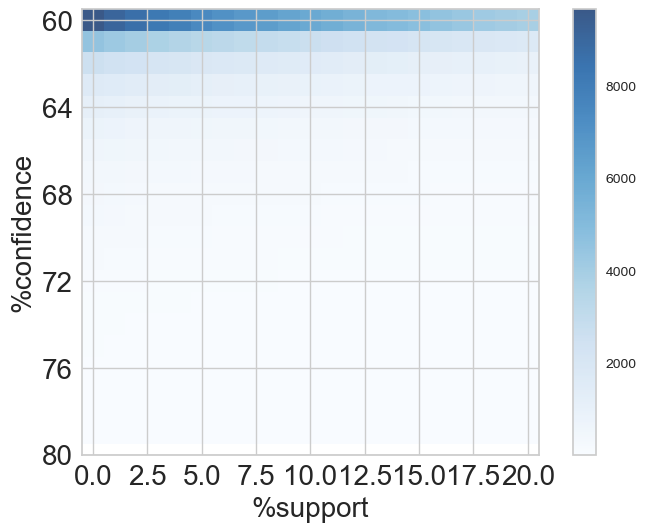

In [883]:
plt.imshow( len_r, cmap='Blues', alpha=0.8 )
plt.xlabel('%support', fontsize=20)
plt.ylabel('%confidence', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks( np.arange(0,20+1,4), np.arange(60,80+1,4), fontsize=20  )
plt.colorbar()

plt.show()

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'rules')

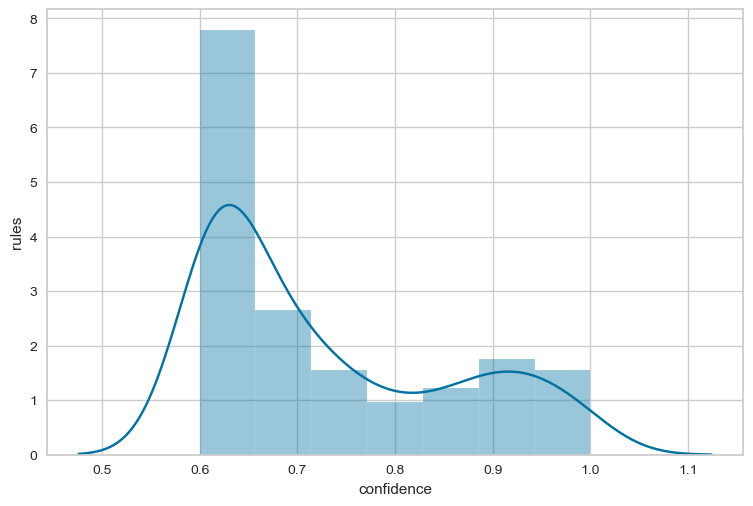

In [884]:
sns.distplot(rules_df["confidence"])
plt.xlabel("confidence")
plt.ylabel("rules")

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'rules')

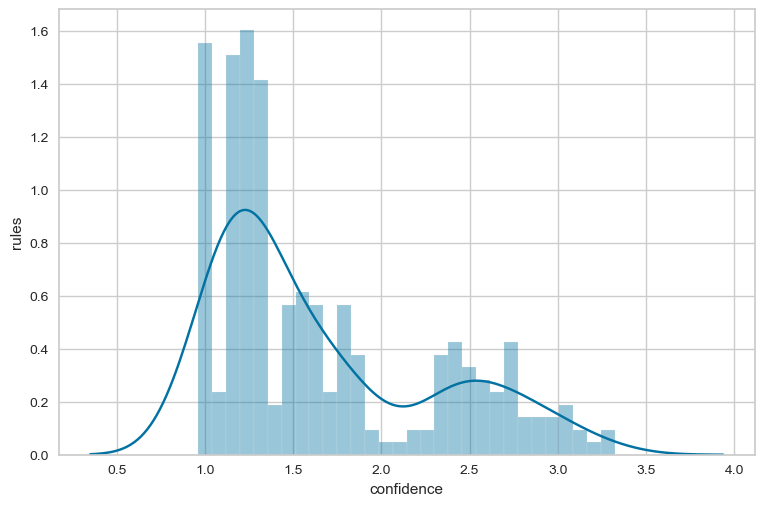

In [885]:
sns.distplot(rules_df["lift"], bins=30)
plt.xlabel("confidence")
plt.ylabel("rules")

In [887]:
rules_df.iloc[199]

consequent                                                  speech
antecedent       ((0.209, 0.318]_StftStd, Dogs are sitting by t...
abs_support                                                    275
%_support                                                11.377741
confidence                                                0.925926
lift                                                      1.482095
%_abs_support                                            91.362126
Name: 199, dtype: object

In [888]:
# rules[48]

In [889]:
# Classification
rules_df[(rules_df["%_support"]<=14)].sort_values(by="%_support", ascending=False)["consequent"]

16                                  song
167       (1.7570000000000001, 6.53]_Kur
165                               normal
166                                 song
18       (217818.0, 305906.0]_FrameCount
                     ...                
174    (140940.999, 172973.0]_FrameCount
70                                normal
81                                speech
12        (1.7570000000000001, 6.53]_Kur
62          Dogs are sitting by the door
Name: consequent, Length: 242, dtype: object

In [890]:
# len(# Classification
# rules_df[(rules_df["%_support"]<=7)].sort_values(by="%_support", ascending=False)["consequent"])

In [891]:
# # Classification
# rules_df[(rules_df["%_support"]<=7)].sort_values(by="%_support", ascending=False)["consequent"].value_counts() * 100/21

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

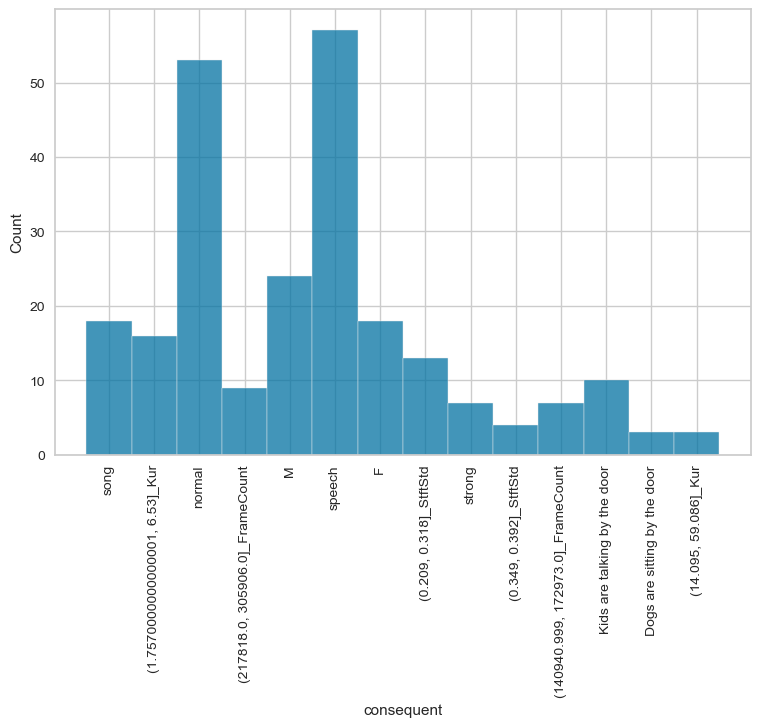

In [892]:
sns.histplot(rules_df[(rules_df["%_support"]<=14)].sort_values(by="%_support", ascending=False)["consequent"])
plt.xticks(rotation = 90)